# Modelo de predicción de la lesividad

## Punto de partida

In [1]:
# Se cargan las librerías necesarias
import pandas as pd
import numpy as np
import datetime as dt
import matplotlib.pyplot as plt
import matplotlib.style as style
from matplotlib.colors import ListedColormap
style.use('ggplot')
import seaborn as sns
import zipfile
import requests
from io import BytesIO
import calendar
import locale
from dateutil.relativedelta import relativedelta
from category_encoders import MEstimateEncoder
import re
from sklearn.preprocessing import OrdinalEncoder, LabelEncoder, StandardScaler, MinMaxScaler, normalize
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold
from sklearn.cluster import KMeans, AgglomerativeClustering
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score, adjusted_rand_score, classification_report, make_scorer, recall_score, precision_score, f1_score, roc_auc_score, accuracy_score, ConfusionMatrixDisplay, roc_curve, confusion_matrix, accuracy_score, precision_score, recall_score, auc
from sklearn.decomposition import PCA
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
import scipy.cluster.hierarchy as shc
from scipy.spatial import distance_matrix
from sklearn.linear_model import LogisticRegression, RidgeClassifier, SGDClassifier
from sklearn.feature_selection import SelectKBest, f_classif, chi2, mutual_info_classif, SelectFromModel
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC, LinearSVC
from sklearn.naive_bayes import GaussianNB
from scipy.stats import boxcox
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import BaggingClassifier, RandomForestClassifier
#import tensorflow as tf
from xgboost import XGBClassifier
from imblearn.over_sampling import RandomOverSampler, SMOTE
from imblearn.combine import SMOTETomek
from imblearn.pipeline import Pipeline as imbalanced_pipeline
import shap


Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)


In [116]:
# Se carga el fichero de partida
#df_accidentes = pd.read_csv('./Datasets/accidentes_limpio_v3.csv', delimiter=';', encoding='latin-1')

In [2]:
df_accidentes = pd.read_csv('./Datasets/accidentes_limpio_v2.csv', delimiter=';', encoding='latin-1')
df_accidentes.drop(columns=['pmed_C30', 'pmed_URB', 'momento_dia_acc'], inplace=True)
# Se renombran las columnas
nombres_columnas = ['clase_via_acc', 'nombre_via_acc', 'numero_via_acc',
       'nom_distrito', 'nom_barrio', 'implicados', 'implicados_peatones',
       'implicados_pesados', 'implicados_turismos', 'implicados_motocicletas',
       'implicados_bicicletas', 'implicados_otros',
       'implicados_ligeros', 'lesividad', 'utm_x_acc', 'utm_y_acc',
       'prueba_droga_pos', 'intensidad_trafico', 'ocupacion_via', 'carga_via', 'vmed', 'cruce',
       'gravedad', 'año_acc', 'mes_acc', 'dia_semana_acc', 'dia_mes_acc', 'hora_acc',
       'tipo_accidente_alcance',
       'atropello_a_animal', 'caida',
       'choque_contra_obstaculo_fijo',
       'colision_frontal',
       'colision_fronto-lateral',
       'colisión_lateral', 'colision_multiple',
       'tipo_accidente_otro', 'solo_salida_de_la_via',
       'vuelco', 'cielo_despejado',
       'granizando', 'lluvia_intensa', 'lluvia_debil',
       'cielo_nublado', 'estado_meteo_desconocido', 'bicicleta_EPAC',
       'es_conductor', 'es_pasajero', 'sexo_desconocido', 'sexo_hombre', 
       'prueba_alcohol_pos', 'anillo_verde_ciclista', 'giros_y_sentidos',
       'ruta_no_ciclista', 'via_exclusiva_bici',
       'via_preferente_bici', 'via_uso_compartido', 'media_edad']
df_accidentes.columns = nombres_columnas

In [3]:
df_accidentes.columns

Index(['clase_via_acc', 'nombre_via_acc', 'numero_via_acc', 'nom_distrito',
       'nom_barrio', 'implicados', 'implicados_peatones', 'implicados_pesados',
       'implicados_turismos', 'implicados_motocicletas',
       'implicados_bicicletas', 'implicados_otros', 'implicados_ligeros',
       'lesividad', 'utm_x_acc', 'utm_y_acc', 'prueba_droga_pos',
       'intensidad_trafico', 'ocupacion_via', 'carga_via', 'vmed', 'cruce',
       'gravedad', 'año_acc', 'mes_acc', 'dia_semana_acc', 'dia_mes_acc',
       'hora_acc', 'tipo_accidente_alcance', 'atropello_a_animal', 'caida',
       'choque_contra_obstaculo_fijo', 'colision_frontal',
       'colision_fronto-lateral', 'colisión_lateral', 'colision_multiple',
       'tipo_accidente_otro', 'solo_salida_de_la_via', 'vuelco',
       'cielo_despejado', 'granizando', 'lluvia_intensa', 'lluvia_debil',
       'cielo_nublado', 'estado_meteo_desconocido', 'bicicleta_EPAC',
       'es_conductor', 'es_pasajero', 'sexo_desconocido', 'sexo_hombre',
     

## Clustering

### Preparación de los datos

In [35]:
# Se divide entre variables y target
target = df_accidentes[["gravedad","lesividad"]]
variables = df_accidentes.drop(["gravedad","lesividad"], axis=1, inplace=False)

In [36]:
# Así quedaría el nuevo dataset de variables sin la target
variables.head()

,clase_via_acc,nombre_via_acc,numero_via_acc,nom_distrito,nom_barrio,implicados,implicados_peatones,implicados_pesados,implicados_turismos,implicados_motocicletas,...,sexo_desconocido,sexo_hombre,prueba_alcohol_pos,anillo_verde_ciclista,giros_y_sentidos,ruta_no_ciclista,via_exclusiva_bici,via_preferente_bici,via_uso_compartido,media_edad
0,0.063953,0.943021,32,0.080276,0.290194,3,0.0,0.0,0.0,2.0,...,0,1,0,0,0,0,0,0,1,72.0
1,0.023256,0.000154,2,0.080276,0.290194,2,0.0,0.0,1.0,0.0,...,0,0,0,0,0,0,1,0,0,47.0
2,0.023256,0.000100,37,0.080276,0.290194,1,0.0,0.0,0.0,0.0,...,0,1,0,0,0,1,0,0,0,27.0
3,0.023256,0.031359,23,0.080276,0.290194,2,1.0,0.0,0.0,0.0,...,0,1,0,1,0,0,0,0,0,32.0
4,0.023256,0.031359,23,0.080276,0.290194,2,1.0,0.0,0.0,0.0,...,0,1,0,1,0,0,0,0,0,32.0


In [37]:
variables.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3920 entries, 0 to 3919
Data columns (total 55 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   clase_via_acc                 3920 non-null   float64
 1   nombre_via_acc                3920 non-null   float64
 2   numero_via_acc                3920 non-null   int64  
 3   nom_distrito                  3920 non-null   float64
 4   nom_barrio                    3920 non-null   float64
 5   implicados                    3920 non-null   int64  
 6   implicados_peatones           3920 non-null   float64
 7   implicados_pesados            3920 non-null   float64
 8   implicados_turismos           3920 non-null   float64
 9   implicados_motocicletas       3920 non-null   float64
 10  implicados_bicicletas         3920 non-null   float64
 11  implicados_otros              3920 non-null   float64
 12  implicados_ligeros            3920 non-null   float64
 13  utm

In [57]:
variables.nunique().sort_values(ascending=False)

utm_y_acc                       3490
utm_x_acc                       3479
numero_via_acc                   311
carga_via                         91
ocupacion_via                     80
vmed                              66
nom_barrio                        39
dia_mes_acc                       31
nombre_via_acc                    24
hora_acc                          24
nom_distrito                      21
media_edad                        18
clase_via_acc                     13
mes_acc                           12
implicados                         8
dia_semana_acc                     7
implicados_turismos                6
implicados_bicicletas              5
año_acc                            5
implicados_pesados                 5
implicados_motocicletas            4
implicados_peatones                3
es_conductor                       2
sexo_desconocido                   2
es_pasajero                        2
implicados_ligeros                 2
prueba_alcohol_pos                 2
b

In [58]:
variables.columns.sort_values(ascending=False)

Index(['vuelco', 'vmed', 'via_uso_compartido', 'via_preferente_bici',
       'via_exclusiva_bici', 'utm_y_acc', 'utm_x_acc', 'tipo_accidente_otro',
       'tipo_accidente_alcance', 'solo_salida_de_la_via', 'sexo_hombre',
       'sexo_desconocido', 'ruta_no_ciclista', 'prueba_droga_pos',
       'prueba_alcohol_pos', 'ocupacion_via', 'numero_via_acc',
       'nombre_via_acc', 'nom_distrito', 'nom_barrio', 'mes_acc', 'media_edad',
       'lluvia_intensa', 'lluvia_debil', 'implicados_turismos',
       'implicados_pesados', 'implicados_peatones', 'implicados_otros',
       'implicados_motocicletas', 'implicados_ligeros',
       'implicados_bicicletas', 'implicados', 'hora_acc', 'granizando',
       'giros_y_sentidos', 'estado_meteo_desconocido', 'es_pasajero',
       'es_conductor', 'dia_semana_acc', 'dia_mes_acc', 'cruce',
       'colisión_lateral', 'colision_multiple', 'colision_fronto-lateral',
       'colision_frontal', 'clase_via_acc', 'cielo_nublado', 'cielo_despejado',
       'choque

In [39]:
print(f'Hay {variables.shape[0]} filas y {variables.shape[1]} columnas en el dataset.')

Hay 3920 filas y 55 columnas en el dataset.


In [40]:
variables.describe(include='all').T

,count,mean,std,min,25%,50%,75%,max
clase_via_acc,3920.0,3.146036e-02,0.038755,5.807201e-14,2.325581e-02,2.325581e-02,3.361345e-02,1.000000e+00
nombre_via_acc,3920.0,3.418627e-02,0.121239,1.001881e-04,1.544773e-04,6.817149e-04,3.135889e-02,9.430211e-01
numero_via_acc,3920.0,2.997298e+02,2193.823935,1.000000e+00,6.000000e+00,2.400000e+01,6.700000e+01,5.700000e+04
nom_distrito,3920.0,3.165436e-02,0.030425,1.363430e-03,1.163911e-02,2.249493e-02,4.652360e-02,1.376777e-01
nom_barrio,3920.0,3.320372e-02,0.064813,5.501559e-04,7.648509e-04,1.254355e-03,4.911233e-02,3.359466e-01
implicados,3920.0,1.837755e+00,0.697170,1.000000e+00,1.000000e+00,2.000000e+00,2.000000e+00,9.000000e+00
implicados_peatones,3920.0,1.377551e-01,0.357764,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,2.000000e+00
implicados_pesados,3920.0,2.653061e-02,0.222056,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,8.000000e+00
implicados_turismos,3920.0,5.357143e-01,0.686508,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,5.000000e+00
implicados_motocicletas,3920.0,4.617347e-02,0.235117,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,4.000000e+00


In [41]:
variables.skew()

clase_via_acc                   16.325146
nombre_via_acc                   6.397042
numero_via_acc                  14.177198
nom_distrito                     1.739908
nom_barrio                       3.010377
implicados                       1.398237
implicados_peatones              2.399847
implicados_pesados              16.753895
implicados_turismos              1.495209
implicados_motocicletas          6.022437
implicados_bicicletas            0.352386
implicados_otros                12.406620
implicados_ligeros              62.609903
utm_x_acc                        0.511030
utm_y_acc                        0.516133
prueba_droga_pos                23.609921
ocupacion_via                    3.333103
carga_via                        0.860547
vmed                             3.369637
cruce                            0.260441
año_acc                          0.158292
mes_acc                          0.019703
dia_semana_acc                  -0.017882
dia_mes_acc                      0

### Reducción de dimensionalidad

In [42]:
# Primero se normaliza el conjunto de datos
scaler = MinMaxScaler()
variables_scaled = scaler.fit_transform(variables)
variables_scaled = pd.DataFrame(variables_scaled)
variables_scaled.columns = list(variables.columns)

In [43]:
# Veamos cómo queda el dataset normalizado
variables_scaled.head()

,clase_via_acc,nombre_via_acc,numero_via_acc,nom_distrito,nom_barrio,implicados,implicados_peatones,implicados_pesados,implicados_turismos,implicados_motocicletas,...,sexo_desconocido,sexo_hombre,prueba_alcohol_pos,anillo_verde_ciclista,giros_y_sentidos,ruta_no_ciclista,via_exclusiva_bici,via_preferente_bici,via_uso_compartido,media_edad
0,0.063953,1.000000,0.000544,0.578902,0.863587,0.250,0.0,0.0,0.0,0.5,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.827586
1,0.023256,0.000058,0.000018,0.578902,0.863587,0.125,0.0,0.0,0.2,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.540230
2,0.023256,0.000000,0.000632,0.578902,0.863587,0.000,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.310345
3,0.023256,0.033151,0.000386,0.578902,0.863587,0.125,0.5,0.0,0.0,0.0,...,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.367816
4,0.023256,0.033151,0.000386,0.578902,0.863587,0.125,0.5,0.0,0.0,0.0,...,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.367816


In [44]:
# Aplicamos PCA para reducir la dimensionalidad
pca = PCA(random_state=42)  # Empezamos con todos los componentes
variables_pca = pca.fit_transform(variables_scaled)

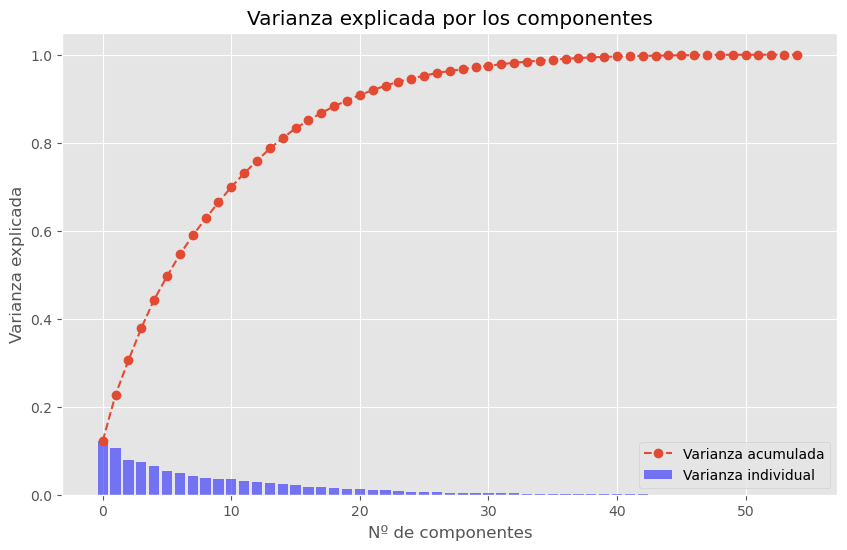

In [45]:
# Vamos a obtener el número óptimo de componentes
explained_variance_ratio = pca.explained_variance_ratio_
cumulative_variance_ratio = np.cumsum(explained_variance_ratio)
plt.figure(figsize=(10,6))

plt.bar(range(len(explained_variance_ratio)), explained_variance_ratio, alpha=0.5, align='center', label='Varianza individual', color='b')
plt.plot(range(len(explained_variance_ratio)), cumulative_variance_ratio, marker='o', linestyle= "--", label='Varianza acumulada')
plt.title('Varianza explicada por los componentes')
plt.xlabel('Nº de componentes')
plt.ylabel('Varianza explicada')
plt.legend(loc='lower right')
plt.show()

In [59]:
# Por lo general, se suele elegir el número de componentes que supera el 80-90% de la varianza explicada acumulada
# En este caso, elegiremos un 90%
n_components_optimal = np.argmax(cumulative_variance_ratio >= 0.90) + 1 

# De esta forma, nos quedamos con 10 componentes
print(f"El número óptimo de componentes es {n_components_optimal}")

El número óptimo de componentes es 21


In [60]:
# Aplicamos PCA con el número óptimo de componentes
pca_optimal = PCA(n_components=n_components_optimal)
variables_pca = pca_optimal.fit_transform(variables_scaled)

In [61]:
# Se vuelve a escalar
scaler = MinMaxScaler()
variables_pca = scaler.fit_transform(variables_pca)

### Clustering con KMeans

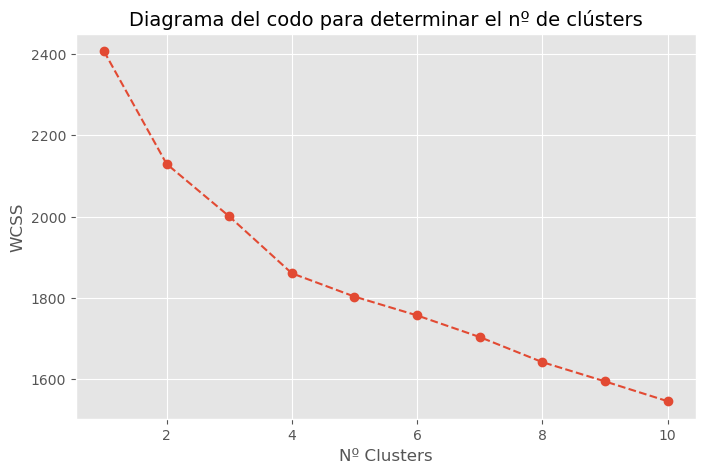

In [75]:
## Aplcamos el método del codo para determinar el número de clusters
wcss = []

rango_clusters = range(1,11)

for cluster in rango_clusters:
    kmeans = KMeans(n_clusters = cluster, init = 'k-means++', n_init='auto', random_state = 9)
    kmeans.fit(variables_pca)
    wcss.append(kmeans.inertia_)

## Representamos el diagrama del codo para determinar el número ideal de clústers
plt.figure(figsize=(8,5))

plt.plot(rango_clusters, wcss, 'o--')
plt.title('Diagrama del codo para determinar el nº de clústers', fontsize=14)
plt.xlabel('Nº Clusters')
plt.ylabel('WCSS')

plt.show()

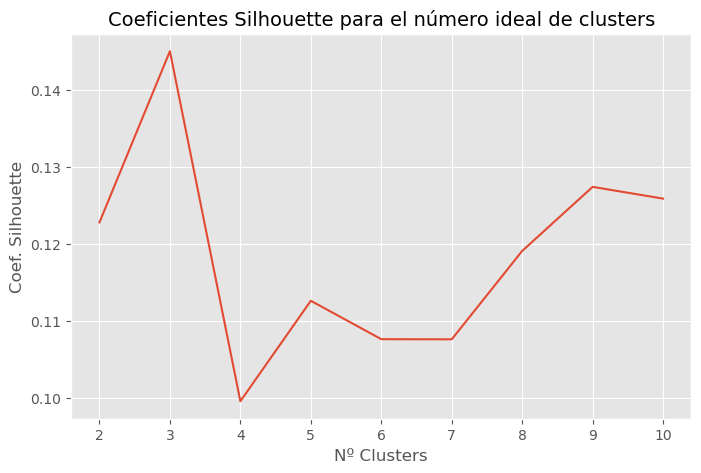

In [82]:
# Aplicamos el método Silhouette para determinar el número de clusters
silhouette_coef = []

rango_clusters = range(2,11)

for cluster in rango_clusters:
    kmeans = KMeans(n_clusters = cluster, init = 'k-means++', n_init='auto', random_state = 6)
    kmeans.fit(variables_pca)
    score = silhouette_score(variables_pca, kmeans.labels_)
    silhouette_coef.append(score)

## Representamos los coeficientes Silhouette
plt.figure(figsize=(8,5))
plt.plot(rango_clusters, silhouette_coef)
plt.xticks(rango_clusters)
plt.title('Coeficientes Silhouette para el número ideal de clusters', fontsize=14)
plt.xlabel('Nº Clusters')
plt.ylabel('Coef. Silhouette')
plt.show()

Siguiendo el método del codo, el número de clústers sería 3 o 45, mientras que según el método Silhouette el número óptimo de clústers es 3. De esta forma, se concluye que el número óptimo de clústers es 3

In [83]:
## Entrenamos el modelo KMeans con 3 clústers 
clusters = KMeans(n_clusters = 3, init = 'k-means++', random_state = 42)
y_kmeans = clusters.fit_predict(variables_pca)
y_kmeans

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning


array([2, 0, 1, ..., 2, 0, 0])

In [84]:
# Añadimos al dataset original los componentes calculados por PCA y el segmento obtenido por KMeans
df_segm_pca_kmeans = pd.concat([variables.reset_index(drop=True), pd.DataFrame(variables_pca)], axis=1)
df_segm_pca_kmeans.columns.values[-21:] = ["Component " + str(i) for i in range (1,22)]
df_segm_pca_kmeans['Segment K-means PCA'] = clusters.labels_

# Creamos el campo Cluster a partir de los segmentos
df_segm_pca_kmeans['Cluster'] = df_segm_pca_kmeans['Segment K-means PCA'].map({0:'Grupo 1', 1:'Grupo 2', 2:'Grupo 3', 3:'Grupo 4', 4:'Grupo 5', 5:'Grupo 6'})

# Mostramos las primeras filas
df_segm_pca_kmeans.head()

,clase_via_acc,nombre_via_acc,numero_via_acc,nom_distrito,nom_barrio,implicados,implicados_peatones,implicados_pesados,implicados_turismos,implicados_motocicletas,...,Component 14,Component 15,Component 16,Component 17,Component 18,Component 19,Component 20,Component 21,Segment K-means PCA,Cluster
0,0.063953,0.943021,32,0.080276,0.290194,3,0.0,0.0,0.0,2.0,...,0.267347,0.940939,0.456943,0.394011,0.451426,0.466981,0.297276,0.340711,2,Grupo 3
1,0.023256,0.000154,2,0.080276,0.290194,2,0.0,0.0,1.0,0.0,...,0.098326,0.640292,0.714286,0.553478,0.397443,0.503666,0.325121,0.373687,0,Grupo 1
2,0.023256,0.000100,37,0.080276,0.290194,1,0.0,0.0,0.0,0.0,...,0.405564,0.740616,0.544239,0.245477,0.419143,0.475567,0.349466,0.531036,1,Grupo 2
3,0.023256,0.031359,23,0.080276,0.290194,2,1.0,0.0,0.0,0.0,...,0.450156,0.675352,0.450314,0.215587,0.278514,0.474687,0.339290,0.580091,0,Grupo 1
4,0.023256,0.031359,23,0.080276,0.290194,2,1.0,0.0,0.0,0.0,...,0.717213,0.748231,0.490129,0.242243,0.131682,0.499535,0.364705,0.553577,0,Grupo 1


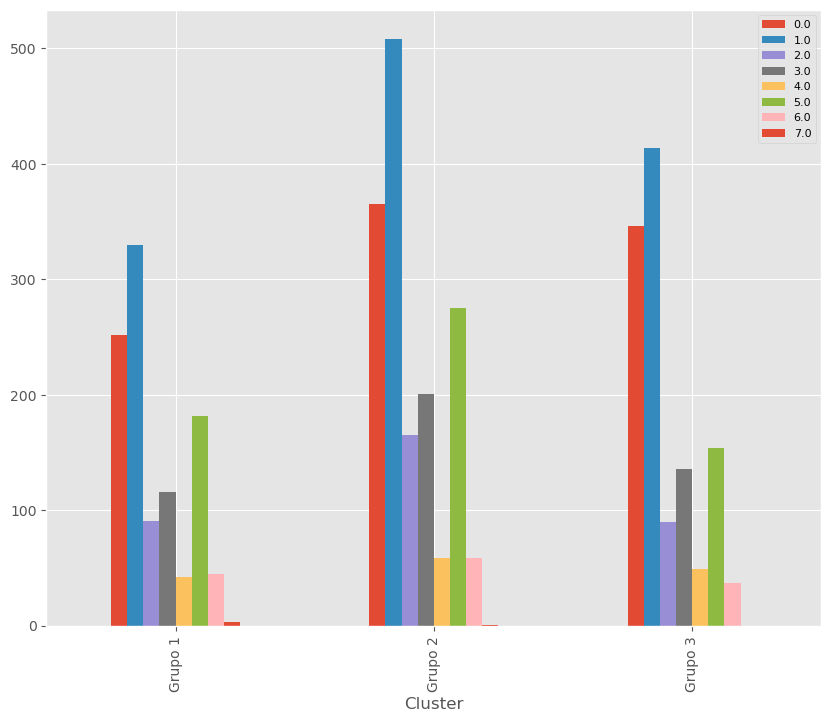

In [85]:
# Analizamos cómo se relacionan los 3 clusters con la lesividad
pd.DataFrame(df_segm_pca_kmeans).join(target).groupby(['Cluster','lesividad'])['clase_via_acc'].count().unstack(level=1).plot(kind='bar', figsize=(10,8))
plt.legend(loc='best', fontsize=8)
plt.show()

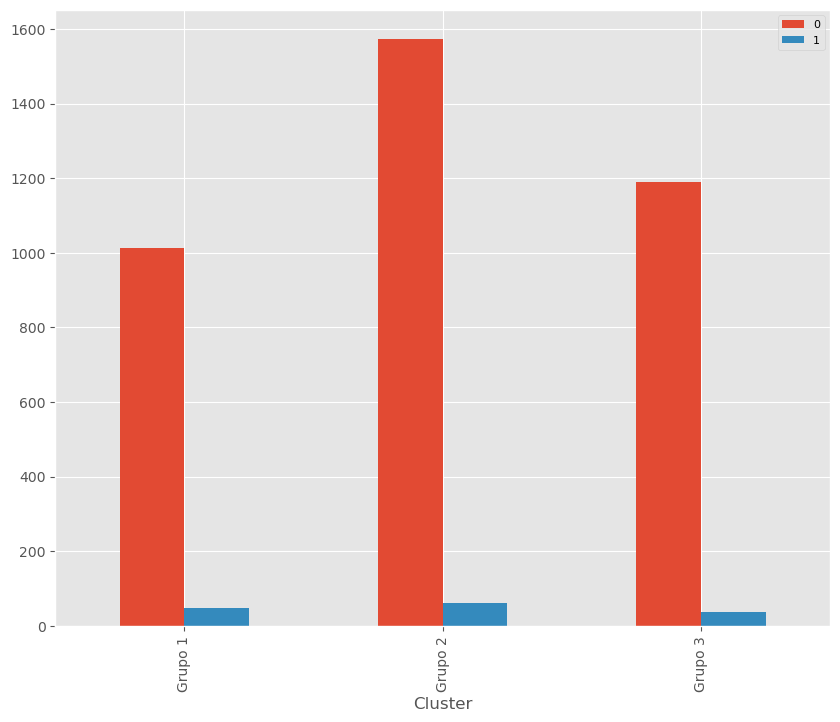

In [86]:
# Analizamos cómo se relacionan los 3 clusters con la gravedad
pd.DataFrame(df_segm_pca_kmeans).join(target).groupby(['Cluster','gravedad'])['clase_via_acc'].count().unstack(level=1).plot(kind='bar', figsize=(10,8))
plt.legend(loc='best', fontsize=8)
plt.show()

In [87]:
niveles_lesividad = ["Sin asistencia sanitaria", 
"Asistencia sanitaria sólo en el lugar del accidente", 
"Asistencia sanitaria inmediata en centro de salud o mutua", 
"Atención en urgencias sin posterior ingreso", 
"Asistencia sanitaria ambulatoria con posterioridad", 
"Ingreso inferior o igual a 24 horas", 
"Ingreso superior a 24 horas", 
"Fallecido 24 horas"]

enc = OrdinalEncoder(categories=[niveles_lesividad])

target['lesividad'] = enc.fit_transform(target[['lesividad']])

target

ValueError: could not convert string to float: 'Sin asistencia sanitaria'

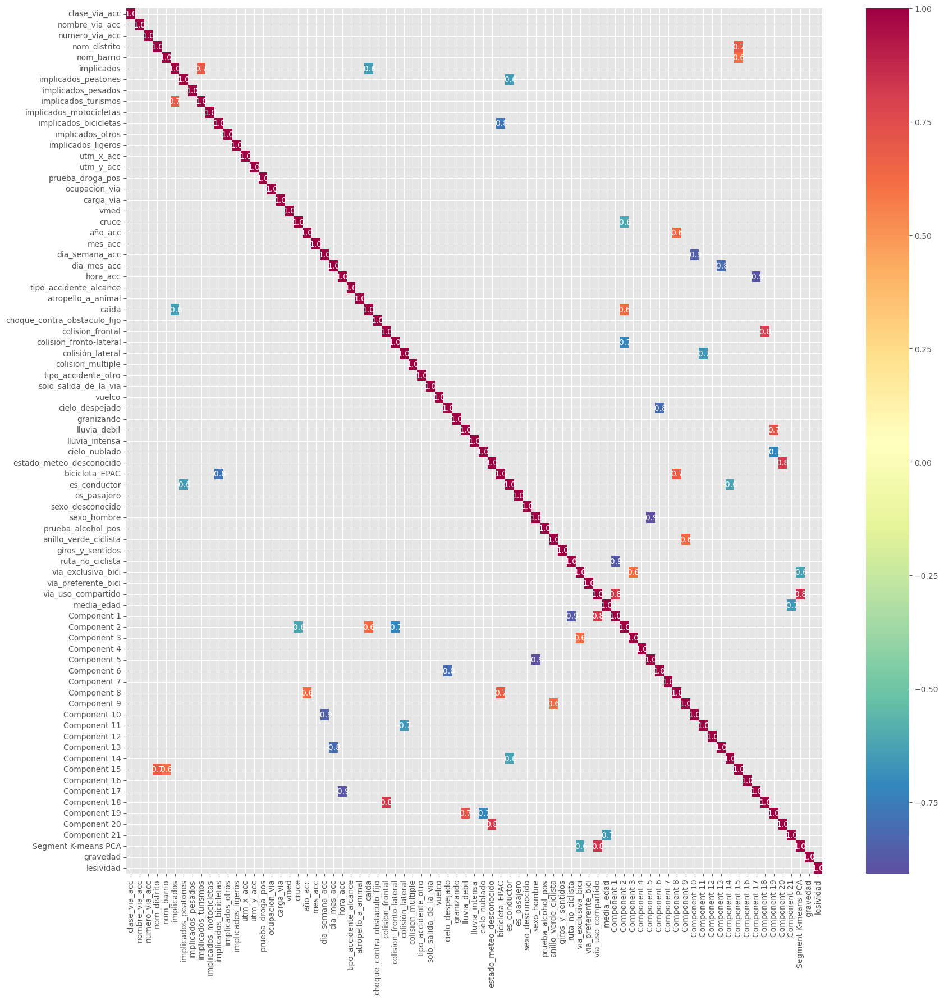

In [88]:
# Dado que hay tantas variables, se va a definir un umbral de correlación y se filtrará la matriz para ver solo las correlaciones por encima de dicho umbral
umbral = 0.6
a = pd.DataFrame(df_segm_pca_kmeans).drop(columns=['Cluster']).join(target).corr()
a_filtered = a[abs(a) > umbral]

plt.figure(figsize=(20, 20))

# Crea un mapa de calor con las correlaciones filtradas
hm = sns.heatmap(a_filtered, cbar=True, annot=True, square=False, fmt='.1f', annot_kws={'size': 10}, yticklabels=a.columns, xticklabels=a.columns, cmap="Spectral_r")
plt.style.use('ggplot')

plt.show()

The palette list has more values (6) than needed (3), which may not be intended.


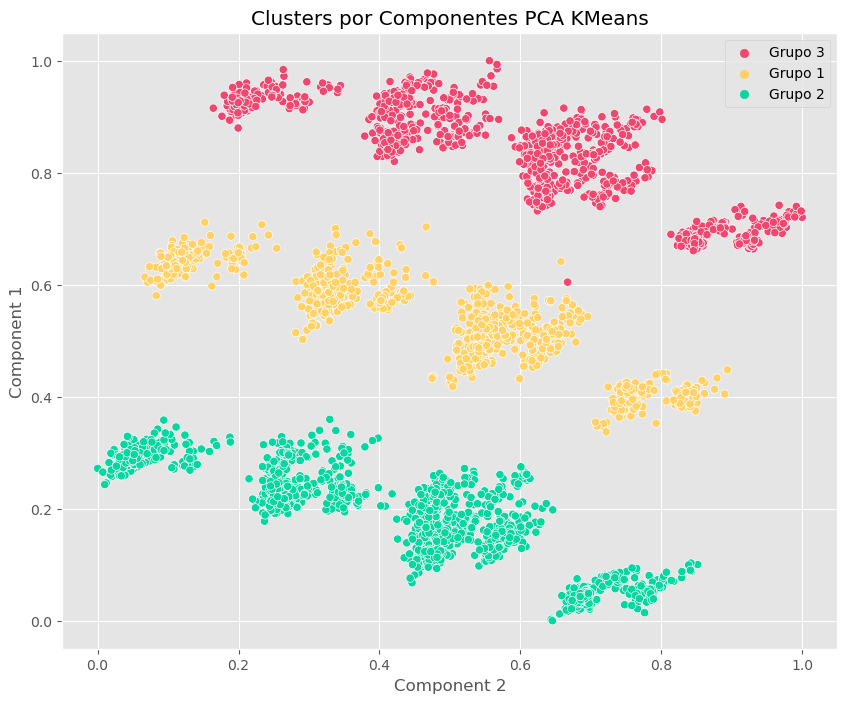

In [89]:
# Representamos los clústers a partir de los dos primeros componentes calculados por PCA
x_axis = df_segm_pca_kmeans['Component 2']
y_axis = df_segm_pca_kmeans['Component 1']
plt.figure(figsize=(10,8))
sns.scatterplot(x=x_axis, y=y_axis, hue=df_segm_pca_kmeans['Cluster'], palette=['#ef476f','#ffd166','#06d6a0','#118ab2','#073b4c','#6B4B3E'])
plt.title('Clusters por Componentes PCA KMeans')
plt.legend(loc='upper right')
plt.show()

### Clustering con Agglomerative Hierarchical Clustering

In [90]:
# En primer lugar, vamos a crear el dataframe que contenga los 21 componentes obtenidos por PCA
df_segm_pca_agglom = pd.concat([variables.reset_index(drop=True), pd.DataFrame(variables_pca)], axis=1)
df_segm_pca_agglom.columns.values[-21:] = ["Component " + str(i) for i in range (1,22)]

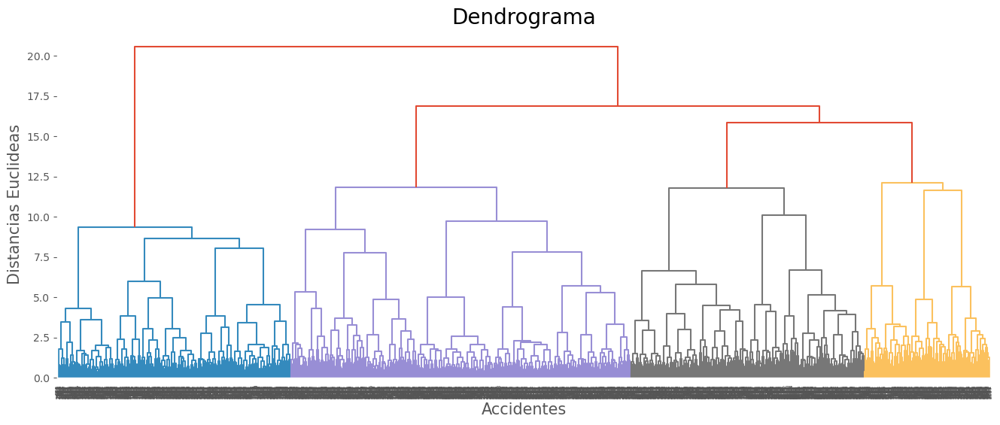

In [92]:
# Construimos el dendrograma para encontrar el número óptimo de clústers
X_Hierar = df_segm_pca_agglom[["Component " + str(i) for i in range (1,22)]]

plt.figure(figsize=(16,6))
dendrogram = shc.dendrogram(shc.linkage(X_Hierar, method = 'ward'))
plt.title('Dendrograma', fontsize=20)
plt.xlabel('Accidentes', fontsize=15)
plt.ylabel('Distancias Euclideas', fontsize=15)
plt.show()

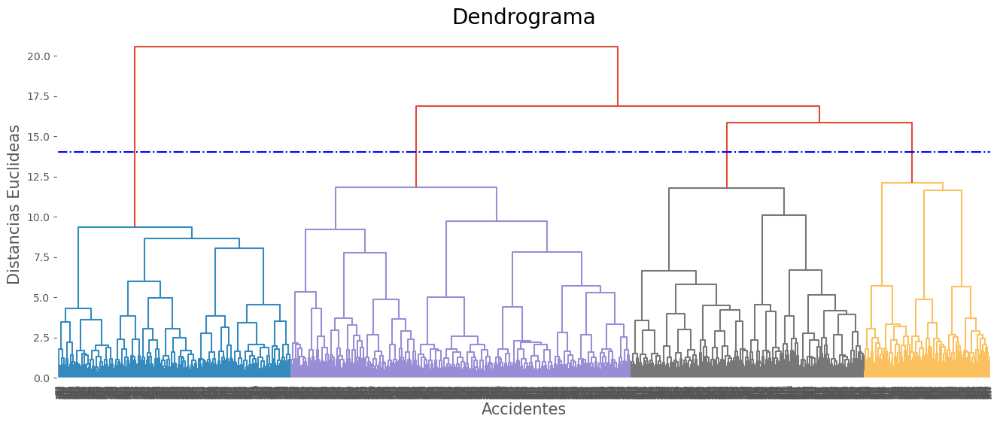

In [94]:
## Dibujamos el umbral que permite identificar el número ideal de clústers 
plt.figure(figsize=(16,6))
dendrogram = shc.dendrogram(shc.linkage(X_Hierar, method = 'ward'))
plt.axhline(y = 14, color = 'b', linestyle = 'dashdot')

plt.title('Dendrograma', fontsize=20)
plt.xlabel('Accidentes', fontsize=15)
plt.ylabel('Distancias Euclideas', fontsize=15)
plt.show()

In [97]:
# Al diferencia del modelo KMeans, el resultado del Dendrograma es que el número óptimo de clusters es 4
# Definimos el modelo aglomerativo con 5 clústers
agglom = AgglomerativeClustering(n_clusters=4, metric='euclidean', linkage='ward')

# Lo entrenamos con los datos tras aplicar PCA
agglom.fit(variables_pca)

y_agglom = agglom.fit_predict(variables_pca)
y_agglom

array([3, 1, 1, ..., 3, 1, 1], dtype=int64)

In [98]:
# Añadimos al dataset df_segm_pca_agglom el segmento obtenido por el modelo agglomerative
df_segm_pca_agglom['Segment Agglomerative PCA'] = agglom.labels_

# Creamos el campo Cluster a partir de los segmentos
df_segm_pca_agglom['Cluster'] = df_segm_pca_agglom['Segment Agglomerative PCA'].map({0:'Grupo 1', 1:'Grupo 2', 2:'Grupo 3', 3:'Grupo 4', 4:'Grupo 5'})

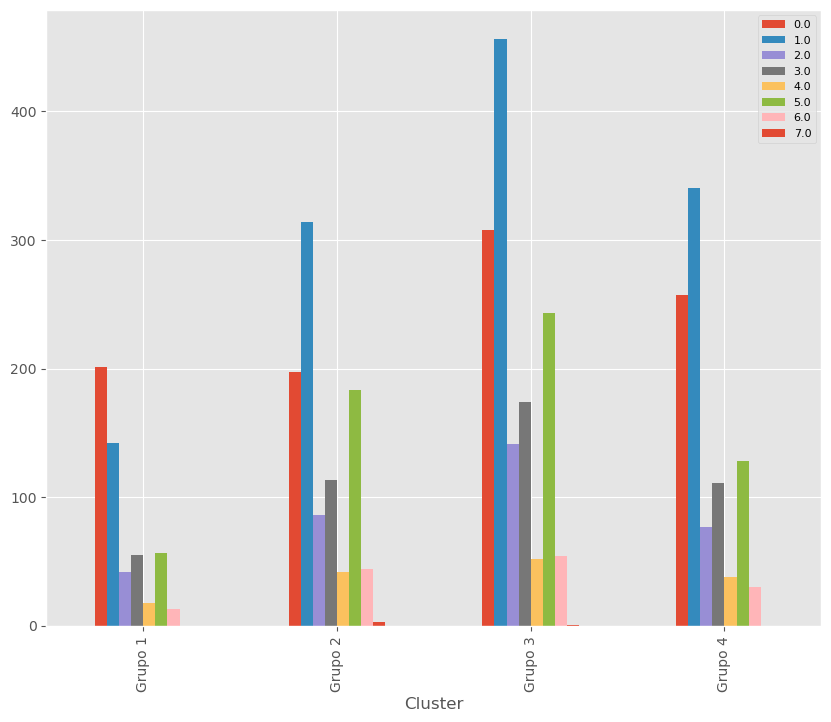

In [99]:
# Analizamos cómo se relacionan los 5 clusters con la lesividad
pd.DataFrame(df_segm_pca_agglom).join(target).groupby(['Cluster','lesividad'])['clase_via_acc'].count().unstack(level=1).plot(kind='bar', figsize=(10,8))
plt.legend(loc='best', fontsize=8)
plt.show()

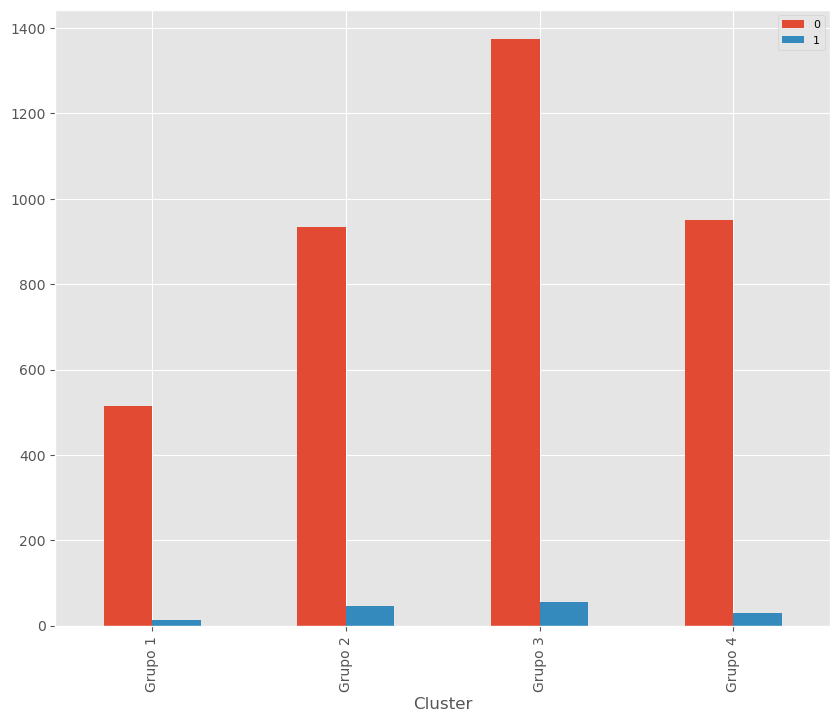

In [100]:
# Analizamos cómo se relacionan los 5 clusters con la gravedad
pd.DataFrame(df_segm_pca_agglom).join(target).groupby(['Cluster','gravedad'])['clase_via_acc'].count().unstack(level=1).plot(kind='bar', figsize=(10,8))
plt.legend(loc='best', fontsize=8)
plt.show()

The palette list has more values (5) than needed (4), which may not be intended.


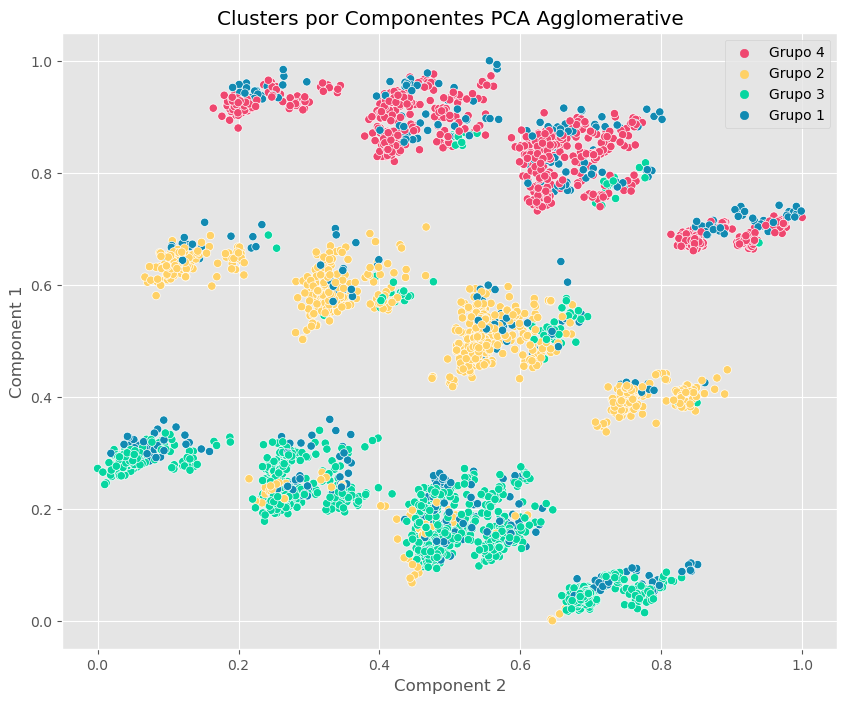

In [101]:
# Representamos los clústers a partir de los dos primeros componentes calculados por PCA
x_axis = df_segm_pca_agglom['Component 2']
y_axis = df_segm_pca_agglom['Component 1']
plt.figure(figsize=(10,8))
sns.scatterplot(x=x_axis, y=y_axis, hue=df_segm_pca_agglom['Cluster'], palette=['#ef476f','#ffd166','#06d6a0','#118ab2','#073b4c'])
plt.title('Clusters por Componentes PCA Agglomerative')
plt.legend(loc='upper right')
plt.show()

### Clustering con Gaussian Mixture

In [136]:
# Standardize data
std_scaler = StandardScaler()
variables_std_scaled = std_scaler.fit_transform(variables)

# Normalizing the Data 
variables_norm = normalize(variables_std_scaled) 
variables_norm = pd.DataFrame(variables_norm)
variables_norm.columns = list(variables.columns)

También se va a aplicar PCA para reducción de la dimensionalidad

In [137]:
# Aplicamos PCA para reducir la dimensionalidad
pca = PCA(random_state=42)  # Empezamos con todos los componentes
variables_norm_pca = pca.fit_transform(variables_norm)

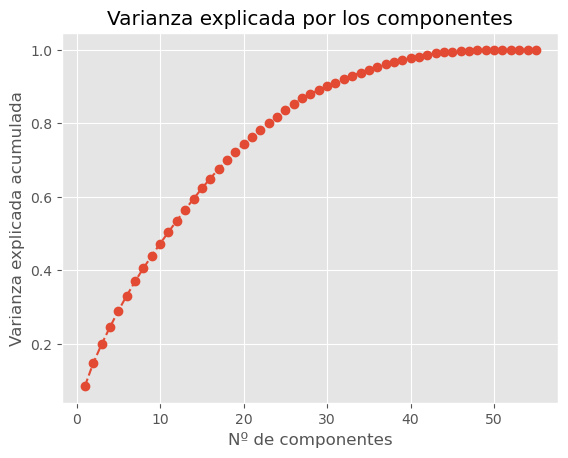

In [140]:
# Vamos a obtener el número óptimo de componentes
explained_variance_ratio = pca.explained_variance_ratio_
cumulative_variance_ratio = np.cumsum(explained_variance_ratio)
plt.plot(range(1,len(pca.explained_variance_ratio_)+1), cumulative_variance_ratio, marker='o', linestyle= "--")
plt.title('Varianza explicada por los componentes')
plt.xlabel('Nº de componentes')
plt.ylabel('Varianza explicada acumulada')
plt.show()

In [141]:
# Por lo general, se suele elegir el número de componentes que supera el 80-90% de la varianza explicada acumulada
# Al igual que antes, elegiremos un 90%
n_components_optimal = np.argmax(cumulative_variance_ratio >= 0.90) + 1 

# De esta forma, nos quedamos con 30 componentes
print(f"El número óptimo de componentes es {n_components_optimal}")

El número óptimo de componentes es 30


In [142]:
# Aplicamos PCA con el número óptimo de componentes
pca_optimal_norm = PCA(n_components=n_components_optimal)
variables_norm_pca = pca_optimal_norm.fit_transform(variables_norm)

In [143]:
# Convertimos a dataframe
variables_norm_pca = pd.DataFrame(variables_norm_pca) 
variables_norm_pca.columns = ["Component " + str(i) for i in range(1,31)]

In [144]:
variables_norm_pca.head()

,Component 1,Component 2,Component 3,Component 4,Component 5,Component 6,Component 7,Component 8,Component 9,Component 10,...,Component 21,Component 22,Component 23,Component 24,Component 25,Component 26,Component 27,Component 28,Component 29,Component 30
0,0.158970,-0.118027,0.045540,-0.166981,0.227808,0.063783,0.145312,-0.077101,-0.065825,0.000194,...,0.019835,0.560274,0.441013,-0.070837,-0.087049,-0.078009,0.199630,0.282109,-0.185663,-0.107720
1,0.137811,-0.318331,0.194627,-0.225767,0.339358,0.267061,0.047252,-0.121962,-0.156906,-0.084360,...,-0.023610,0.148572,0.020392,-0.039126,-0.266888,0.086036,0.092597,-0.166035,-0.030898,-0.134326
2,-0.345160,-0.305453,-0.246229,-0.049367,0.277540,0.161994,0.265877,-0.136347,-0.131960,-0.131687,...,-0.005112,0.172183,0.007854,0.003216,-0.367758,0.135802,0.075527,-0.117568,-0.058438,-0.053374
3,-0.174247,-0.287266,0.168906,-0.232357,0.268505,0.181373,0.268918,-0.104435,-0.085661,-0.047917,...,-0.205149,0.022505,-0.038540,-0.043261,-0.208697,0.012415,0.030349,-0.076020,-0.095487,-0.089906
4,-0.175046,-0.289829,0.366003,-0.145303,0.206105,0.155573,0.198301,-0.123701,-0.144690,-0.015112,...,-0.205345,0.004055,-0.043310,-0.031713,-0.211224,0.023439,0.008027,-0.054198,-0.205381,-0.020297


In [159]:
# Definimos el modelo
gmm = GaussianMixture(n_components = 3) 
gmm.fit(variables_norm_pca)

GaussianMixture(n_components=3)

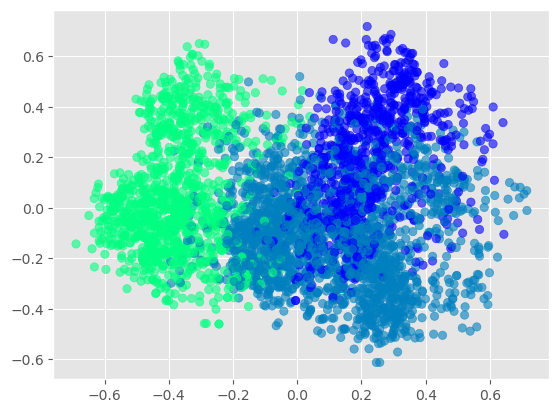

In [162]:
# Representamos el clustering 
plt.scatter(variables_norm_pca['Component 1'], variables_norm_pca['Component 2'],  
           c = GaussianMixture(n_components = 3, random_state=9).fit_predict(variables_norm_pca), cmap =plt.cm.winter, alpha = 0.6) 
plt.show() 

In [165]:
# Para encontrar el número óptimo de clústers, vamos a utilizar el Silhouette Score
def SelBest(arr:list, X:int)->list:
    '''
    returns the set of X configurations with shorter distance
    '''
    dx=np.argsort(arr)[:X]
    return arr[dx] 

In [166]:
n_clusters=np.arange(2, 8)
sils=[]
sils_err=[]
iterations=20
for n in n_clusters:
    tmp_sil=[]
    for _ in range(iterations):
        gmm=GaussianMixture(n, n_init=2).fit(variables_norm_pca) 
        labels=gmm.predict(variables_norm_pca)
        sil= silhouette_score(variables_norm_pca, labels, metric='euclidean')
        tmp_sil.append(sil)
    val=np.mean(SelBest(np.array(tmp_sil), int(iterations/5)))
    err=np.std(tmp_sil)
    sils.append(val)
    sils_err.append(err)

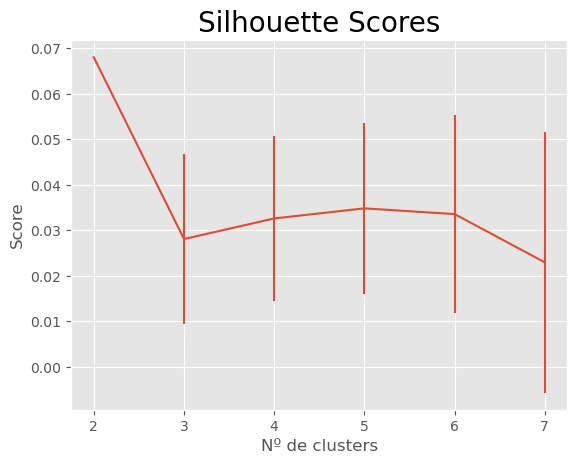

In [167]:
plt.errorbar(n_clusters, sils, yerr=sils_err)
plt.title("Silhouette Scores", fontsize=20)
plt.xticks(n_clusters)
plt.xlabel("Nº de clusters")
plt.ylabel("Score")
plt.show()

In [168]:
# Cuando más cerca esté de 1, mejor es la puntuación del Silhouette Scores. Por lo tanto, se seleccionan 2 clústers
gmm = GaussianMixture(n_components = 2) 
gmm.fit(variables_norm_pca)

GaussianMixture(n_components=2)

The palette list has more values (4) than needed (2), which may not be intended.


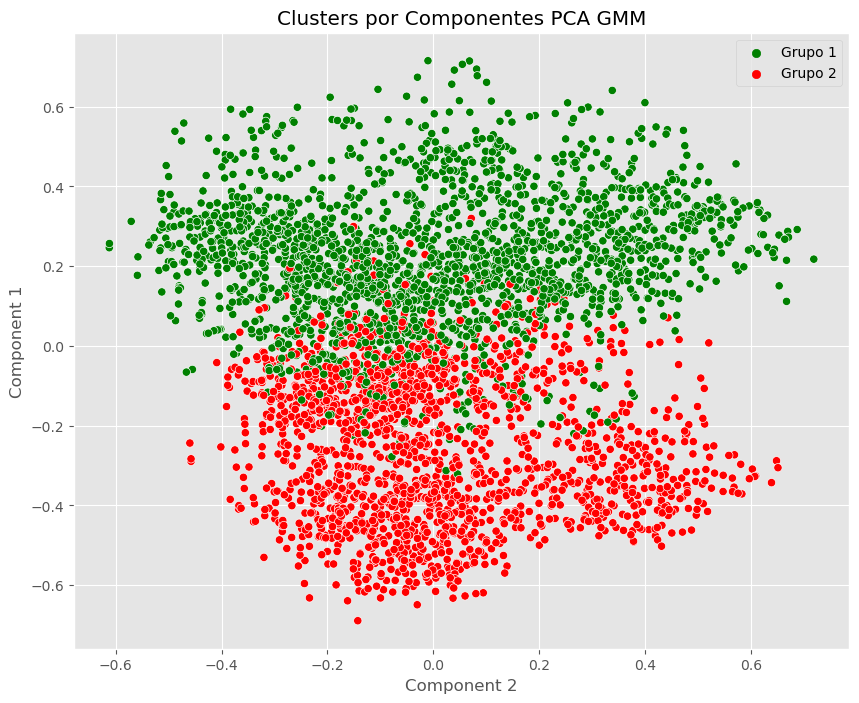

In [184]:
y_gmm= gmm.fit_predict(variables_norm_pca)

# Añadimos al dataset variables_norm_pca el segmento obtenido por el modelo Gaussian Mixture
df_segm_pca_gmm = variables_norm_pca.copy()
df_segm_pca_gmm['Segment GMM PCA'] = gmm.predict(variables_norm_pca)

# Creamos el campo Cluster a partir de los segmentos
df_segm_pca_gmm['Cluster'] = df_segm_pca_gmm['Segment GMM PCA'].map({0:'Grupo 1', 1:'Grupo 2', 2:'Grupo 3', 3:'Grupo 4', 4: 'Grupo 5', 5: 'Grupo 6', 6: 'Grupo 7', 7: 'Grupo 8', 8: 'Grupo 9', 9: 'Grupo 10'})

# Representamos los clústers a partir de los dos primeros componentes calculados por PCA
x_axis = df_segm_pca_gmm['Component 2']
y_axis = df_segm_pca_gmm['Component 1']
plt.figure(figsize=(10,8))
sns.scatterplot(x=x_axis, y=y_axis, hue=df_segm_pca_gmm['Cluster'], palette=['g','r','c','y'])
plt.title('Clusters por Componentes PCA GMM')
plt.legend(loc='upper right')
plt.show()

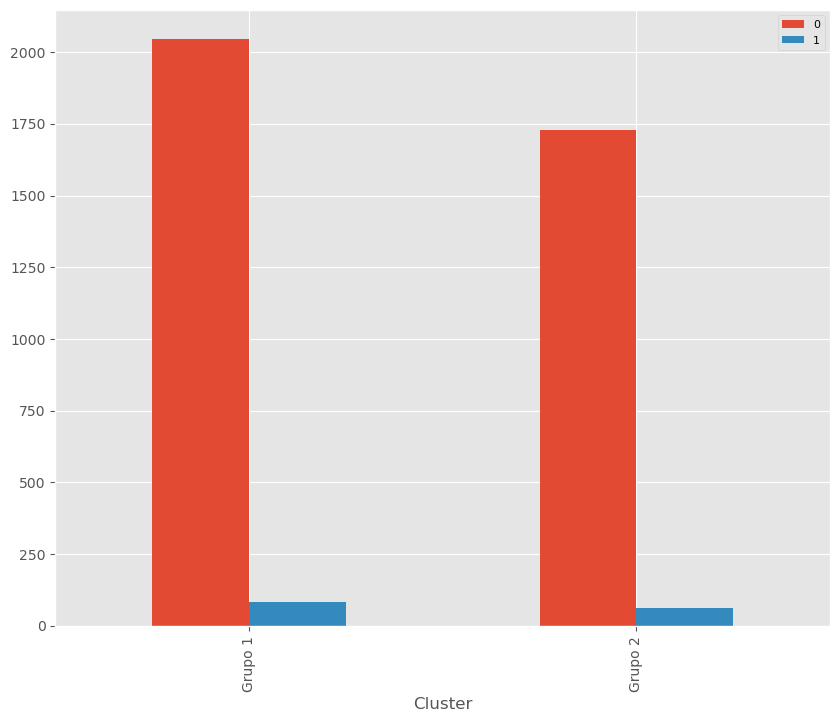

In [186]:
df_segm_pca_gmm.join(target).groupby(['Cluster','gravedad'])['Component 1'].count().unstack(level=1).plot(kind='bar', figsize=(10,8))
plt.legend(loc='best', fontsize=8)
plt.show()

### Comparativa clustering

Por último, se van a comparar los resultados de los 3 modelos entrenados

The palette list has more values (6) than needed (3), which may not be intended.
The palette list has more values (5) than needed (4), which may not be intended.
The palette list has more values (3) than needed (2), which may not be intended.


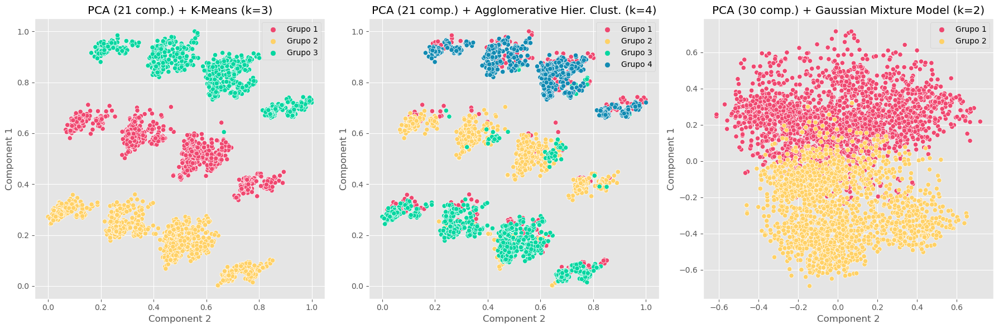

In [173]:
# Definimos la información de cada gráfico
graficos = [
    {
        'x': df_segm_pca_kmeans.sort_values('Cluster', ascending=True)['Component 2'],
        'y': df_segm_pca_kmeans.sort_values('Cluster', ascending=True)['Component 1'],
        'hue': df_segm_pca_kmeans.sort_values('Cluster', ascending=True)['Cluster'],
        'palette': ['#ef476f','#ffd166','#06d6a0','#118ab2','#073b4c','#6B4B3E'],
        'title': 'PCA (21 comp.) + K-Means (k=3)',
    },
    {
        'x': df_segm_pca_agglom.sort_values('Cluster', ascending=True)['Component 2'],
        'y': df_segm_pca_agglom.sort_values('Cluster', ascending=True)['Component 1'],
        'hue': df_segm_pca_agglom.sort_values('Cluster', ascending=True)['Cluster'],
        'palette': ['#ef476f','#ffd166','#06d6a0','#118ab2','#073b4c'],
        'title': 'PCA (21 comp.) + Agglomerative Hier. Clust. (k=4)',
    },
    {
        'x': df_segm_pca_gmm.sort_values('Cluster', ascending=True)['Component 2'],
        'y': df_segm_pca_gmm.sort_values('Cluster', ascending=True)['Component 1'],
        'hue': df_segm_pca_gmm.sort_values('Cluster', ascending=True)['Cluster'],
        'palette': ['#ef476f','#ffd166','#06d6a0'],
        'title': 'PCA (30 comp.) + Gaussian Mixture Model (k=2)',
    },
]

# Creamos el subplot con los gráficos
fig, axs = plt.subplots(1, len(graficos), figsize=(18, 6))

# Iteraramos sobre cada gráfico del subplot
for i, ax in enumerate(axs):
    grafico_actual = graficos[i]
    x_axis = grafico_actual['x']
    y_axis = grafico_actual['y']
    hue = grafico_actual['hue']
    palette = grafico_actual['palette']
    title = grafico_actual['title']

    # Gráfico scatterplot
    sns.scatterplot(x=x_axis, y=y_axis, hue=hue, palette=palette, ax=ax)
    ax.set_title(title)
    ax.legend(loc='upper right')

# Mostramos el subplot
plt.tight_layout()
plt.show()



## Selección de variables

### Chi Square Test

Es un método útil cuando existen muchas variables de entrada de tipo categóricas, y la salida también es categórica.

In [187]:
# Se divide entre variables y target
target = df_accidentes["gravedad"]
variables = df_accidentes.drop(["gravedad","lesividad"], axis=1, inplace=False)

In [188]:
# Se crea una función para la reducción de características mediante SelectKBest
def feature_reduction_kbest(variables, target, method=chi2, k=10, plot=True, variables_a_representar=(0,1)):

    """
    method = [chi2, f_classif (ANOVA), mutual_info_classif]. Más disponible en sklearn.feature_selection
    plot: True muestra un gráfico de las variables_a_representar de los primeros 200 registros
    """
    columnas_kbest = []

    methods = {chi2:'chi2', f_classif:'ANOVA', mutual_info_classif:'mutal info'}
    method_str = methods[method]

    fs = SelectKBest(method, k=k).fit(variables._get_numeric_data(), target)
    for (col, sel) in zip(variables._get_numeric_data().columns.values, fs.get_support()):
        if sel:
            columnas_kbest.append(col)
    seleccion = fs.transform(variables._get_numeric_data())

    if plot: 
        cm = plt.cm.RdBu
        cm_bright = ListedColormap(['#FF0000', '#0000FF'])
        plt.scatter(seleccion[1:200, variables_a_representar[0]], seleccion[1:200, variables_a_representar[1]], c=target[1:200], cmap=cm_bright)
        plt.xlabel(columnas_kbest[variables_a_representar[0]])
        plt.ylabel(columnas_kbest[variables_a_representar[1]])
        plt.title('Target en función de ' + columnas_kbest[variables_a_representar[0]] + ' y ' + columnas_kbest[variables_a_representar[1]] + ' (' + method_str +')')
        plt.show()

    return columnas_kbest

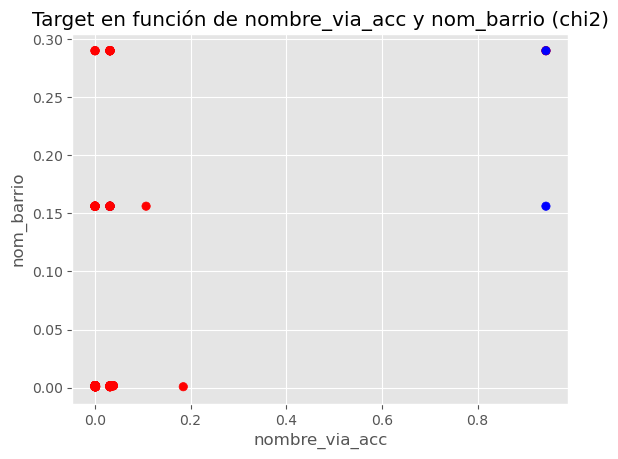

['nombre_via_acc',
 'numero_via_acc',
 'nom_barrio',
 'implicados_peatones',
 'implicados_pesados',
 'implicados_turismos',
 'utm_x_acc',
 'utm_y_acc',
 'ocupacion_via',
 'carga_via',
 'vmed',
 'atropello_a_animal',
 'choque_contra_obstaculo_fijo',
 'colision_fronto-lateral',
 'colisión_lateral',
 'lluvia_debil',
 'estado_meteo_desconocido',
 'sexo_desconocido',
 'anillo_verde_ciclista',
 'via_uso_compartido',
 'media_edad']

In [192]:
# Se aplica el método de Chi2 para 21 variables
feature_reduction_kbest(variables, target, method=chi2, k=21, variables_a_representar=(0,2))

### ANOVA F-value

Dado que también hay variables de entrada numéricas, se va a probar la selección de variables con el ANOVA F-value entre cada variable y la target.

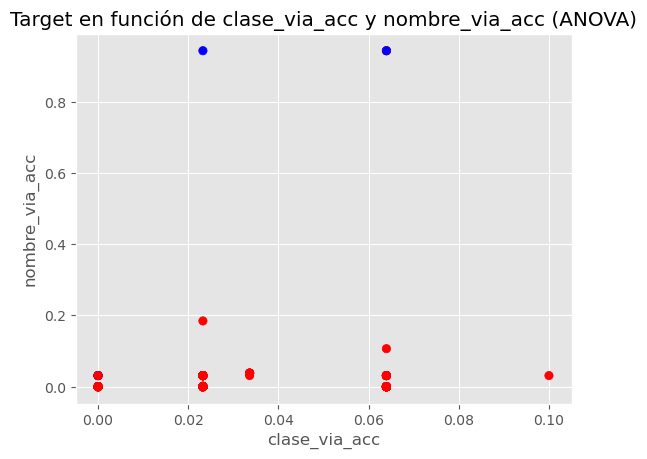

['clase_via_acc',
 'nombre_via_acc',
 'nom_distrito',
 'nom_barrio',
 'implicados_peatones',
 'implicados_pesados',
 'implicados_turismos',
 'utm_y_acc',
 'ocupacion_via',
 'atropello_a_animal',
 'choque_contra_obstaculo_fijo',
 'colision_fronto-lateral',
 'colisión_lateral',
 'cielo_despejado',
 'lluvia_debil',
 'estado_meteo_desconocido',
 'sexo_desconocido',
 'sexo_hombre',
 'anillo_verde_ciclista',
 'via_uso_compartido',
 'media_edad']

In [194]:
# Se aplica el método de f_classif para 21 variables
feature_reduction_kbest(variables, target, method=f_classif, k=21)

## Entrenamiento del modelo

Dado que no es evidente cuál es el mejor tipo de modelo para predecir la lesividad de los accidentes con implicación de bicicletas, se empezará con los modelos más sencillos y estables, es decir, los modelos lineales. En caso de que los resultados no sean satisfactorios, se optará por modelos de mayor complejidad.

Se partirá de las variables originales, seleccionadas o transformadas y estudiaremos medidas de calidad como la precisión y el "recall" para evaluar cada uno de los modelos. Este último es si cabe más relevante, ya que al tratarse de un problema desbalanceado, el recall permite poner el foco en los falsos negativos (a mayor recall, menor número de falsos negativos).

Lo primero que se hará será dividir el conjunto de datos de partida. Como los datos están ordenados por fecha, es recomendable mantener este orden a la hora de realizar la partición de los datos. Gracias a ello, se podrá entrenar el modelo con datos históricos, y evaluarlo con datos presente.

Por otra parte, dado que el conjunto de datos no es muy grande, se opta por una proporción de 70-30 entre train y test.

In [4]:
# SEED 
SEED = 9

# Primero se ordenan los datos
df_accidentes = df_accidentes.sort_values(by=['año_acc', 'mes_acc', 'dia_mes_acc', 'hora_acc'],ignore_index=True)

In [10]:
opción = 1
if opción == 1:
    # Se separan las variables de entrada y la target
    target = df_accidentes["gravedad"]
    variables = df_accidentes.drop(["gravedad","lesividad"], axis=1, inplace=False)

    # Proporción de división entre conjuntos de train y test
    train_ratio = 0.7  # 70% para train, 30% para test

    X_train, X_val, y_train, y_val = train_test_split(variables, target, train_size=train_ratio, shuffle=False, random_state=SEED)

else:
    # Alternativa a lo de arriba
    # O LO DE ARRIBA O LO DE ABAJO, LOS DOS, NO
    X = df_accidentes.drop(['gravedad','lesividad'], axis=1)
    y = df_accidentes['gravedad']

    sss = StratifiedKFold(n_splits=5, shuffle=False)

    for train_index, test_index in sss.split(X, y):
        X_train, X_val = X.iloc[train_index], X.iloc[test_index]
        y_train, y_val = y.iloc[train_index], y.iloc[test_index]

# Examinamos la forma de los conjuntos de datos
X_train.shape, X_val.shape, y_train.shape, y_val.shape

((2744, 56), (1176, 56), (2744,), (1176,))

In [11]:
sum(y_val==1)

48

In [216]:
# Métrica que prioriza el recall de target = 1
recall_scorer = make_scorer(recall_score, pos_label=1)
f1_scorer = make_scorer(f1_score, pos_label=1)

# Define los porcentajes de recall deseados
target_recall_1 = 0.75
target_recall_0 = 0.75

# Define una función de pérdida para usar como base para la métrica personalizada
def custom_recall_loss(y_true, y_pred):
    recall_1 = recall_score(y_true, y_pred, pos_label=1)
    recall_0 = recall_score(y_true, y_pred, pos_label=0)
    loss = ((recall_1 - target_recall_1) ** 2) + ((recall_0 - target_recall_0) ** 2)
    return loss

# Crea una métrica personalizada utilizando make_scorer
custom_recall_scorer = make_scorer(custom_recall_loss, greater_is_better=False)

# Crea la métrica de recall de positivos
def tpr_score(y_true, y_pred):
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()
    tpr = tp / (tp + fn)
    return tpr

tpr_scorer = make_scorer(tpr_score)

def mi_metrica(y_true, y_pred):
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()
    if tn /(tn + fp) > 0.7:
        calculo =  10 * tp / (tp + fn) + tn /(tn + fp)
    else:
        calculo = 2 * tp / (tp + fn) + tn /(tn + fp)
    return calculo

fjj_scorer = make_scorer(mi_metrica)


In [13]:
# Se define una función para evaluar la clasificación
def evaluacion_clasificacion(modelo, nombre_modelo, X_val, y_val, proba=True, plot=True, show_print=True):
        # Evaluamos con los datos de validación
        y_pred = modelo.predict(X_val)
        if proba:
                y_pred_proba = modelo.predict_proba(X_val)[:, 1]
        

        if plot:
                fig, ax = plt.subplots(1, 2, figsize=(12, 5))

                fig.suptitle('Resultados ' + nombre_modelo, fontsize=14)

                # Confusion Matrix
                cm = confusion_matrix(y_val, y_pred)
                disp = ConfusionMatrixDisplay(confusion_matrix=cm)
                disp.plot(ax=ax[0], cmap='BuPu')
                ax[0].grid(False)
                ax[0].set_xlabel('Predicción')
                ax[0].set_ylabel('Original')
                ax[0].set_title('Matriz confusión', fontsize=12)

                if proba:

                        # ROC AUC 
                        fpr, tpr, thresholds = roc_curve(y_val, y_pred_proba)
                        roc_auc = auc(fpr, tpr)

                        ax[1].plot(fpr, tpr, color='darkorange', lw=2, 
                                label='ROC curve (area = %0.2f)' % roc_auc)
                        ax[1].plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
                        ax[1].set_xlim([0.0, 1.0])
                        ax[1].set_ylim([0.0, 1.05])
                        ax[1].set_xlabel('False Positive Rate')
                        ax[1].set_ylabel('True Positive Rate') 
                        ax[1].set_title('Receiver Operating Characteristic (ROC)', fontsize=12)
                        ax[1].legend(loc="lower right")

                plt.tight_layout()
                plt.show()

        if show_print:
                # Mostramos el classification report
                cr = pd.DataFrame(classification_report(y_val, modelo.predict(X_val), output_dict=True, zero_division=0))
                print(cr)

                print(f"-"*100)

                print(f"Recall total: {recall_score(y_val, y_pred, average='weighted'):.4f} || Clase 1: {recall_score(y_val, y_pred, pos_label=1):.4f} || Clase 0: {recall_score(y_val, y_pred, pos_label=0):.4f}")
                print(f"Precisión total: {precision_score(y_val, y_pred, average='weighted'):.4f} || Clase 1: {precision_score(y_val, y_pred, pos_label=1):.4f} || Clase 0: {precision_score(y_val, y_pred, pos_label=0):.4f}")
                print(f"F1 total: {f1_score(y_val, y_pred, average='weighted'):.4f} || Clase 1: {f1_score(y_val, y_pred, pos_label=1):.4f} || Clase 0: {f1_score(y_val, y_pred, pos_label=0):.4f}")
                print(f"ROC AUC: {roc_auc_score(y_val, y_pred):.4f}")

        return cr

### 1. Regresión logística

El primer modelo que se probará será la regresión logística

In [221]:
resultados_rl_list = []

#### Con oversampling y PCA

El mejor meta-parámetro encontrado: {'lr__C': 5, 'ovs__sampling_strategy': 1, 'pca__n_components': 56}
El mejor score es: 0.5631578947368421


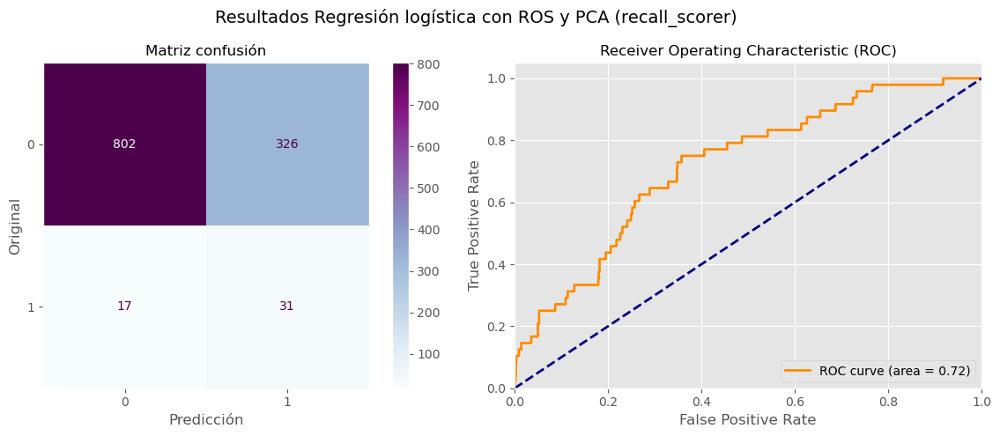

                     0          1  accuracy    macro avg  weighted avg
precision     0.979243   0.086835  0.708333     0.533039      0.942818
recall        0.710993   0.645833  0.708333     0.678413      0.708333
f1-score      0.823832   0.153086  0.708333     0.488459      0.796454
support    1128.000000  48.000000  0.708333  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.7083 || Clase 1: 0.6458 || Clase 0: 0.7110
Precisión total: 0.9428 || Clase 1: 0.0868 || Clase 0: 0.9792
F1 total: 0.7965 || Clase 1: 0.1531 || Clase 0: 0.8238
ROC AUC: 0.6784
El mejor meta-parámetro encontrado: {'lr__C': 0.01, 'ovs__sampling_strategy': 0.5, 'pca__n_components': 40}
El mejor score es: 0.12292867137387689


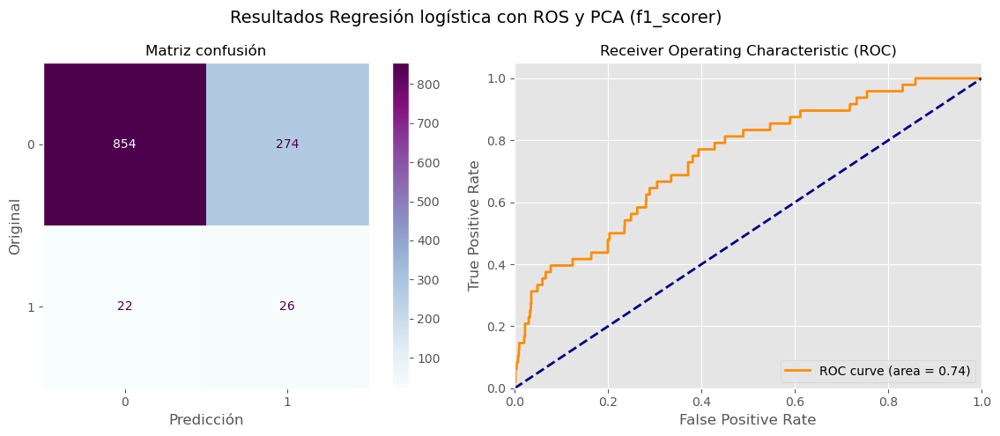

                     0          1  accuracy    macro avg  weighted avg
precision     0.974886   0.086667  0.748299     0.530776      0.938632
recall        0.757092   0.541667  0.748299     0.649379      0.748299
f1-score      0.852295   0.149425  0.748299     0.500860      0.823607
support    1128.000000  48.000000  0.748299  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.7483 || Clase 1: 0.5417 || Clase 0: 0.7571
Precisión total: 0.9386 || Clase 1: 0.0867 || Clase 0: 0.9749
F1 total: 0.8236 || Clase 1: 0.1494 || Clase 0: 0.8523
ROC AUC: 0.6494
El mejor meta-parámetro encontrado: {'lr__C': 0.1, 'ovs__sampling_strategy': 0.8, 'pca__n_components': 30}
El mejor score es: -0.07483618459707979


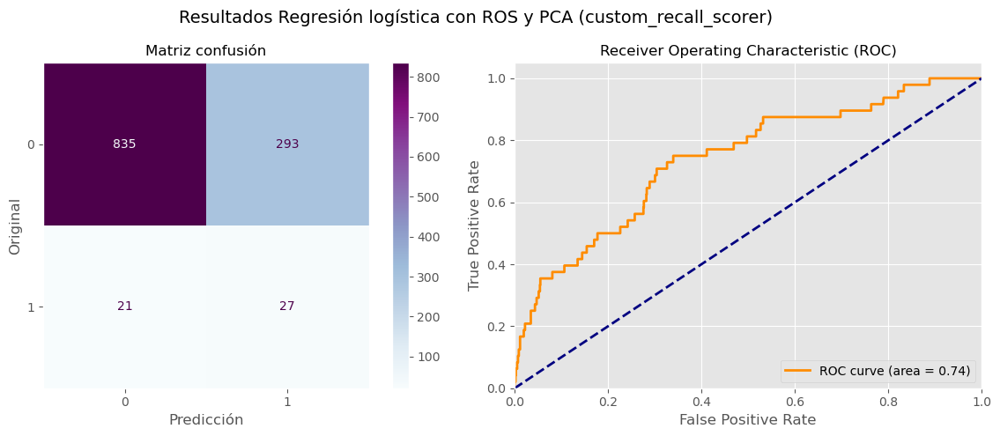

                     0          1  accuracy    macro avg  weighted avg
precision     0.975467   0.084375  0.732993     0.529921      0.939096
recall        0.740248   0.562500  0.732993     0.651374      0.732993
f1-score      0.841734   0.146739  0.732993     0.494237      0.813367
support    1128.000000  48.000000  0.732993  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.7330 || Clase 1: 0.5625 || Clase 0: 0.7402
Precisión total: 0.9391 || Clase 1: 0.0844 || Clase 0: 0.9755
F1 total: 0.8134 || Clase 1: 0.1467 || Clase 0: 0.8417
ROC AUC: 0.6514
El mejor meta-parámetro encontrado: {'lr__C': 0.01, 'ovs__sampling_strategy': 0.8, 'pca__n_components': 56}
El mejor score es: 5.189806289808768


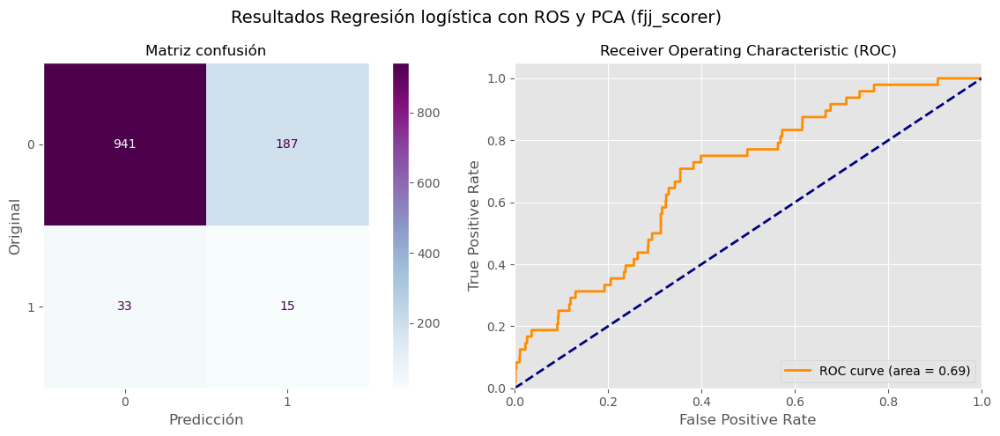

                     0          1  accuracy    macro avg  weighted avg
precision     0.966119   0.074257  0.812925     0.520188      0.929717
recall        0.834220   0.312500  0.812925     0.573360      0.812925
f1-score      0.895338   0.120000  0.812925     0.507669      0.863691
support    1128.000000  48.000000  0.812925  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.8129 || Clase 1: 0.3125 || Clase 0: 0.8342
Precisión total: 0.9297 || Clase 1: 0.0743 || Clase 0: 0.9661
F1 total: 0.8637 || Clase 1: 0.1200 || Clase 0: 0.8953
ROC AUC: 0.5734


In [222]:
metricas = [recall_scorer, f1_scorer, custom_recall_scorer, fjj_scorer]
nombres_metricas = ['recall_scorer', 'f1_scorer', 'custom_recall_scorer', 'fjj_scorer']
titulo = 'Regresión logística con ROS y PCA'

for metrica, nombre_metrica in zip(metricas, nombres_metricas):

    logr_ovs = imbalanced_pipeline([('std', StandardScaler()),
                                    ('ovs', RandomOverSampler(random_state=SEED)),
                                    ('pca', PCA(random_state=SEED)),
                                    ('std2', StandardScaler()),
                                    ('lr', LogisticRegression(C=1, penalty='l2', random_state=SEED, solver='newton-cg', class_weight='balanced', max_iter=5000))])

    # Se definen los meta-parámetros que se quieren optimizar con GridSearchCV.
    parameters = {
        'ovs__sampling_strategy': [0.1, 0.2, 0.5, 0.8, 1],
        'pca__n_components': [5, 10, 15, 20, 30, 40, 56],
        'lr__C': [0.001, 0.01, 0.1, 1, 2, 5]
    }

    # Se aplica GridSearchCV para encontrar los mejores meta-parámetros
    grid_search_logr_ovs = GridSearchCV(logr_ovs, parameters, cv=5, n_jobs=-1, scoring=metrica) # recall_scorer, f1_scorer, custom_recall_scorer
    grid_search_logr_ovs.fit(X_train, y_train)

    # Se muestran por pantalla los mejores meta-parámetros encontrados
    print(f"El mejor meta-parámetro encontrado: {grid_search_logr_ovs.best_params_}")
    print(f"El mejor score es: {grid_search_logr_ovs.best_score_}")

    resultado = pd.DataFrame(evaluacion_clasificacion(grid_search_logr_ovs,  titulo + ' (' + nombre_metrica + ')', X_val, y_val, plot=True, show_print=True))
    resultado['modelo'] = titulo + ' (' + nombre_metrica + ')'
    resultados_rl_list.append(resultado)

#### Con Oversampling

El mejor meta-parámetro encontrado: {'lr__C': 1, 'ovs__sampling_strategy': 0.2}
El mejor score es: 0.4726315789473684


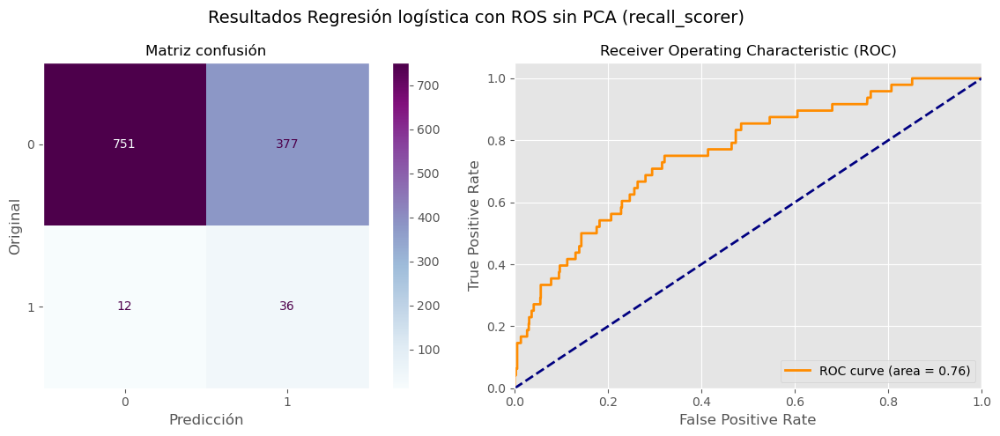

                     0          1  accuracy    macro avg  weighted avg
precision     0.984273   0.087167  0.669218     0.535720      0.947656
recall        0.665780   0.750000  0.669218     0.707890      0.669218
f1-score      0.794289   0.156182  0.669218     0.475235      0.768244
support    1128.000000  48.000000  0.669218  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.6692 || Clase 1: 0.7500 || Clase 0: 0.6658
Precisión total: 0.9477 || Clase 1: 0.0872 || Clase 0: 0.9843
F1 total: 0.7682 || Clase 1: 0.1562 || Clase 0: 0.7943
ROC AUC: 0.7079
El mejor meta-parámetro encontrado: {'lr__C': 0.001, 'ovs__sampling_strategy': 0.2}
El mejor score es: 0.11973845897841237


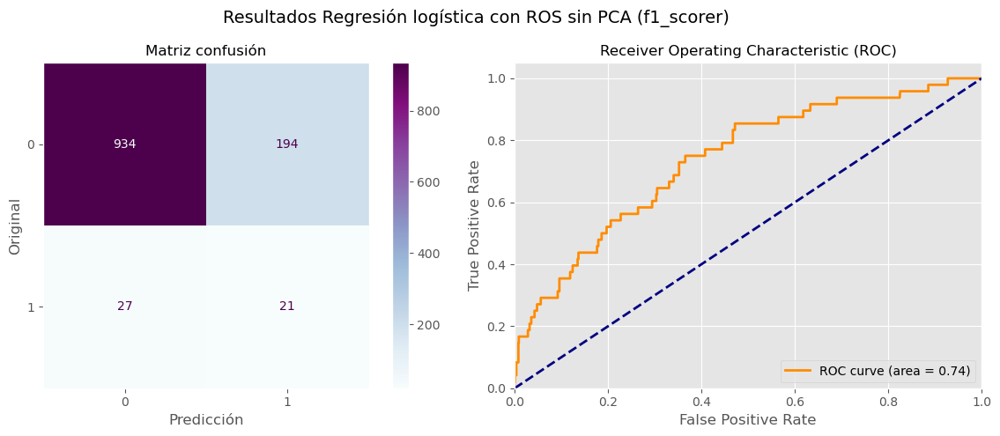

                     0          1  accuracy    macro avg  weighted avg
precision     0.971904   0.097674  0.812075     0.534789      0.936221
recall        0.828014   0.437500  0.812075     0.632757      0.812075
f1-score      0.894208   0.159696  0.812075     0.526952      0.864228
support    1128.000000  48.000000  0.812075  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.8121 || Clase 1: 0.4375 || Clase 0: 0.8280
Precisión total: 0.9362 || Clase 1: 0.0977 || Clase 0: 0.9719
F1 total: 0.8642 || Clase 1: 0.1597 || Clase 0: 0.8942
ROC AUC: 0.6328
El mejor meta-parámetro encontrado: {'lr__C': 5, 'ovs__sampling_strategy': 0.2}
El mejor score es: -0.08214355293874402


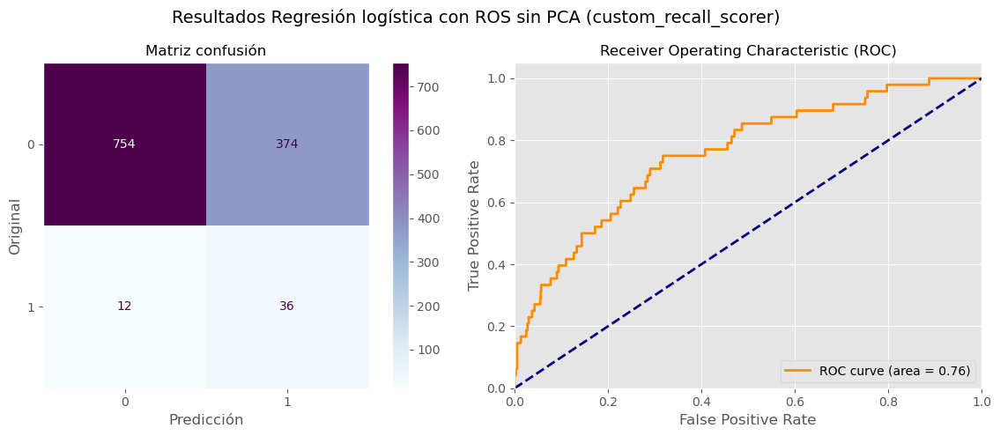

                     0          1  accuracy    macro avg  weighted avg
precision     0.984334   0.087805  0.671769     0.536070      0.947741
recall        0.668440   0.750000  0.671769     0.709220      0.671769
f1-score      0.796199   0.157205  0.671769     0.476702      0.770117
support    1128.000000  48.000000  0.671769  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.6718 || Clase 1: 0.7500 || Clase 0: 0.6684
Precisión total: 0.9477 || Clase 1: 0.0878 || Clase 0: 0.9843
F1 total: 0.7701 || Clase 1: 0.1572 || Clase 0: 0.7962
ROC AUC: 0.7092


In [225]:
metricas = [recall_scorer, f1_scorer, custom_recall_scorer]
nombres_metricas = ['recall_scorer', 'f1_scorer', 'custom_recall_scorer']
titulo = 'Regresión logística con ROS sin PCA'

for metrica, nombre_metrica in zip(metricas, nombres_metricas):

    logr_ovs = imbalanced_pipeline([('std', StandardScaler()),
                                    ('ovs', RandomOverSampler(random_state=SEED)),
                                    ('lr', LogisticRegression(C=1, penalty='l2', random_state=SEED, solver='newton-cg', class_weight='balanced', max_iter=5000))])

    # Se definen los meta-parámetros que se quieren optimizar con GridSearchCV.
    parameters = {
        'ovs__sampling_strategy': [0.1, 0.2, 0.5, 0.8, 1],
        'lr__C': [0.001, 0.01, 0.1, 1, 2, 5]
    }

    # Se aplica GridSearchCV para encontrar los mejores meta-parámetros
    grid_search_logr_ovs = GridSearchCV(logr_ovs, parameters, cv=5, n_jobs=-1, scoring=metrica) # recall_scorer, f1_scorer, custom_recall_scorer
    grid_search_logr_ovs.fit(X_train, y_train)

    # Se muestran por pantalla los mejores meta-parámetros encontrados
    print(f"El mejor meta-parámetro encontrado: {grid_search_logr_ovs.best_params_}")
    print(f"El mejor score es: {grid_search_logr_ovs.best_score_}")

    resultado = pd.DataFrame(evaluacion_clasificacion(grid_search_logr_ovs,  titulo + ' (' + nombre_metrica + ')', X_val, y_val, plot=True, show_print=True))
    resultado['modelo'] = titulo + ' (' + nombre_metrica + ')'
    resultados_rl_list.append(resultado)

#### Con PCA

El mejor meta-parámetro encontrado: {'lr__C': 0.01, 'pca__n_components': 5}
El mejor score es: 0.5968421052631578


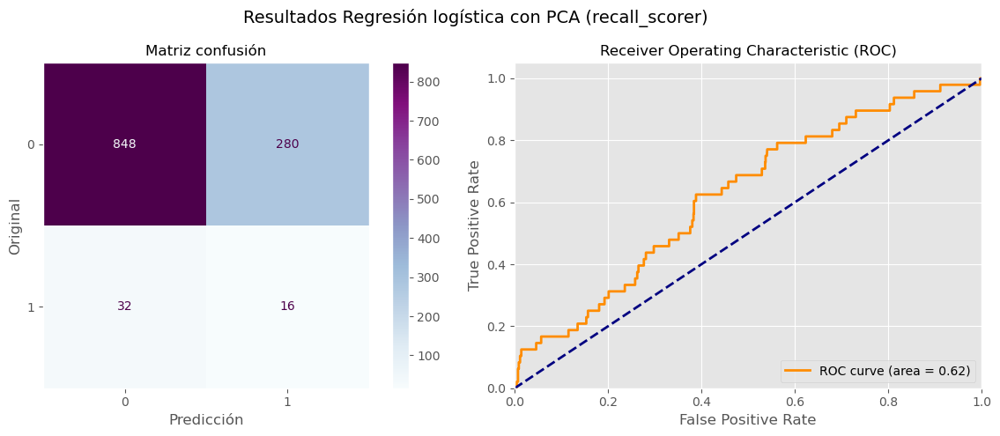

                     0          1  accuracy    macro avg  weighted avg
precision     0.963636   0.054054  0.734694     0.508845      0.926511
recall        0.751773   0.333333  0.734694     0.542553      0.734694
f1-score      0.844622   0.093023  0.734694     0.468822      0.813944
support    1128.000000  48.000000  0.734694  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.7347 || Clase 1: 0.3333 || Clase 0: 0.7518
Precisión total: 0.9265 || Clase 1: 0.0541 || Clase 0: 0.9636
F1 total: 0.8139 || Clase 1: 0.0930 || Clase 0: 0.8446
ROC AUC: 0.5426
El mejor meta-parámetro encontrado: {'lr__C': 0.001, 'pca__n_components': 10}
El mejor score es: 0.11060608354175896


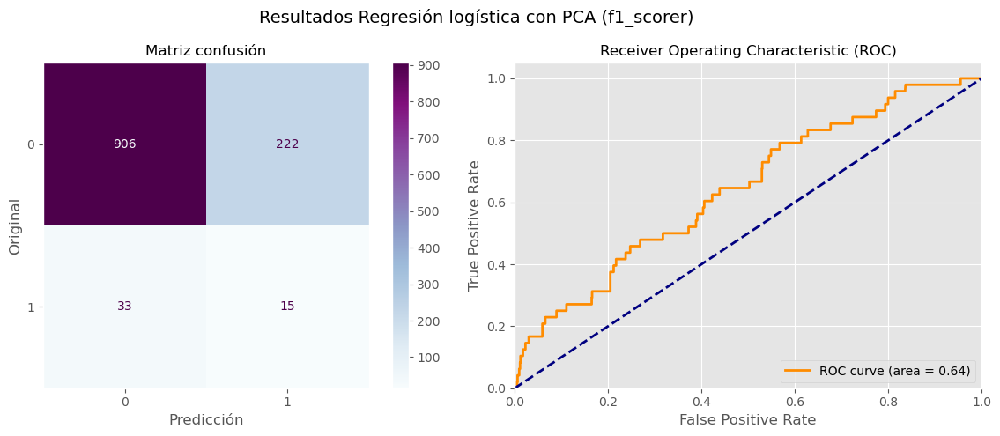

                     0          1  accuracy    macro avg  weighted avg
precision     0.964856   0.063291  0.783163     0.514074      0.928058
recall        0.803191   0.312500  0.783163     0.557846      0.783163
f1-score      0.876633   0.105263  0.783163     0.490948      0.845148
support    1128.000000  48.000000  0.783163  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.7832 || Clase 1: 0.3125 || Clase 0: 0.8032
Precisión total: 0.9281 || Clase 1: 0.0633 || Clase 0: 0.9649
F1 total: 0.8451 || Clase 1: 0.1053 || Clase 0: 0.8766
ROC AUC: 0.5578
El mejor meta-parámetro encontrado: {'lr__C': 0.01, 'pca__n_components': 15}
El mejor score es: -0.0702580926189654


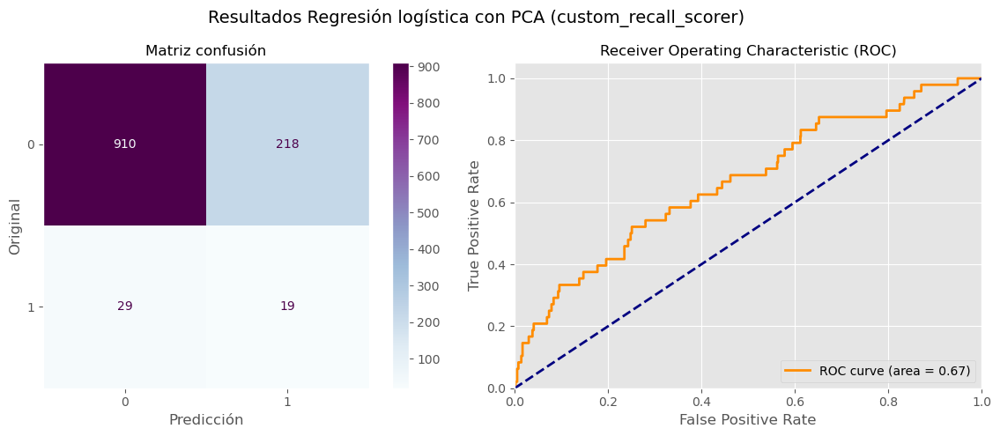

                     0          1  accuracy    macro avg  weighted avg
precision     0.969116   0.080169  0.789966     0.524642      0.932833
recall        0.806738   0.395833  0.789966     0.601285      0.789966
f1-score      0.880503   0.133333  0.789966     0.506918      0.850006
support    1128.000000  48.000000  0.789966  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.7900 || Clase 1: 0.3958 || Clase 0: 0.8067
Precisión total: 0.9328 || Clase 1: 0.0802 || Clase 0: 0.9691
F1 total: 0.8500 || Clase 1: 0.1333 || Clase 0: 0.8805
ROC AUC: 0.6013


In [226]:
metricas = [recall_scorer, f1_scorer, custom_recall_scorer]
nombres_metricas = ['recall_scorer', 'f1_scorer', 'custom_recall_scorer']
titulo = 'Regresión logística con PCA'

for metrica, nombre_metrica in zip(metricas, nombres_metricas):

    logr_ovs = imbalanced_pipeline([('std', StandardScaler()),
                                    ('pca', PCA(random_state=SEED)),
                                    ('std2', StandardScaler()),
                                    ('lr', LogisticRegression(C=1, penalty='l2', random_state=SEED, solver='newton-cg', class_weight='balanced', max_iter=5000))])

    # Se definen los meta-parámetros que se quieren optimizar con GridSearchCV.
    parameters = {
        'pca__n_components': [5, 10, 15, 20, 30, 40, 56],
        'lr__C': [0.001, 0.01, 0.1, 1, 2, 5]
    }

    # Se aplica GridSearchCV para encontrar los mejores meta-parámetros
    grid_search_logr_ovs = GridSearchCV(logr_ovs, parameters, cv=5, n_jobs=-1, scoring=metrica) # recall_scorer, f1_scorer, custom_recall_scorer
    grid_search_logr_ovs.fit(X_train, y_train)

    # Se muestran por pantalla los mejores meta-parámetros encontrados
    print(f"El mejor meta-parámetro encontrado: {grid_search_logr_ovs.best_params_}")
    print(f"El mejor score es: {grid_search_logr_ovs.best_score_}")

    resultado = pd.DataFrame(evaluacion_clasificacion(grid_search_logr_ovs,  titulo + ' (' + nombre_metrica + ')', X_val, y_val, plot=True, show_print=True))
    resultado['modelo'] = titulo + ' (' + nombre_metrica + ')'
    resultados_rl_list.append(resultado)

#### Básica

El mejor meta-parámetro encontrado: {'lr__C': 0.01}
El mejor score es: 0.4515789473684211


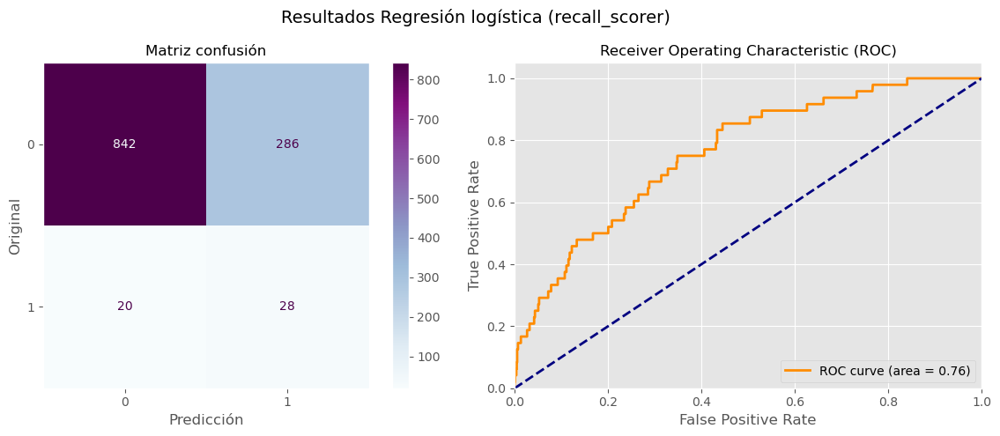

                     0          1  accuracy    macro avg  weighted avg
precision     0.976798   0.089172  0.739796     0.532985      0.940569
recall        0.746454   0.583333  0.739796     0.664894      0.739796
f1-score      0.846231   0.154696  0.739796     0.500464      0.818005
support    1128.000000  48.000000  0.739796  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.7398 || Clase 1: 0.5833 || Clase 0: 0.7465
Precisión total: 0.9406 || Clase 1: 0.0892 || Clase 0: 0.9768
F1 total: 0.8180 || Clase 1: 0.1547 || Clase 0: 0.8462
ROC AUC: 0.6649
El mejor meta-parámetro encontrado: {'lr__C': 0.001}
El mejor score es: 0.12050782453857478


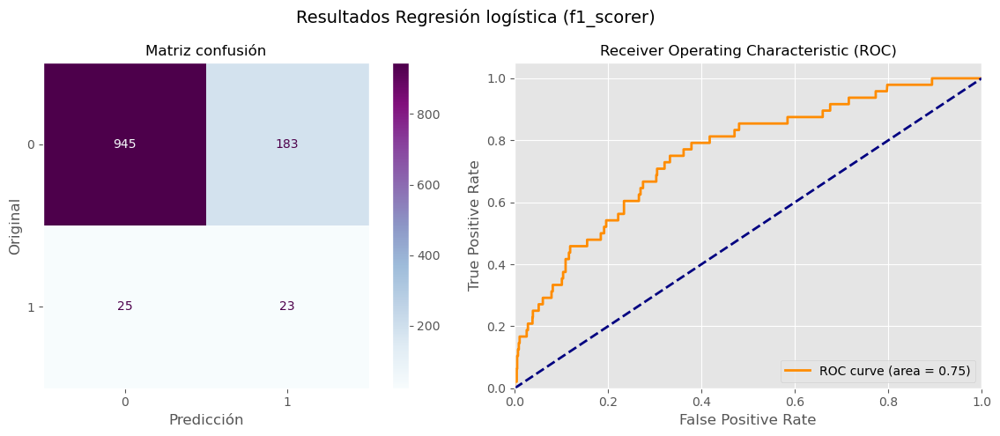

                     0          1  accuracy    macro avg  weighted avg
precision     0.974227   0.111650  0.823129     0.542939      0.939020
recall        0.837766   0.479167  0.823129     0.658466      0.823129
f1-score      0.900858   0.181102  0.823129     0.540980      0.871480
support    1128.000000  48.000000  0.823129  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.8231 || Clase 1: 0.4792 || Clase 0: 0.8378
Precisión total: 0.9390 || Clase 1: 0.1117 || Clase 0: 0.9742
F1 total: 0.8715 || Clase 1: 0.1811 || Clase 0: 0.9009
ROC AUC: 0.6585
El mejor meta-parámetro encontrado: {'lr__C': 0.01}
El mejor score es: -0.10287742821985432


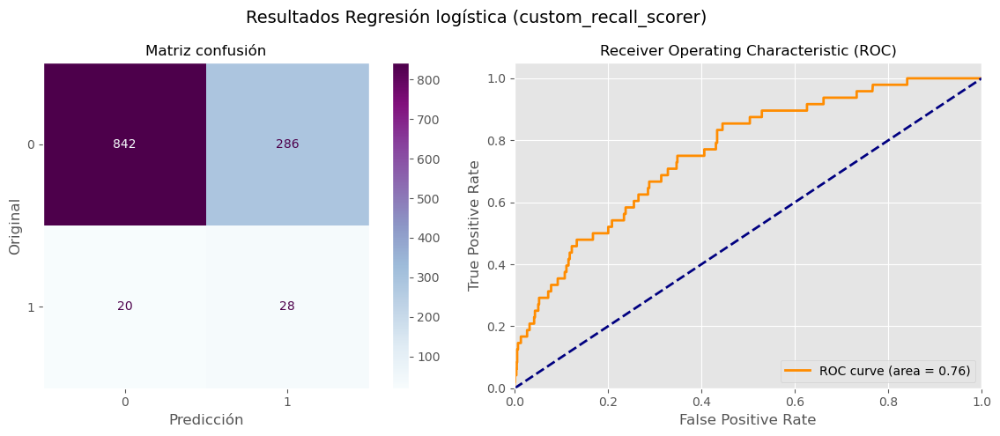

                     0          1  accuracy    macro avg  weighted avg
precision     0.976798   0.089172  0.739796     0.532985      0.940569
recall        0.746454   0.583333  0.739796     0.664894      0.739796
f1-score      0.846231   0.154696  0.739796     0.500464      0.818005
support    1128.000000  48.000000  0.739796  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.7398 || Clase 1: 0.5833 || Clase 0: 0.7465
Precisión total: 0.9406 || Clase 1: 0.0892 || Clase 0: 0.9768
F1 total: 0.8180 || Clase 1: 0.1547 || Clase 0: 0.8462
ROC AUC: 0.6649


In [227]:
metricas = [recall_scorer, f1_scorer, custom_recall_scorer]
nombres_metricas = ['recall_scorer', 'f1_scorer', 'custom_recall_scorer']
titulo = 'Regresión logística'

for metrica, nombre_metrica in zip(metricas, nombres_metricas):

    logr_ovs = imbalanced_pipeline([('std', StandardScaler()),
                                    ('lr', LogisticRegression(C=1, penalty='l2', random_state=SEED, solver='newton-cg', class_weight='balanced', max_iter=5000))])

    # Se definen los meta-parámetros que se quieren optimizar con GridSearchCV.
    parameters = {
        'lr__C': [0.001, 0.01, 0.1, 1, 2, 5]
    }

    # Se aplica GridSearchCV para encontrar los mejores meta-parámetros
    grid_search_logr_ovs = GridSearchCV(logr_ovs, parameters, cv=5, n_jobs=-1, scoring=metrica) # recall_scorer, f1_scorer, custom_recall_scorer
    grid_search_logr_ovs.fit(X_train, y_train)

    # Se muestran por pantalla los mejores meta-parámetros encontrados
    print(f"El mejor meta-parámetro encontrado: {grid_search_logr_ovs.best_params_}")
    print(f"El mejor score es: {grid_search_logr_ovs.best_score_}")

    resultado = pd.DataFrame(evaluacion_clasificacion(grid_search_logr_ovs,  titulo + ' (' + nombre_metrica + ')', X_val, y_val, plot=True, show_print=True))
    resultado['modelo'] = titulo + ' (' + nombre_metrica + ')'
    resultados_rl_list.append(resultado)

#### Sin GridSearchCV

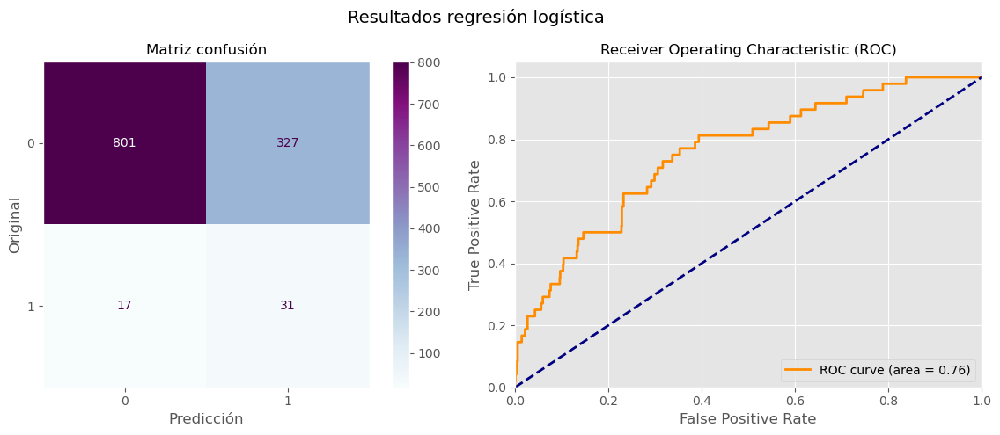

                     0          1  accuracy    macro avg  weighted avg
precision     0.979218   0.086592  0.707483     0.532905      0.942784
recall        0.710106   0.645833  0.707483     0.677970      0.707483
f1-score      0.823227   0.152709  0.707483     0.487968      0.795859
support    1128.000000  48.000000  0.707483  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.7075 || Clase 1: 0.6458 || Clase 0: 0.7101
Precisión total: 0.9428 || Clase 1: 0.0866 || Clase 0: 0.9792
F1 total: 0.7959 || Clase 1: 0.1527 || Clase 0: 0.8232
ROC AUC: 0.6780


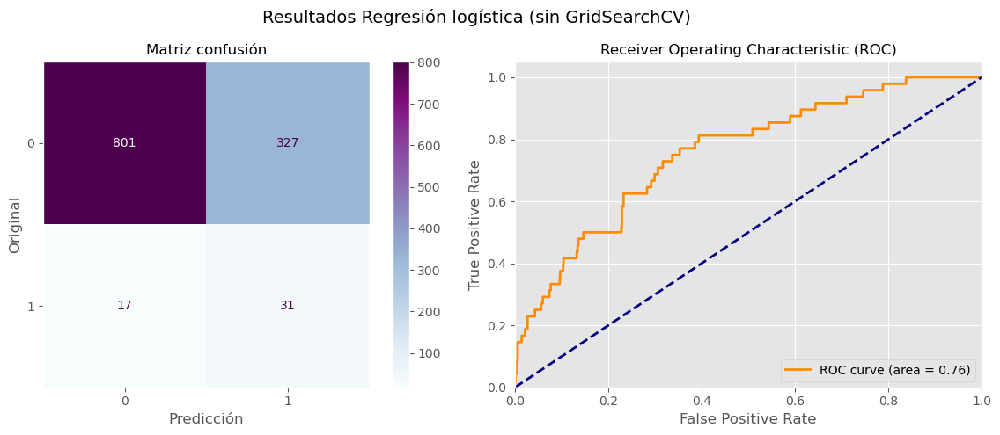

                     0          1  accuracy    macro avg  weighted avg
precision     0.979218   0.086592  0.707483     0.532905      0.942784
recall        0.710106   0.645833  0.707483     0.677970      0.707483
f1-score      0.823227   0.152709  0.707483     0.487968      0.795859
support    1128.000000  48.000000  0.707483  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.7075 || Clase 1: 0.6458 || Clase 0: 0.7101
Precisión total: 0.9428 || Clase 1: 0.0866 || Clase 0: 0.9792
F1 total: 0.7959 || Clase 1: 0.1527 || Clase 0: 0.8232
ROC AUC: 0.6780


In [228]:
logr = Pipeline([('std', StandardScaler()), ('lr', LogisticRegression(C=1, penalty='l2', random_state=SEED, solver='newton-cg', class_weight='balanced', max_iter=10000))])
logr.fit(X_train, y_train)
evaluacion_clasificacion(logr, 'regresión logística', X_val, y_val, plot=True, show_print=True)
resultado = pd.DataFrame(evaluacion_clasificacion(logr,  titulo + ' (sin GridSearchCV)', X_val, y_val, plot=True, show_print=True))
resultado['modelo'] =titulo + ' (sin GridSearchCV)'
resultados_rl_list.append(resultado)

In [39]:
#print("Model coefficients:\n")
#for i in range(X_train.shape[1]):
#    print(X_train.columns[i], "=", logr.named_steps['lr'].coef_[0][i].round(5))

pd.DataFrame({'Columna': X_train.columns, 'Coeficiente': logr.named_steps['lr'].coef_[0]}).sort_values(by='Coeficiente', ascending=False)

,Columna,Coeficiente
5,implicados,0.831965
1,nombre_via_acc,0.761870
55,media_edad,0.408718
37,cielo_despejado,0.376912
47,sexo_hombre,0.298711
41,cielo_nublado,0.252067
25,hora_acc,0.185060
49,anillo_verde_ciclista,0.165307
18,carga_via,0.151123
14,utm_y_acc,0.137500


Se observa que los resultados no son buenos con todas las variables. Se va a probar reduciendo el número de variables pasadas al modelo

In [256]:
pd.concat(resultados_rl_list).to_csv('./Datasets/resultados_lr.csv', sep=';', encoding='latin-1', index=True)

### 2. Árbol de decisión

Se observa que los modelos lineales tienden a clasificar los patrones de la clase minoritaria como pertenecientes a la clase mayoritaria, por lo que vamos a probar con modelos también sencillos pero no lineales, como árboles de decisión, con la esperanza de obtener mejores resultados:

In [172]:
# Se separan las variables de entrada y la target
target = df_accidentes["gravedad"]
variables = df_accidentes.drop(["gravedad","lesividad"], axis=1, inplace=False)

# Proporción de división entre conjuntos de train y test
train_ratio = 0.7  # 70% para train, 30% para test

X_train, X_val, y_train, y_val = train_test_split(variables, target, train_size=train_ratio, shuffle=False, random_state=SEED)

# Examinamos la forma de los conjuntos de datos
X_train.shape, X_val.shape, y_train.shape, y_val.shape

((2744, 59), (1176, 59), (2744,), (1176,))

#### Con oversampling y PCA

El mejor meta-parámetro encontrado: {'ovs__sampling_strategy': 0.2, 'pca__n_components': 30, 't__ccp_alpha': 0.02}
El mejor score es: 0.6789473684210526


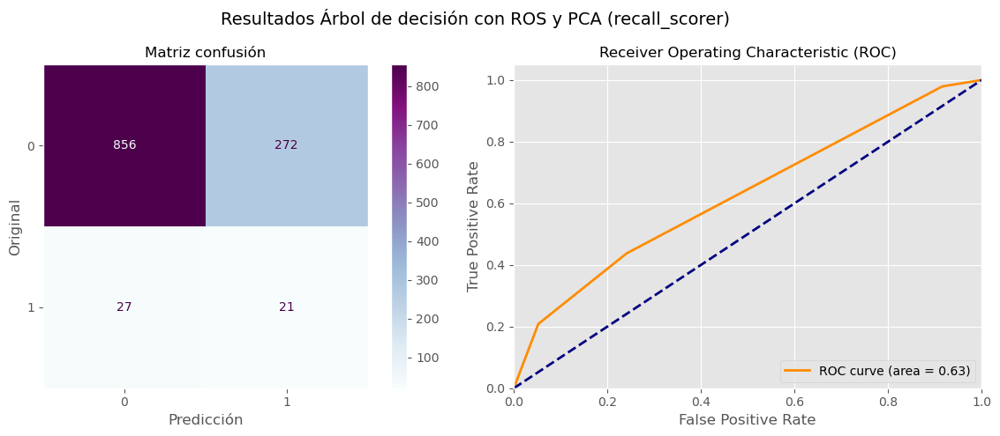

                     0          1  accuracy    macro avg  weighted avg
precision     0.969422   0.071672  0.745748     0.520547      0.932780
recall        0.758865   0.437500  0.745748     0.598183      0.745748
f1-score      0.851318   0.123167  0.745748     0.487242      0.821597
support    1128.000000  48.000000  0.745748  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.7457 || Clase 1: 0.4375 || Clase 0: 0.7589
Precisión total: 0.9328 || Clase 1: 0.0717 || Clase 0: 0.9694
F1 total: 0.8216 || Clase 1: 0.1232 || Clase 0: 0.8513
ROC AUC: 0.5982
El mejor meta-parámetro encontrado: {'ovs__sampling_strategy': 0.8, 'pca__n_components': 5, 't__ccp_alpha': 0.02}
El mejor score es: 0.1329452997333792


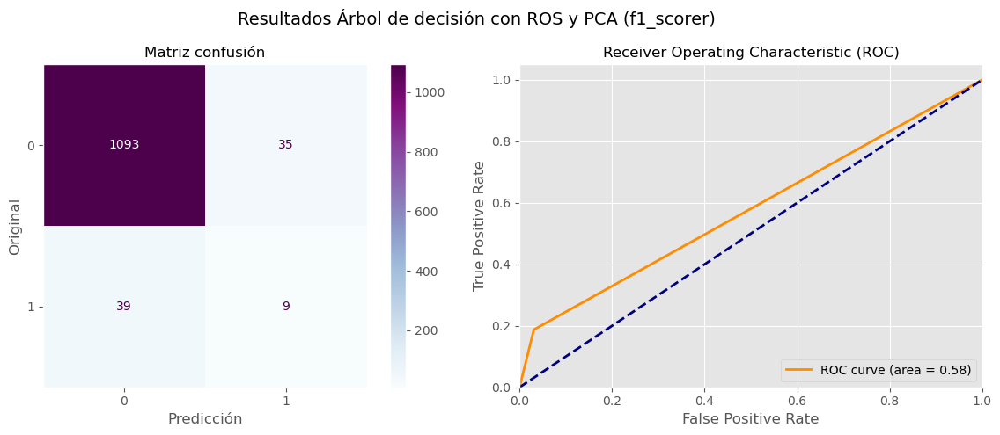

                     0          1  accuracy    macro avg  weighted avg
precision     0.965548   0.204545  0.937075     0.585047      0.934486
recall        0.968972   0.187500  0.937075     0.578236      0.937075
f1-score      0.967257   0.195652  0.937075     0.581454      0.935763
support    1128.000000  48.000000  0.937075  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.9371 || Clase 1: 0.1875 || Clase 0: 0.9690
Precisión total: 0.9345 || Clase 1: 0.2045 || Clase 0: 0.9655
F1 total: 0.9358 || Clase 1: 0.1957 || Clase 0: 0.9673
ROC AUC: 0.5782
El mejor meta-parámetro encontrado: {'ovs__sampling_strategy': 1, 'pca__n_components': 10, 't__ccp_alpha': 0.012}
El mejor score es: -0.06793365709534069


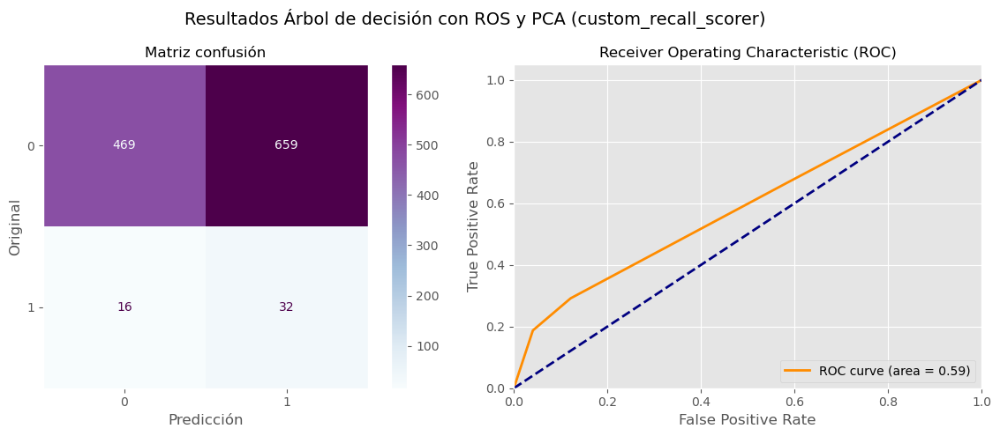

                     0          1  accuracy    macro avg  weighted avg
precision     0.967010   0.046310   0.42602     0.506660      0.929431
recall        0.415780   0.666667   0.42602     0.541223      0.426020
f1-score      0.581525   0.086604   0.42602     0.334064      0.561324
support    1128.000000  48.000000   0.42602  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.4260 || Clase 1: 0.6667 || Clase 0: 0.4158
Precisión total: 0.9294 || Clase 1: 0.0463 || Clase 0: 0.9670
F1 total: 0.5613 || Clase 1: 0.0866 || Clase 0: 0.5815
ROC AUC: 0.5412


In [230]:
metricas = [recall_scorer, f1_scorer, custom_recall_scorer]
nombres_metricas = ['recall_scorer', 'f1_scorer', 'custom_recall_scorer']
titulo = 'Árbol de decisión con ROS y PCA'

for metrica, nombre_metrica in zip(metricas, nombres_metricas):

    t_ovs = imbalanced_pipeline([('std', StandardScaler()),
                                    ('ovs', RandomOverSampler(random_state=SEED)),
                                    ('pca', PCA(random_state=SEED)),
                                    ('std2', StandardScaler()),
                                    ('t', DecisionTreeClassifier(random_state=SEED, class_weight='balanced'))])

    # Se definen los meta-parámetros que se quieren optimizar con GridSearchCV.
    parameters = {
        'ovs__sampling_strategy': [0.1, 0.2, 0.5, 0.8, 1],
        'pca__n_components': [5, 10, 15, 20, 30, 40, 56],
        't__ccp_alpha': [0.01, 0.001, 0.015, 0.012, 0.009, 0.02]
    }

    # Se aplica GridSearchCV para encontrar los mejores meta-parámetros
    grid_search_t_ovs = GridSearchCV(t_ovs, parameters, cv=5, n_jobs=-1, scoring=metrica) # recall_scorer, f1_scorer, custom_recall_scorer
    grid_search_t_ovs.fit(X_train, y_train)

    # Se muestran por pantalla los mejores meta-parámetros encontrados
    print(f"El mejor meta-parámetro encontrado: {grid_search_t_ovs.best_params_}")
    print(f"El mejor score es: {grid_search_t_ovs.best_score_}")

    resultado = pd.DataFrame(evaluacion_clasificacion(grid_search_t_ovs,  titulo + ' (' + nombre_metrica + ')', X_val, y_val, plot=True, show_print=True))
    resultado['modelo'] = titulo + ' (' + nombre_metrica + ')'
    resultados_rl_list.append(resultado)

#### Con oversampling

El mejor meta-parámetro encontrado: {'ovs__sampling_strategy': 0.1, 't__ccp_alpha': 0.015}
El mejor score es: 0.7689473684210526


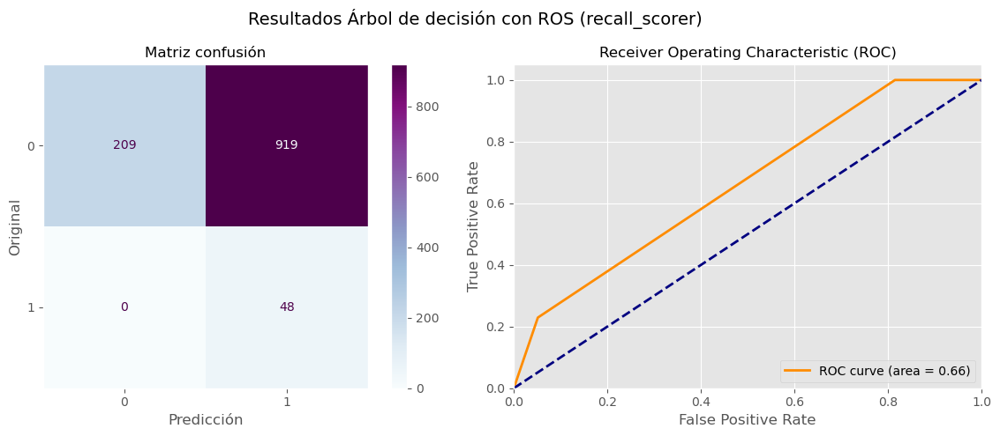

                     0          1  accuracy    macro avg  weighted avg
precision     1.000000   0.049638  0.218537     0.524819      0.961210
recall        0.185284   1.000000  0.218537     0.592642      0.218537
f1-score      0.312640   0.094581  0.218537     0.203611      0.303740
support    1128.000000  48.000000  0.218537  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.2185 || Clase 1: 1.0000 || Clase 0: 0.1853
Precisión total: 0.9612 || Clase 1: 0.0496 || Clase 0: 1.0000
F1 total: 0.3037 || Clase 1: 0.0946 || Clase 0: 0.3126
ROC AUC: 0.5926
El mejor meta-parámetro encontrado: {'ovs__sampling_strategy': 0.2, 't__ccp_alpha': 0.001}
El mejor score es: 0.14574252553758463


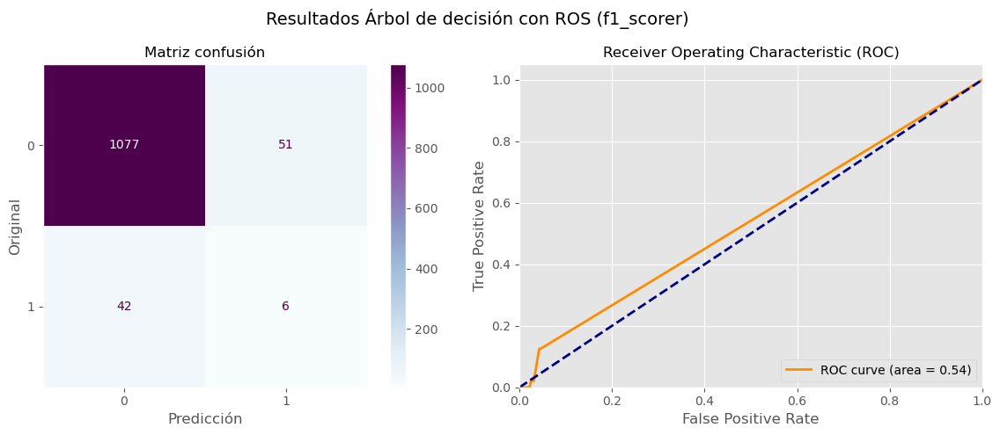

                     0          1  accuracy    macro avg  weighted avg
precision     0.962466   0.105263  0.920918     0.533865      0.927479
recall        0.954787   0.125000  0.920918     0.539894      0.920918
f1-score      0.958611   0.114286  0.920918     0.536449      0.924149
support    1128.000000  48.000000  0.920918  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.9209 || Clase 1: 0.1250 || Clase 0: 0.9548
Precisión total: 0.9275 || Clase 1: 0.1053 || Clase 0: 0.9625
F1 total: 0.9241 || Clase 1: 0.1143 || Clase 0: 0.9586
ROC AUC: 0.5399
El mejor meta-parámetro encontrado: {'ovs__sampling_strategy': 0.5, 't__ccp_alpha': 0.009}
El mejor score es: -0.053337026340871396


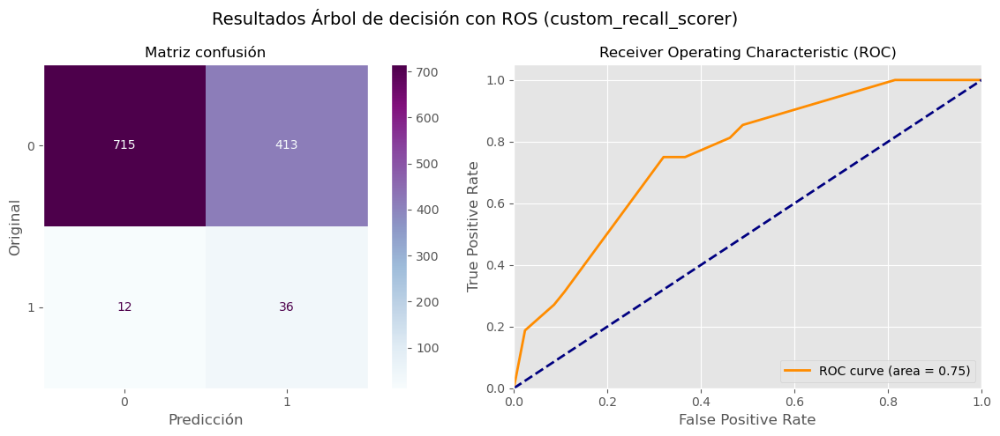

                     0          1  accuracy    macro avg  weighted avg
precision     0.983494   0.080178  0.638605     0.531836      0.946624
recall        0.633865   0.750000  0.638605     0.691933      0.638605
f1-score      0.770889   0.144869  0.638605     0.457879      0.745338
support    1128.000000  48.000000  0.638605  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.6386 || Clase 1: 0.7500 || Clase 0: 0.6339
Precisión total: 0.9466 || Clase 1: 0.0802 || Clase 0: 0.9835
F1 total: 0.7453 || Clase 1: 0.1449 || Clase 0: 0.7709
ROC AUC: 0.6919


In [231]:
metricas = [recall_scorer, f1_scorer, custom_recall_scorer]
nombres_metricas = ['recall_scorer', 'f1_scorer', 'custom_recall_scorer']
titulo = 'Árbol de decisión con ROS'

for metrica, nombre_metrica in zip(metricas, nombres_metricas):

    t_ovs = imbalanced_pipeline([('std', StandardScaler()),
                                    ('ovs', RandomOverSampler(random_state=SEED)),
                                    ('t', DecisionTreeClassifier(random_state=SEED, class_weight='balanced'))])

    # Se definen los meta-parámetros que se quieren optimizar con GridSearchCV.
    parameters = {
        'ovs__sampling_strategy': [0.1, 0.2, 0.5, 0.8, 1],
        't__ccp_alpha': [0.01, 0.001, 0.015, 0.012, 0.009, 0.02]
    }

    # Se aplica GridSearchCV para encontrar los mejores meta-parámetros
    grid_search_t_ovs = GridSearchCV(t_ovs, parameters, cv=5, n_jobs=-1, scoring=metrica) # recall_scorer, f1_scorer, custom_recall_scorer
    grid_search_t_ovs.fit(X_train, y_train)

    # Se muestran por pantalla los mejores meta-parámetros encontrados
    print(f"El mejor meta-parámetro encontrado: {grid_search_t_ovs.best_params_}")
    print(f"El mejor score es: {grid_search_t_ovs.best_score_}")

    resultado = pd.DataFrame(evaluacion_clasificacion(grid_search_t_ovs,  titulo + ' (' + nombre_metrica + ')', X_val, y_val, plot=True, show_print=True))
    resultado['modelo'] = titulo + ' (' + nombre_metrica + ')'
    resultados_rl_list.append(resultado)

#### Con PCA

El mejor meta-parámetro encontrado: {'pca__n_components': 10, 't__ccp_alpha': 0.012}
El mejor score es: 0.5878947368421052


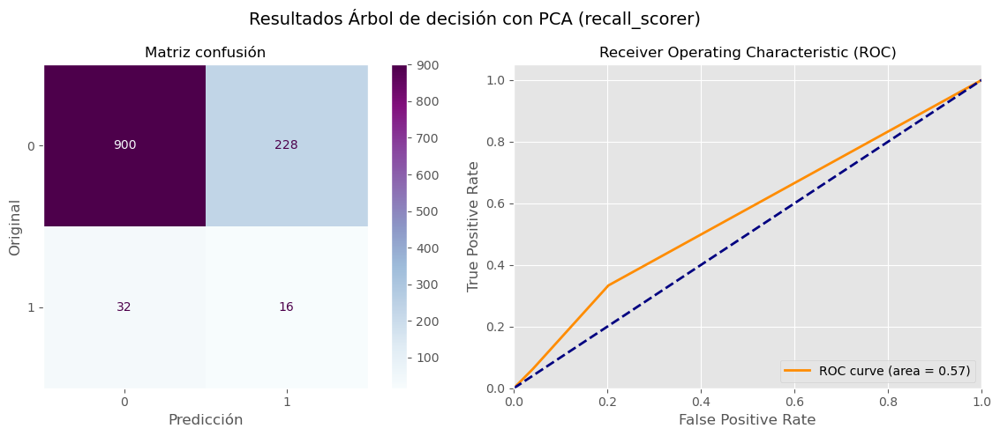

                     0          1  accuracy    macro avg  weighted avg
precision     0.965665   0.065574  0.778912     0.515620      0.928927
recall        0.797872   0.333333  0.778912     0.565603      0.778912
f1-score      0.873786   0.109589  0.778912     0.491688      0.842595
support    1128.000000  48.000000  0.778912  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.7789 || Clase 1: 0.3333 || Clase 0: 0.7979
Precisión total: 0.9289 || Clase 1: 0.0656 || Clase 0: 0.9657
F1 total: 0.8426 || Clase 1: 0.1096 || Clase 0: 0.8738
ROC AUC: 0.5656
El mejor meta-parámetro encontrado: {'pca__n_components': 15, 't__ccp_alpha': 0.009}
El mejor score es: 0.11814718482252143


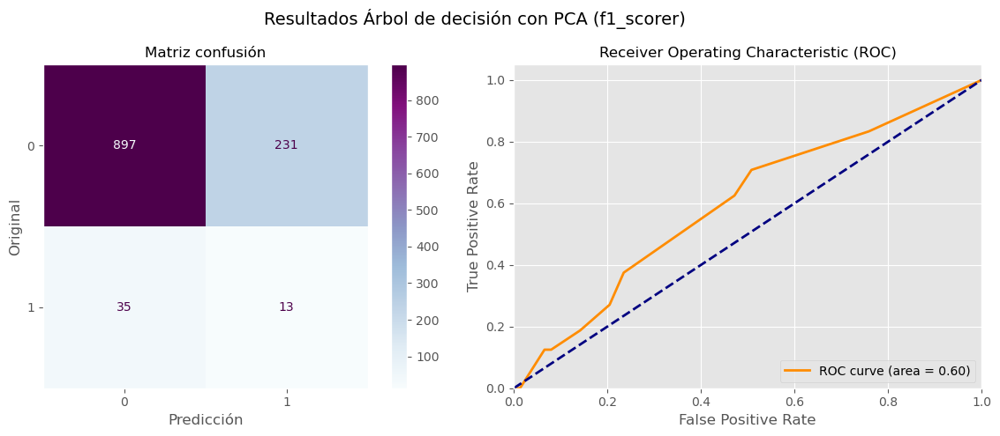

                     0          1  accuracy    macro avg  weighted avg
precision     0.962446   0.053279   0.77381     0.507863      0.925337
recall        0.795213   0.270833   0.77381     0.533023      0.773810
f1-score      0.870874   0.089041   0.77381     0.479957      0.838962
support    1128.000000  48.000000   0.77381  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.7738 || Clase 1: 0.2708 || Clase 0: 0.7952
Precisión total: 0.9253 || Clase 1: 0.0533 || Clase 0: 0.9624
F1 total: 0.8390 || Clase 1: 0.0890 || Clase 0: 0.8709
ROC AUC: 0.5330
El mejor meta-parámetro encontrado: {'pca__n_components': 15, 't__ccp_alpha': 0.009}
El mejor score es: -0.06094564480047006


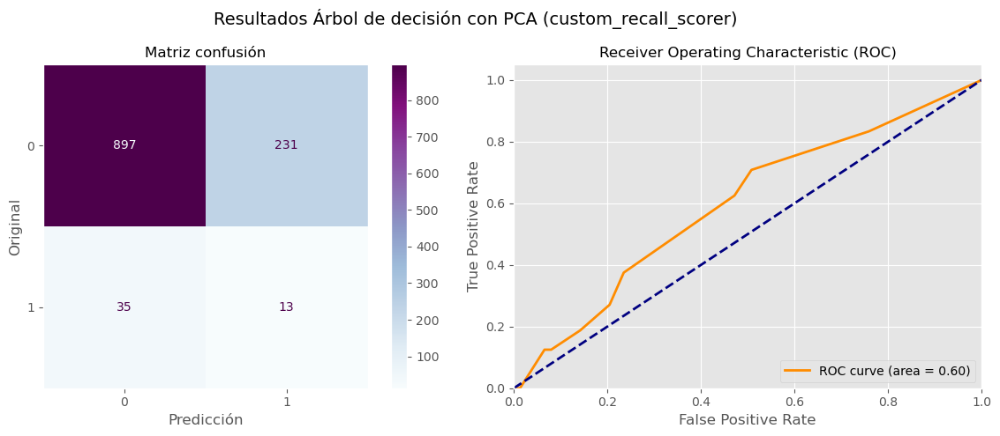

                     0          1  accuracy    macro avg  weighted avg
precision     0.962446   0.053279   0.77381     0.507863      0.925337
recall        0.795213   0.270833   0.77381     0.533023      0.773810
f1-score      0.870874   0.089041   0.77381     0.479957      0.838962
support    1128.000000  48.000000   0.77381  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.7738 || Clase 1: 0.2708 || Clase 0: 0.7952
Precisión total: 0.9253 || Clase 1: 0.0533 || Clase 0: 0.9624
F1 total: 0.8390 || Clase 1: 0.0890 || Clase 0: 0.8709
ROC AUC: 0.5330


In [232]:
metricas = [recall_scorer, f1_scorer, custom_recall_scorer]
nombres_metricas = ['recall_scorer', 'f1_scorer', 'custom_recall_scorer']
titulo = 'Árbol de decisión con PCA'

for metrica, nombre_metrica in zip(metricas, nombres_metricas):

    t_ovs = imbalanced_pipeline([('std', StandardScaler()),
                                    ('pca', PCA(random_state=SEED)),
                                    ('std2', StandardScaler()),
                                    ('t', DecisionTreeClassifier(random_state=SEED, class_weight='balanced'))])

    # Se definen los meta-parámetros que se quieren optimizar con GridSearchCV.
    parameters = {
        'pca__n_components': [5, 10, 15, 20, 30, 40, 56],
        't__ccp_alpha': [0.01, 0.001, 0.015, 0.012, 0.009, 0.02]
    }

    # Se aplica GridSearchCV para encontrar los mejores meta-parámetros
    grid_search_t_ovs = GridSearchCV(t_ovs, parameters, cv=5, n_jobs=-1, scoring=metrica) # recall_scorer, f1_scorer, custom_recall_scorer
    grid_search_t_ovs.fit(X_train, y_train)

    # Se muestran por pantalla los mejores meta-parámetros encontrados
    print(f"El mejor meta-parámetro encontrado: {grid_search_t_ovs.best_params_}")
    print(f"El mejor score es: {grid_search_t_ovs.best_score_}")

    resultado = pd.DataFrame(evaluacion_clasificacion(grid_search_t_ovs,  titulo + ' (' + nombre_metrica + ')', X_val, y_val, plot=True, show_print=True))
    resultado['modelo'] = titulo + ' (' + nombre_metrica + ')'
    resultados_rl_list.append(resultado)

#### Básico

El mejor meta-parámetro encontrado: {'t__ccp_alpha': 0.02}
El mejor score es: 0.7194736842105263


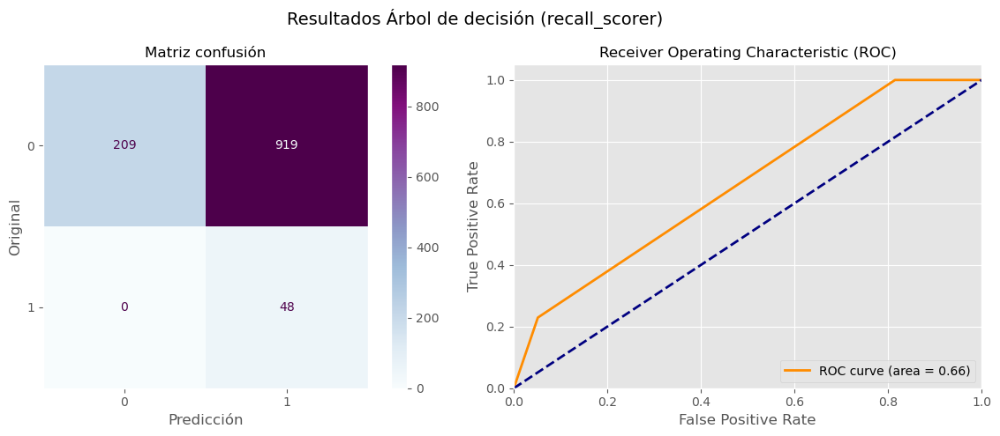

                     0          1  accuracy    macro avg  weighted avg
precision     1.000000   0.049638  0.218537     0.524819      0.961210
recall        0.185284   1.000000  0.218537     0.592642      0.218537
f1-score      0.312640   0.094581  0.218537     0.203611      0.303740
support    1128.000000  48.000000  0.218537  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.2185 || Clase 1: 1.0000 || Clase 0: 0.1853
Precisión total: 0.9612 || Clase 1: 0.0496 || Clase 0: 1.0000
F1 total: 0.3037 || Clase 1: 0.0946 || Clase 0: 0.3126
ROC AUC: 0.5926
El mejor meta-parámetro encontrado: {'t__ccp_alpha': 0.01}
El mejor score es: 0.11656661226506204


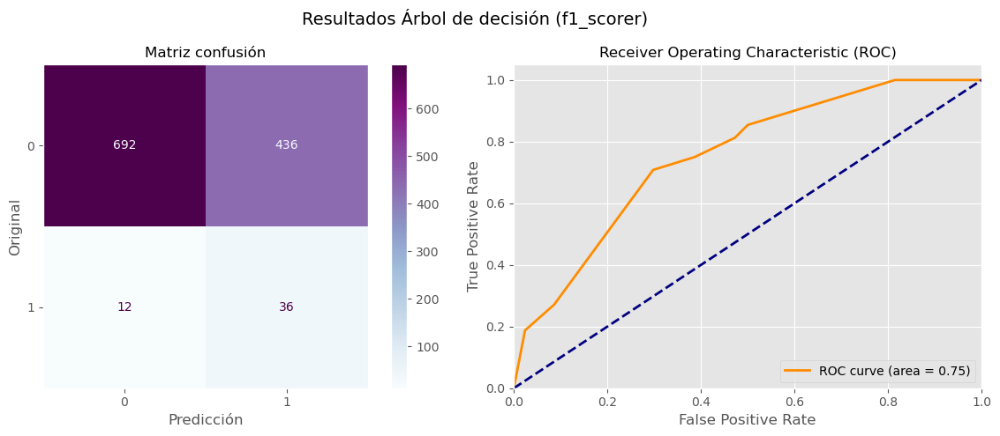

                     0          1  accuracy    macro avg  weighted avg
precision     0.982955   0.076271  0.619048     0.529613      0.945947
recall        0.613475   0.750000  0.619048     0.681738      0.619048
f1-score      0.755459   0.138462  0.619048     0.446960      0.730275
support    1128.000000  48.000000  0.619048  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.6190 || Clase 1: 0.7500 || Clase 0: 0.6135
Precisión total: 0.9459 || Clase 1: 0.0763 || Clase 0: 0.9830
F1 total: 0.7303 || Clase 1: 0.1385 || Clase 0: 0.7555
ROC AUC: 0.6817
El mejor meta-parámetro encontrado: {'t__ccp_alpha': 0.009}
El mejor score es: -0.04045386590742679


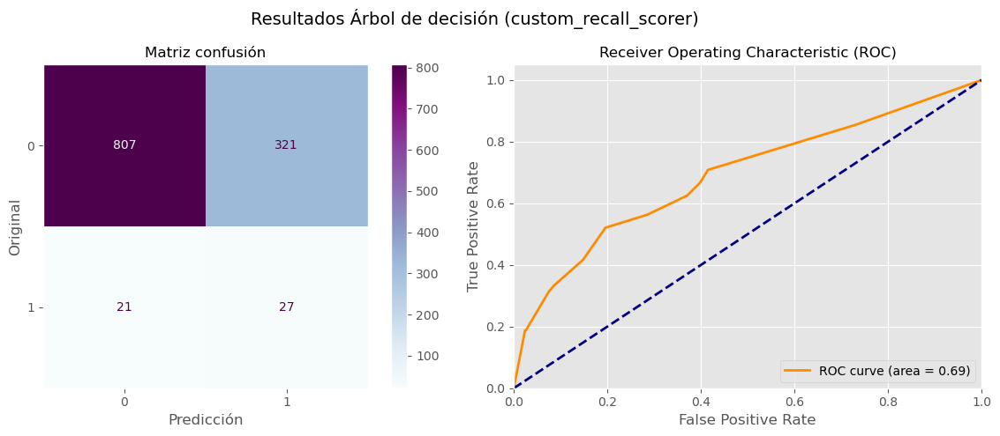

                     0          1  accuracy    macro avg  weighted avg
precision     0.974638   0.077586  0.709184     0.526112      0.938023
recall        0.715426   0.562500  0.709184     0.638963      0.709184
f1-score      0.825153   0.136364  0.709184     0.480759      0.797040
support    1128.000000  48.000000  0.709184  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.7092 || Clase 1: 0.5625 || Clase 0: 0.7154
Precisión total: 0.9380 || Clase 1: 0.0776 || Clase 0: 0.9746
F1 total: 0.7970 || Clase 1: 0.1364 || Clase 0: 0.8252
ROC AUC: 0.6390


In [233]:
metricas = [recall_scorer, f1_scorer, custom_recall_scorer]
nombres_metricas = ['recall_scorer', 'f1_scorer', 'custom_recall_scorer']
titulo = 'Árbol de decisión'

for metrica, nombre_metrica in zip(metricas, nombres_metricas):

    t_ovs = imbalanced_pipeline([('std', StandardScaler()),
                                    ('t', DecisionTreeClassifier(random_state=SEED, class_weight='balanced'))])

    # Se definen los meta-parámetros que se quieren optimizar con GridSearchCV.
    parameters = {
        't__ccp_alpha': [0.01, 0.001, 0.015, 0.012, 0.009, 0.02]
    }

    # Se aplica GridSearchCV para encontrar los mejores meta-parámetros
    grid_search_t_ovs = GridSearchCV(t_ovs, parameters, cv=5, n_jobs=-1, scoring=metrica) # recall_scorer, f1_scorer, custom_recall_scorer
    grid_search_t_ovs.fit(X_train, y_train)

    # Se muestran por pantalla los mejores meta-parámetros encontrados
    print(f"El mejor meta-parámetro encontrado: {grid_search_t_ovs.best_params_}")
    print(f"El mejor score es: {grid_search_t_ovs.best_score_}")

    resultado = pd.DataFrame(evaluacion_clasificacion(grid_search_t_ovs,  titulo + ' (' + nombre_metrica + ')', X_val, y_val, plot=True, show_print=True))
    resultado['modelo'] = titulo + ' (' + nombre_metrica + ')'
    resultados_rl_list.append(resultado)

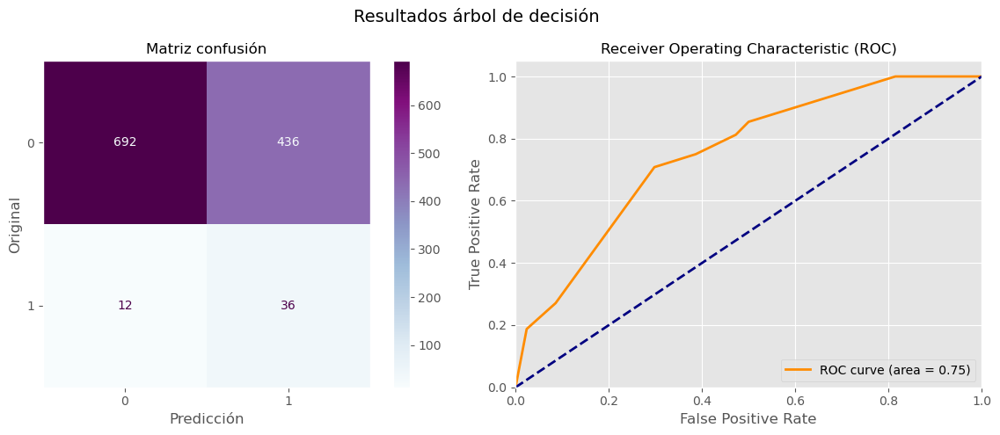

                     0          1  accuracy    macro avg  weighted avg
precision     0.982955   0.076271  0.619048     0.529613      0.945947
recall        0.613475   0.750000  0.619048     0.681738      0.619048
f1-score      0.755459   0.138462  0.619048     0.446960      0.730275
support    1128.000000  48.000000  0.619048  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.6190 || Clase 1: 0.7500 || Clase 0: 0.6135
Precisión total: 0.9459 || Clase 1: 0.0763 || Clase 0: 0.9830
F1 total: 0.7303 || Clase 1: 0.1385 || Clase 0: 0.7555
ROC AUC: 0.6817


In [235]:
t = DecisionTreeClassifier(random_state=SEED, class_weight='balanced', ccp_alpha=0.01)
t.fit(X_train, y_train)
resultado = pd.DataFrame(evaluacion_clasificacion(t, 'árbol de decisión', X_val, y_val, plot=True, show_print=True))
resultado['modelo'] = 'árbol de decisión'
resultados_rl_list.append(resultado)

#### Pruebas

Index(['nombre_via_acc', 'numero_via_acc', 'carga_via', 'mes_acc',
       'media_edad'],
      dtype='object')


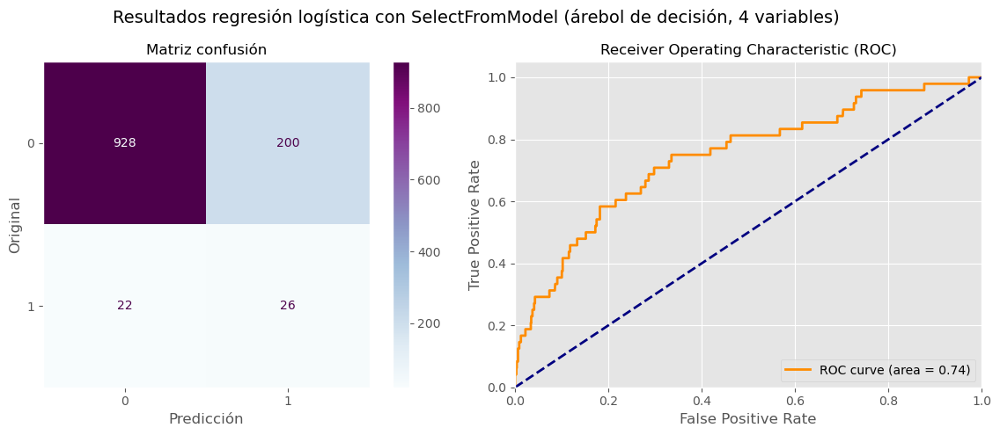

                     0          1  accuracy    macro avg  weighted avg
precision     0.976842   0.115044  0.811224     0.545943      0.941667
recall        0.822695   0.541667  0.811224     0.682181      0.811224
f1-score      0.893167   0.189781  0.811224     0.541474      0.864457
support    1128.000000  48.000000  0.811224  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.8112 || Clase 1: 0.5417 || Clase 0: 0.8227
Precisión total: 0.9417 || Clase 1: 0.1150 || Clase 0: 0.9768
F1 total: 0.8645 || Clase 1: 0.1898 || Clase 0: 0.8932
ROC AUC: 0.6822


In [236]:
selector_t = SelectFromModel(estimator=t , prefit=False, max_features=20)

selector_t.fit(X_train,y_train)

print(X_train.columns[selector_t.get_support()])

pipe_t = Pipeline([('select', selector),
            ('std', StandardScaler()),
            ('model', LogisticRegression(C=1, penalty='l2', random_state=SEED, solver='newton-cholesky', class_weight='balanced', max_iter=5000))
])
pipe_t.fit(X_train, y_train)

resultado = pd.DataFrame(evaluacion_clasificacion(pipe_t, 'regresión logística con SelectFromModel (árebol de decisión, 4 variables)', X_val, y_val, plot=True, show_print=True))
resultado['modelo'] = 'regresión logística con SelectFromModel (árebol de decisión, 4 variables)'
resultados_rl_list.append(resultado)

Los resultados siguen siendo pobres, pero mejores que los de la regresión logística

### 3. Ridge Classifier
Se va aprobar el modelo lineal de Ridge Classifier, si bien ya se vio que el modelo de regresión logística no arrojaba muy buenos resultados para los valores 1 de la target.

In [216]:
# Se separan las variables de entrada y la target
target = df_accidentes["gravedad"]
variables = df_accidentes.drop(["gravedad","lesividad"], axis=1, inplace=False)

# Proporción de división entre conjuntos de train y test
train_ratio = 0.7  # 70% para train, 30% para test

X_train, X_val, y_train, y_val = train_test_split(variables, target, train_size=train_ratio, shuffle=False, random_state=SEED)

# Examinamos la forma de los conjuntos de datos
X_train.shape, X_val.shape, y_train.shape, y_val.shape

((2744, 59), (1176, 59), (2744,), (1176,))

#### Con oversampling y PCA

El mejor meta-parámetro encontrado: {'ovs__sampling_strategy': 1, 'pca__n_components': 56, 'ridge__alpha': 100}
El mejor score es: 0.5631578947368421


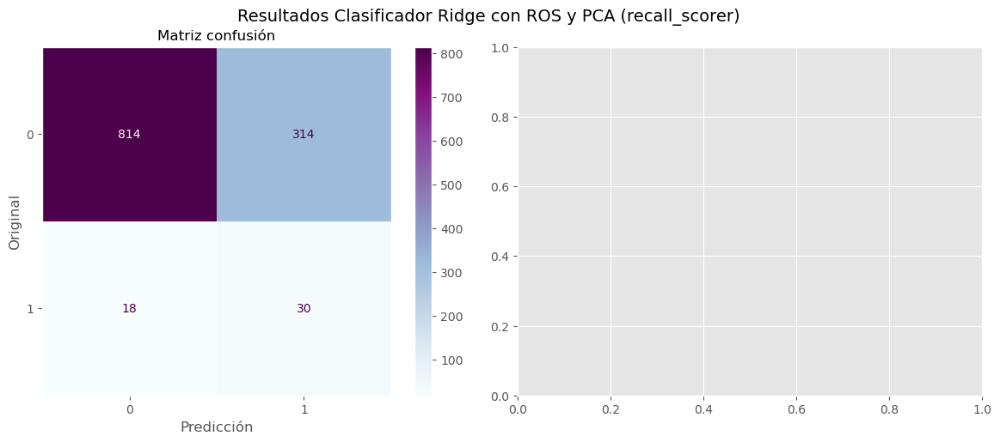

                     0          1  accuracy    macro avg  weighted avg
precision     0.978365   0.087209  0.717687     0.532787      0.941992
recall        0.721631   0.625000  0.717687     0.673316      0.717687
f1-score      0.830612   0.153061  0.717687     0.491837      0.802957
support    1128.000000  48.000000  0.717687  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.7177 || Clase 1: 0.6250 || Clase 0: 0.7216
Precisión total: 0.9420 || Clase 1: 0.0872 || Clase 0: 0.9784
F1 total: 0.8030 || Clase 1: 0.1531 || Clase 0: 0.8306
ROC AUC: 0.6733
El mejor meta-parámetro encontrado: {'ovs__sampling_strategy': 0.5, 'pca__n_components': 40, 'ridge__alpha': 10000}
El mejor score es: 0.12044367428004232


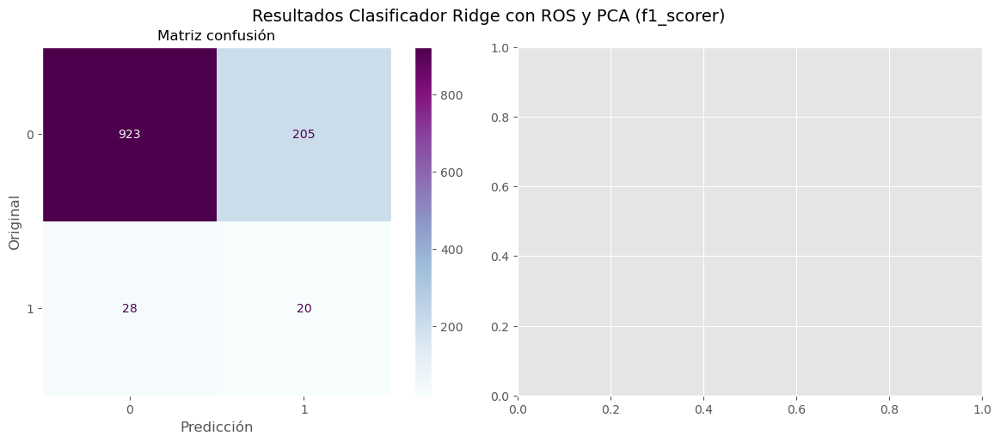

                     0          1  accuracy    macro avg  weighted avg
precision     0.970557   0.088889  0.801871     0.529723      0.934571
recall        0.818262   0.416667  0.801871     0.617465      0.801871
f1-score      0.887927   0.146520  0.801871     0.517224      0.857665
support    1128.000000  48.000000  0.801871  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.8019 || Clase 1: 0.4167 || Clase 0: 0.8183
Precisión total: 0.9346 || Clase 1: 0.0889 || Clase 0: 0.9706
F1 total: 0.8577 || Clase 1: 0.1465 || Clase 0: 0.8879
ROC AUC: 0.6175
El mejor meta-parámetro encontrado: {'ovs__sampling_strategy': 1, 'pca__n_components': 56, 'ridge__alpha': 1000}
El mejor score es: -0.0772320484997989


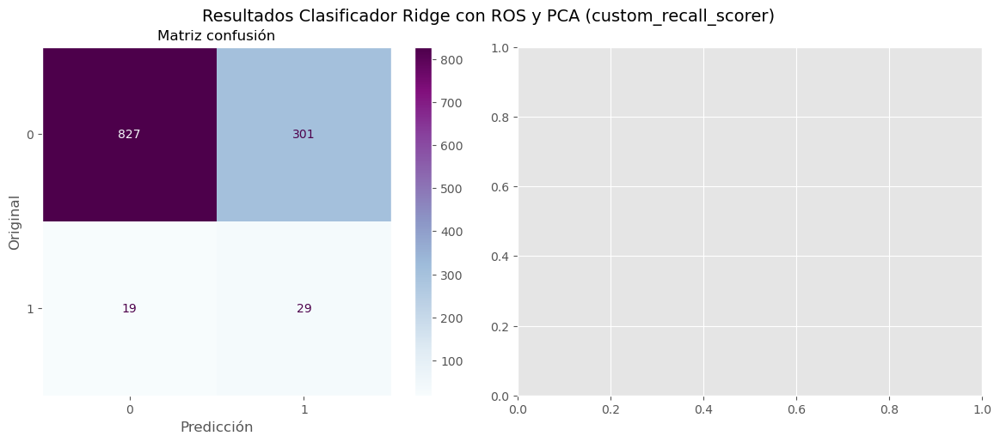

                     0          1  accuracy    macro avg  weighted avg
precision     0.977541   0.087879  0.727891     0.532710      0.941229
recall        0.733156   0.604167  0.727891     0.668661      0.727891
f1-score      0.837893   0.153439  0.727891     0.495666      0.809956
support    1128.000000  48.000000  0.727891  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.7279 || Clase 1: 0.6042 || Clase 0: 0.7332
Precisión total: 0.9412 || Clase 1: 0.0879 || Clase 0: 0.9775
F1 total: 0.8100 || Clase 1: 0.1534 || Clase 0: 0.8379
ROC AUC: 0.6687


In [62]:
metricas = [recall_scorer, f1_scorer, custom_recall_scorer]
nombres_metricas = ['recall_scorer', 'f1_scorer', 'custom_recall_scorer']
titulo = 'Clasificador Ridge con ROS y PCA'

for metrica, nombre_metrica in zip(metricas, nombres_metricas):

    rc_ovs = imbalanced_pipeline([('std', StandardScaler()),
                                    ('ovs', RandomOverSampler(random_state=SEED)),
                                    ('pca', PCA(random_state=SEED)),
                                    ('std2', StandardScaler()),
                                    ('ridge', RidgeClassifier(random_state=SEED, class_weight='balanced'))])

    # Se definen los meta-parámetros que se quieren optimizar con GridSearchCV.
    parameters = {
        'ovs__sampling_strategy': [0.1, 0.2, 0.5, 0.8, 1],
        'pca__n_components': [5, 10, 15, 20, 30, 40, 56],
        'ridge__alpha': [0, 0.0001, 0.001, 0.01, 0.1, 1, 10, 100, 1000, 10000]
    }

    # Se aplica GridSearchCV para encontrar los mejores meta-parámetros
    grid_search_rc_ovs = GridSearchCV(rc_ovs, parameters, cv=5, n_jobs=-1, scoring=metrica) # recall_scorer, f1_scorer, custom_recall_scorer
    grid_search_rc_ovs.fit(X_train, y_train)

    # Se muestran por pantalla los mejores meta-parámetros encontrados
    print(f"El mejor meta-parámetro encontrado: {grid_search_rc_ovs.best_params_}")
    print(f"El mejor score es: {grid_search_rc_ovs.best_score_}")

    evaluacion_clasificacion(grid_search_rc_ovs,  titulo + ' (' + nombre_metrica + ')', X_val, y_val, proba=False, plot=True, show_print=True)

#### Con Oversampling

El mejor meta-parámetro encontrado: {'ovs__sampling_strategy': 1, 'ridge__alpha': 0}
El mejor score es: 0.4631578947368421


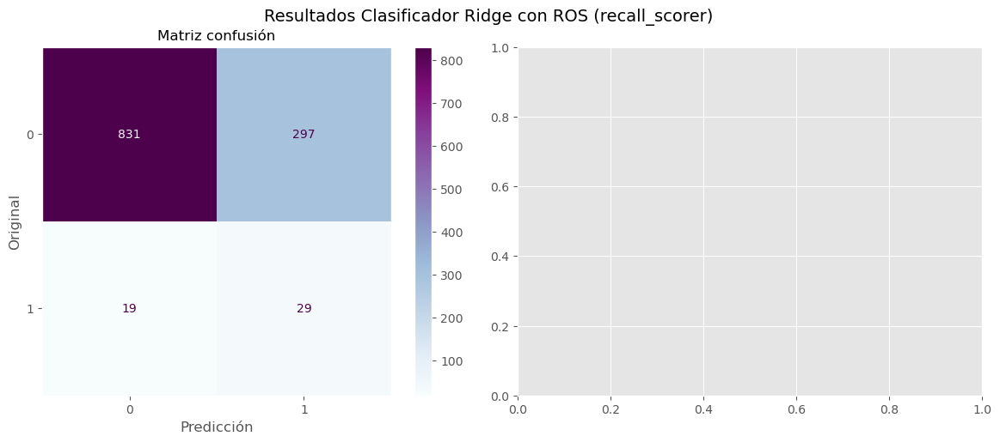

                     0          1  accuracy    macro avg  weighted avg
precision     0.977647   0.088957  0.731293     0.533302      0.941374
recall        0.736702   0.604167  0.731293     0.670434      0.731293
f1-score      0.840243   0.155080  0.731293     0.497661      0.812277
support    1128.000000  48.000000  0.731293  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.7313 || Clase 1: 0.6042 || Clase 0: 0.7367
Precisión total: 0.9414 || Clase 1: 0.0890 || Clase 0: 0.9776
F1 total: 0.8123 || Clase 1: 0.1551 || Clase 0: 0.8402
ROC AUC: 0.6704
El mejor meta-parámetro encontrado: {'ovs__sampling_strategy': 1, 'ridge__alpha': 10000}
El mejor score es: 0.12057450703053499


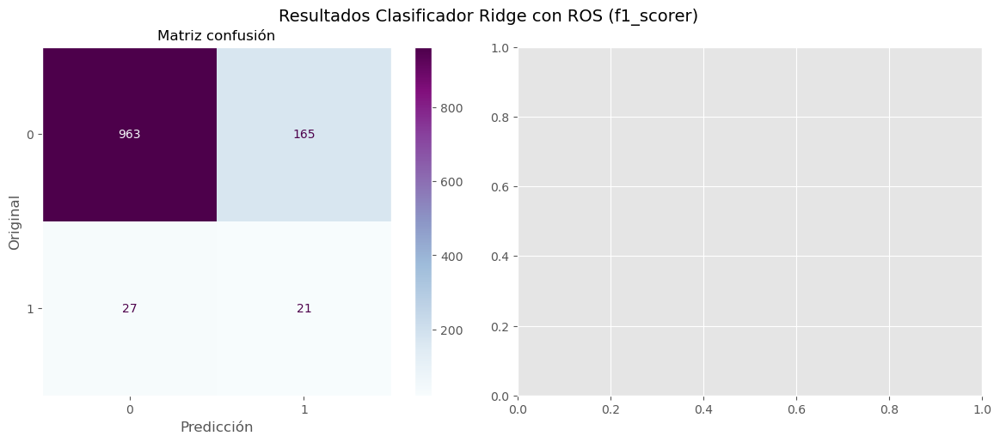

                     0          1  accuracy    macro avg  weighted avg
precision     0.972727   0.112903  0.836735     0.542815      0.937632
recall        0.853723   0.437500  0.836735     0.645612      0.836735
f1-score      0.909348   0.179487  0.836735     0.544418      0.879558
support    1128.000000  48.000000  0.836735  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.8367 || Clase 1: 0.4375 || Clase 0: 0.8537
Precisión total: 0.9376 || Clase 1: 0.1129 || Clase 0: 0.9727
F1 total: 0.8796 || Clase 1: 0.1795 || Clase 0: 0.9093
ROC AUC: 0.6456
El mejor meta-parámetro encontrado: {'ovs__sampling_strategy': 1, 'ridge__alpha': 0}
El mejor score es: -0.09317457510637066


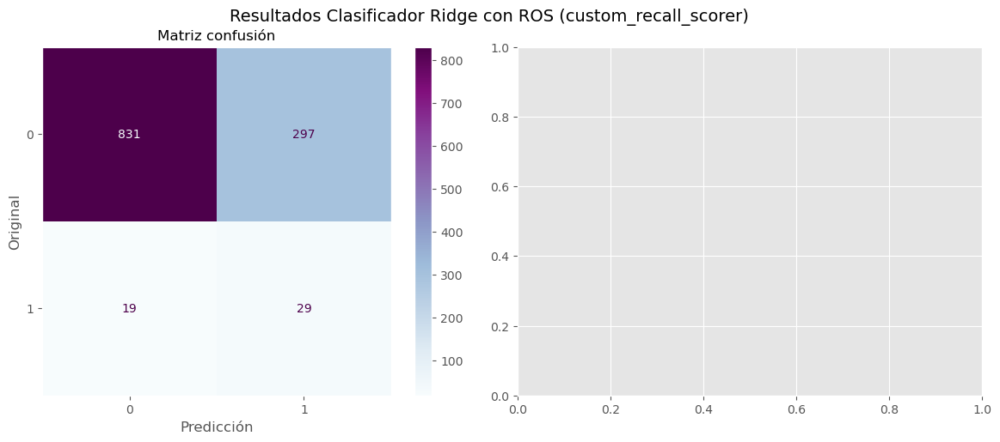

                     0          1  accuracy    macro avg  weighted avg
precision     0.977647   0.088957  0.731293     0.533302      0.941374
recall        0.736702   0.604167  0.731293     0.670434      0.731293
f1-score      0.840243   0.155080  0.731293     0.497661      0.812277
support    1128.000000  48.000000  0.731293  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.7313 || Clase 1: 0.6042 || Clase 0: 0.7367
Precisión total: 0.9414 || Clase 1: 0.0890 || Clase 0: 0.9776
F1 total: 0.8123 || Clase 1: 0.1551 || Clase 0: 0.8402
ROC AUC: 0.6704


In [64]:
metricas = [recall_scorer, f1_scorer, custom_recall_scorer]
nombres_metricas = ['recall_scorer', 'f1_scorer', 'custom_recall_scorer']
titulo = 'Clasificador Ridge con ROS'

for metrica, nombre_metrica in zip(metricas, nombres_metricas):

    rc_ovs = imbalanced_pipeline([('std', StandardScaler()),
                                    ('ovs', RandomOverSampler(random_state=SEED)),
                                    ('ridge', RidgeClassifier(random_state=SEED, class_weight='balanced'))])

    # Se definen los meta-parámetros que se quieren optimizar con GridSearchCV.
    parameters = {
        'ovs__sampling_strategy': [0.1, 0.2, 0.5, 0.8, 1],
        'ridge__alpha': [0, 0.0001, 0.001, 0.01, 0.1, 1, 10, 100, 1000, 10000]
    }

    # Se aplica GridSearchCV para encontrar los mejores meta-parámetros
    grid_search_rc_ovs = GridSearchCV(rc_ovs, parameters, cv=5, n_jobs=-1, scoring=metrica) # recall_scorer, f1_scorer, custom_recall_scorer
    grid_search_rc_ovs.fit(X_train, y_train)

    # Se muestran por pantalla los mejores meta-parámetros encontrados
    print(f"El mejor meta-parámetro encontrado: {grid_search_rc_ovs.best_params_}")
    print(f"El mejor score es: {grid_search_rc_ovs.best_score_}")

    evaluacion_clasificacion(grid_search_rc_ovs,  titulo + ' (' + nombre_metrica + ')', X_val, y_val, proba=False, plot=True, show_print=True)

#### Con PCA

El mejor meta-parámetro encontrado: {'pca__n_components': 5, 'ridge__alpha': 100}
El mejor score es: 0.5968421052631578


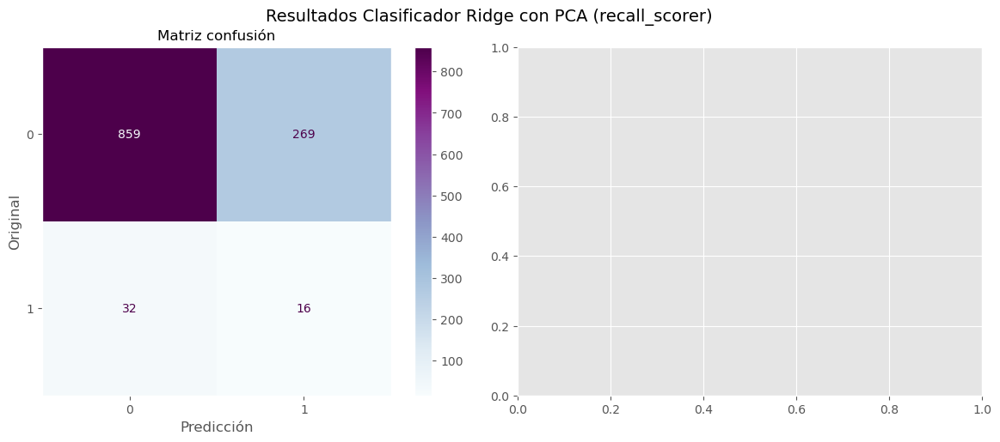

                     0          1  accuracy    macro avg  weighted avg
precision     0.964085   0.056140  0.744048     0.510113      0.927026
recall        0.761525   0.333333  0.744048     0.547429      0.744048
f1-score      0.850916   0.096096  0.744048     0.473506      0.820107
support    1128.000000  48.000000  0.744048  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.7440 || Clase 1: 0.3333 || Clase 0: 0.7615
Precisión total: 0.9270 || Clase 1: 0.0561 || Clase 0: 0.9641
F1 total: 0.8201 || Clase 1: 0.0961 || Clase 0: 0.8509
ROC AUC: 0.5474
El mejor meta-parámetro encontrado: {'pca__n_components': 10, 'ridge__alpha': 10000}
El mejor score es: 0.1174402946799686


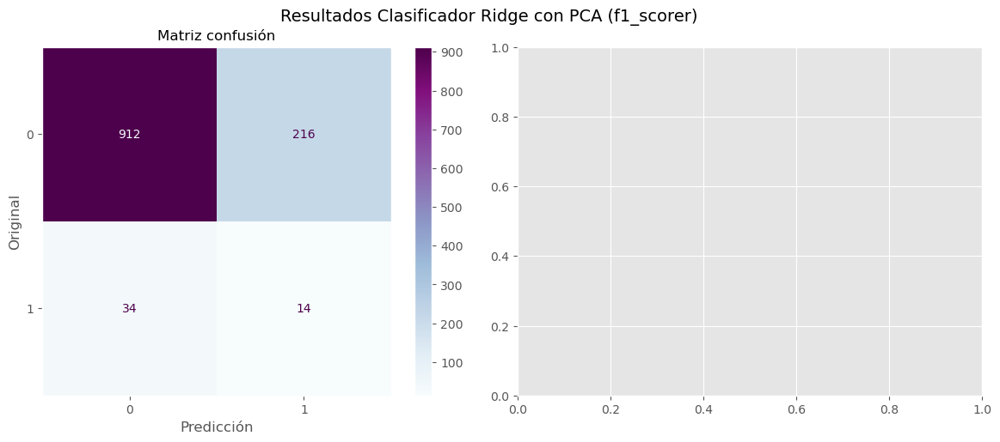

                     0          1  accuracy    macro avg  weighted avg
precision     0.964059   0.060870  0.787415     0.512464      0.927194
recall        0.808511   0.291667  0.787415     0.550089      0.787415
f1-score      0.879460   0.100719  0.787415     0.490090      0.847675
support    1128.000000  48.000000  0.787415  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.7874 || Clase 1: 0.2917 || Clase 0: 0.8085
Precisión total: 0.9272 || Clase 1: 0.0609 || Clase 0: 0.9641
F1 total: 0.8477 || Clase 1: 0.1007 || Clase 0: 0.8795
ROC AUC: 0.5501
El mejor meta-parámetro encontrado: {'pca__n_components': 5, 'ridge__alpha': 100}
El mejor score es: -0.07149832759881397


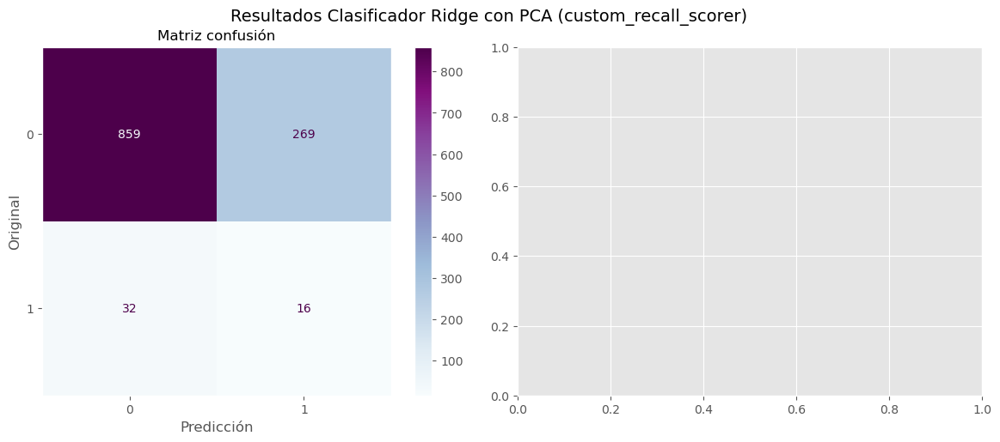

                     0          1  accuracy    macro avg  weighted avg
precision     0.964085   0.056140  0.744048     0.510113      0.927026
recall        0.761525   0.333333  0.744048     0.547429      0.744048
f1-score      0.850916   0.096096  0.744048     0.473506      0.820107
support    1128.000000  48.000000  0.744048  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.7440 || Clase 1: 0.3333 || Clase 0: 0.7615
Precisión total: 0.9270 || Clase 1: 0.0561 || Clase 0: 0.9641
F1 total: 0.8201 || Clase 1: 0.0961 || Clase 0: 0.8509
ROC AUC: 0.5474


In [65]:
metricas = [recall_scorer, f1_scorer, custom_recall_scorer]
nombres_metricas = ['recall_scorer', 'f1_scorer', 'custom_recall_scorer']
titulo = 'Clasificador Ridge con PCA'

for metrica, nombre_metrica in zip(metricas, nombres_metricas):

    rc_ovs = imbalanced_pipeline([('std', StandardScaler()),
                                    ('pca', PCA(random_state=SEED)),
                                    ('std2', StandardScaler()),
                                    ('ridge', RidgeClassifier(random_state=SEED, class_weight='balanced'))])

    # Se definen los meta-parámetros que se quieren optimizar con GridSearchCV.
    parameters = {
        'pca__n_components': [5, 10, 15, 20, 30, 40, 56],
        'ridge__alpha': [0, 0.0001, 0.001, 0.01, 0.1, 1, 10, 100, 1000, 10000]
    }

    # Se aplica GridSearchCV para encontrar los mejores meta-parámetros
    grid_search_rc_ovs = GridSearchCV(rc_ovs, parameters, cv=5, n_jobs=-1, scoring=metrica) # recall_scorer, f1_scorer, custom_recall_scorer
    grid_search_rc_ovs.fit(X_train, y_train)

    # Se muestran por pantalla los mejores meta-parámetros encontrados
    print(f"El mejor meta-parámetro encontrado: {grid_search_rc_ovs.best_params_}")
    print(f"El mejor score es: {grid_search_rc_ovs.best_score_}")

    evaluacion_clasificacion(grid_search_rc_ovs,  titulo + ' (' + nombre_metrica + ')', X_val, y_val, proba=False, plot=True, show_print=True)

#### Básico

El mejor meta-parámetro encontrado: {'ridge__alpha': 1000}
El mejor score es: 0.44105263157894736


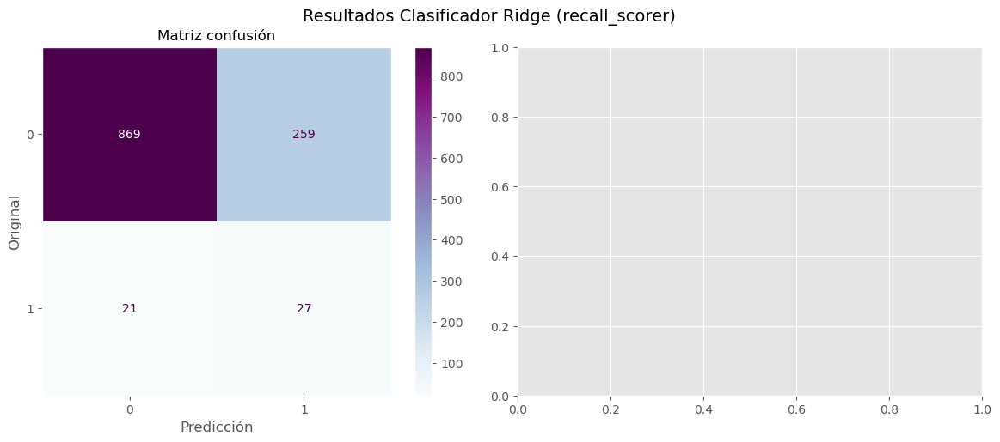

                     0          1  accuracy    macro avg  weighted avg
precision     0.976404   0.094406  0.761905     0.535405      0.940405
recall        0.770390   0.562500  0.761905     0.666445      0.761905
f1-score      0.861249   0.161677  0.761905     0.511463      0.832695
support    1128.000000  48.000000  0.761905  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.7619 || Clase 1: 0.5625 || Clase 0: 0.7704
Precisión total: 0.9404 || Clase 1: 0.0944 || Clase 0: 0.9764
F1 total: 0.8327 || Clase 1: 0.1617 || Clase 0: 0.8612
ROC AUC: 0.6664
El mejor meta-parámetro encontrado: {'ridge__alpha': 10000}
El mejor score es: 0.12120373318636439


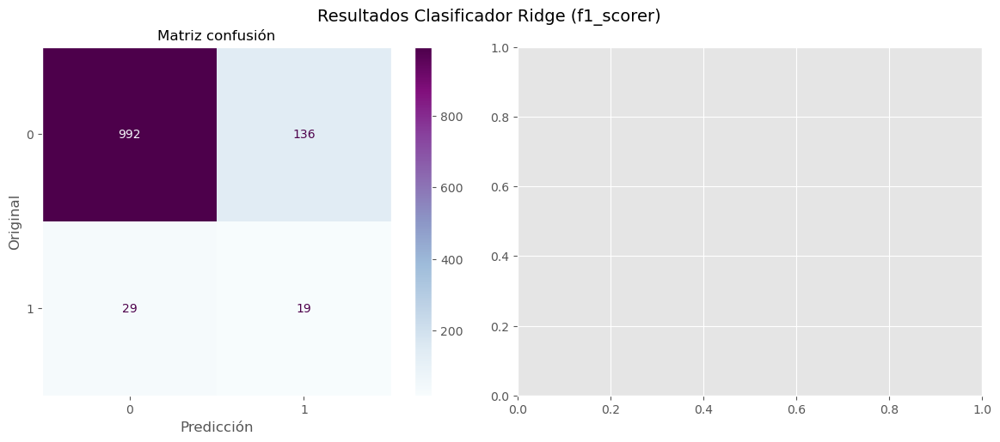

                     0          1  accuracy    macro avg  weighted avg
precision     0.971596   0.122581  0.859694     0.547089      0.936943
recall        0.879433   0.395833  0.859694     0.637633      0.859694
f1-score      0.923220   0.187192  0.859694     0.555206      0.893178
support    1128.000000  48.000000  0.859694  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.8597 || Clase 1: 0.3958 || Clase 0: 0.8794
Precisión total: 0.9369 || Clase 1: 0.1226 || Clase 0: 0.9716
F1 total: 0.8932 || Clase 1: 0.1872 || Clase 0: 0.9232
ROC AUC: 0.6376
El mejor meta-parámetro encontrado: {'ridge__alpha': 10}
El mejor score es: -0.10924276291674825


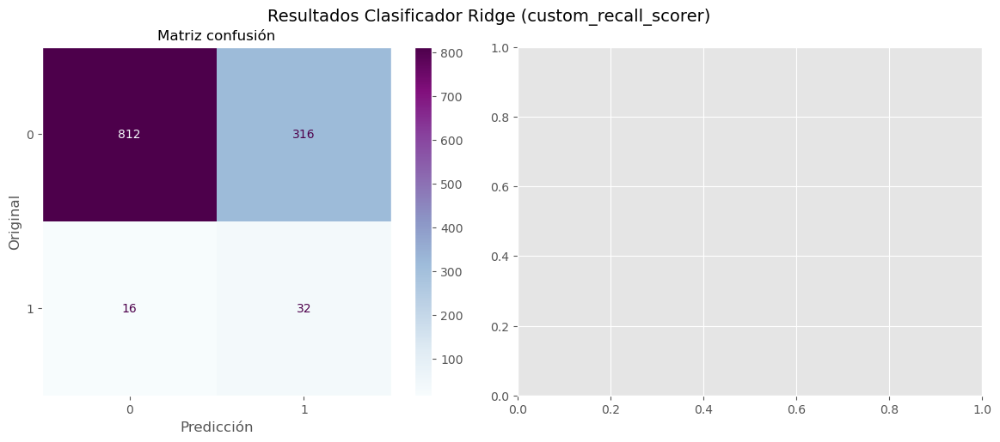

                     0          1  accuracy    macro avg  weighted avg
precision     0.980676   0.091954  0.717687     0.536315      0.944402
recall        0.719858   0.666667  0.717687     0.693262      0.717687
f1-score      0.830266   0.161616  0.717687     0.495941      0.802974
support    1128.000000  48.000000  0.717687  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.7177 || Clase 1: 0.6667 || Clase 0: 0.7199
Precisión total: 0.9444 || Clase 1: 0.0920 || Clase 0: 0.9807
F1 total: 0.8030 || Clase 1: 0.1616 || Clase 0: 0.8303
ROC AUC: 0.6933


In [66]:
metricas = [recall_scorer, f1_scorer, custom_recall_scorer]
nombres_metricas = ['recall_scorer', 'f1_scorer', 'custom_recall_scorer']
titulo = 'Clasificador Ridge'

for metrica, nombre_metrica in zip(metricas, nombres_metricas):

    rc_ovs = imbalanced_pipeline([('std', StandardScaler()),
                                    ('ridge', RidgeClassifier(random_state=SEED, class_weight='balanced'))])

    # Se definen los meta-parámetros que se quieren optimizar con GridSearchCV.
    parameters = {
        'ridge__alpha': [0, 0.0001, 0.001, 0.01, 0.1, 1, 10, 100, 1000, 10000]
    }

    # Se aplica GridSearchCV para encontrar los mejores meta-parámetros
    grid_search_rc_ovs = GridSearchCV(rc_ovs, parameters, cv=5, n_jobs=-1, scoring=metrica) # recall_scorer, f1_scorer, custom_recall_scorer
    grid_search_rc_ovs.fit(X_train, y_train)

    # Se muestran por pantalla los mejores meta-parámetros encontrados
    print(f"El mejor meta-parámetro encontrado: {grid_search_rc_ovs.best_params_}")
    print(f"El mejor score es: {grid_search_rc_ovs.best_score_}")

    evaluacion_clasificacion(grid_search_rc_ovs,  titulo + ' (' + nombre_metrica + ')', X_val, y_val, proba=False, plot=True, show_print=True)

En este caso, el RidgeClassifier arroja el mismo mal resultado que LogisticRegression. Este modelo resulta útil para evitar el overfitting gracias a la regularización que aplica mediante el meta-parámetro alpha. A mayor alpha, mayor regularización. En este caso, al utilizar el GridSearchCV se observa que los mejores resultados del modelo se dan con un alpha muy pequeño, y aún así, el recall para los valores verdaderos de la target es muy malo.

Se probará con un clasificador lineal con entramiento por descenso de gradiente estocástico SGD (SGD Classifier). Se decide probar con este algoritmo de optimización ya que es una técnica rápida que suele funcionar bien con grandes conjuntos de datos.

### 4. SGD Classifier

In [221]:
# Se separan las variables de entrada y la target
target = df_accidentes["gravedad"]
variables = df_accidentes.drop(["gravedad","lesividad"], axis=1, inplace=False)

# Proporción de división entre conjuntos de train y test
train_ratio = 0.7  # 70% para train, 30% para test

X_train, X_val, y_train, y_val = train_test_split(variables, target, train_size=train_ratio, shuffle=False, random_state=SEED)

# Examinamos la forma de los conjuntos de datos
X_train.shape, X_val.shape, y_train.shape, y_val.shape

((2744, 59), (1176, 59), (2744,), (1176,))

#### Con oversampling y PCA

El mejor meta-parámetro encontrado: {'ovs__sampling_strategy': 0.2, 'pca__n_components': 5, 'sgd__alpha': 0.0001, 'sgd__loss': 'modified_huber', 'sgd__penalty': None}
El mejor score es: 0.7494736842105263


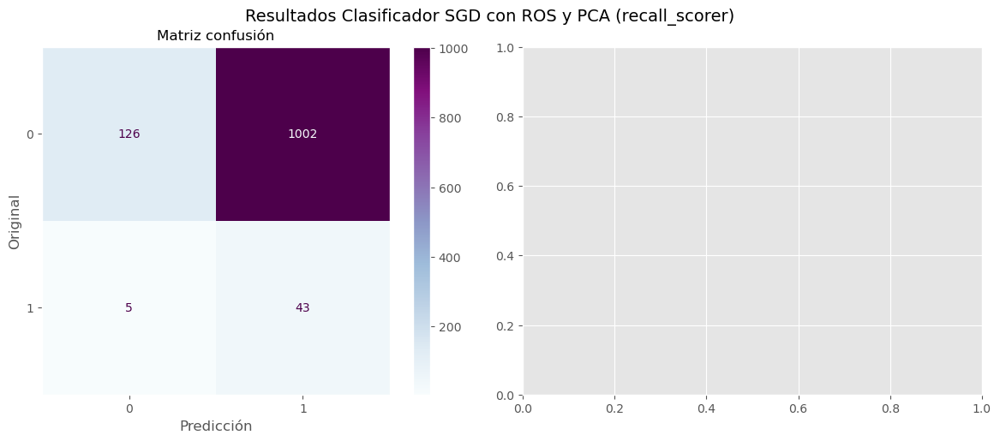

                     0          1  accuracy    macro avg  weighted avg
precision     0.961832   0.041148  0.143707     0.501490      0.924253
recall        0.111702   0.895833  0.143707     0.503768      0.143707
f1-score      0.200159   0.078683  0.143707     0.139421      0.195201
support    1128.000000  48.000000  0.143707  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.1437 || Clase 1: 0.8958 || Clase 0: 0.1117
Precisión total: 0.9243 || Clase 1: 0.0411 || Clase 0: 0.9618
F1 total: 0.1952 || Clase 1: 0.0787 || Clase 0: 0.2002
ROC AUC: 0.5038
El mejor meta-parámetro encontrado: {'ovs__sampling_strategy': 0.5, 'pca__n_components': 5, 'sgd__alpha': 0.01, 'sgd__loss': 'squared_hinge', 'sgd__penalty': 'elasticnet'}
El mejor score es: 0.1298358414841016


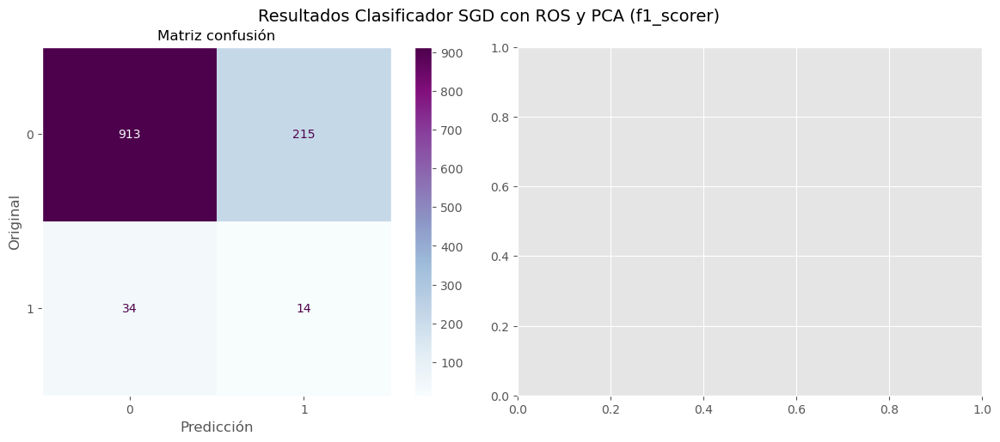

                     0          1  accuracy    macro avg  weighted avg
precision     0.964097   0.061135  0.788265     0.512616      0.927242
recall        0.809397   0.291667  0.788265     0.550532      0.788265
f1-score      0.880000   0.101083  0.788265     0.490542      0.848207
support    1128.000000  48.000000  0.788265  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.7883 || Clase 1: 0.2917 || Clase 0: 0.8094
Precisión total: 0.9272 || Clase 1: 0.0611 || Clase 0: 0.9641
F1 total: 0.8482 || Clase 1: 0.1011 || Clase 0: 0.8800
ROC AUC: 0.5505
El mejor meta-parámetro encontrado: {'ovs__sampling_strategy': 0.8, 'pca__n_components': 30, 'sgd__alpha': 0.001, 'sgd__loss': 'log_loss', 'sgd__penalty': 'elasticnet'}
El mejor score es: -0.0368709708003297


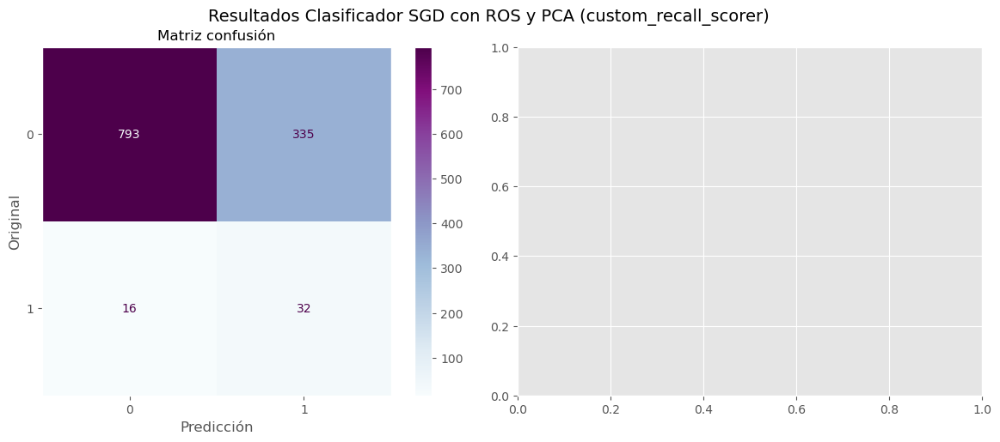

                     0          1  accuracy    macro avg  weighted avg
precision     0.980222   0.087193  0.701531     0.533708      0.943772
recall        0.703014   0.666667  0.701531     0.684840      0.701531
f1-score      0.818792   0.154217  0.701531     0.486504      0.791666
support    1128.000000  48.000000  0.701531  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.7015 || Clase 1: 0.6667 || Clase 0: 0.7030
Precisión total: 0.9438 || Clase 1: 0.0872 || Clase 0: 0.9802
F1 total: 0.7917 || Clase 1: 0.1542 || Clase 0: 0.8188
ROC AUC: 0.6848


In [69]:
metricas = [recall_scorer, f1_scorer, custom_recall_scorer]
nombres_metricas = ['recall_scorer', 'f1_scorer', 'custom_recall_scorer']
titulo = 'Clasificador SGD con ROS y PCA'

for metrica, nombre_metrica in zip(metricas, nombres_metricas):

    sgd_ovs = imbalanced_pipeline([('std', StandardScaler()),
                                    ('ovs', RandomOverSampler(random_state=SEED)),
                                    ('pca', PCA(random_state=SEED)),
                                    ('std2', StandardScaler()),
                                    ('sgd', SGDClassifier(max_iter = 5000, random_state=SEED, early_stopping=True, class_weight='balanced'))
                                    ])

    # Se definen los meta-parámetros que se quieren optimizar con GridSearchCV.
    parameters = {
        'ovs__sampling_strategy': [0.1, 0.2, 0.5, 0.8, 1],
        'pca__n_components': [5, 10, 15, 20, 30, 40, 56],
        'sgd__alpha': [0.0001, 0.001, 0.01, 0.1],
        'sgd__penalty': ['l2', 'l1', 'elasticnet', None],
        'sgd__loss': ['log_loss', 'modified_huber', 'squared_hinge'] #'hinge' se quita porque da mal recall
    }

    # Se aplica GridSearchCV para encontrar los mejores meta-parámetros
    grid_search_sgd_ovs = GridSearchCV(sgd_ovs, parameters, cv=5, n_jobs=-1, scoring=metrica) # recall_scorer, f1_scorer, custom_recall_scorer
    grid_search_sgd_ovs.fit(X_train, y_train)

    # Se muestran por pantalla los mejores meta-parámetros encontrados
    print(f"El mejor meta-parámetro encontrado: {grid_search_sgd_ovs.best_params_}")
    print(f"El mejor score es: {grid_search_sgd_ovs.best_score_}")

    evaluacion_clasificacion(grid_search_sgd_ovs,  titulo + ' (' + nombre_metrica + ')', X_val, y_val, proba=False, plot=True, show_print=True)

#### Con oversampling

El mejor meta-parámetro encontrado: {'ovs__sampling_strategy': 0.8, 'sgd__alpha': 0.001, 'sgd__loss': 'squared_hinge', 'sgd__penalty': None}
El mejor score es: 0.6078947368421053


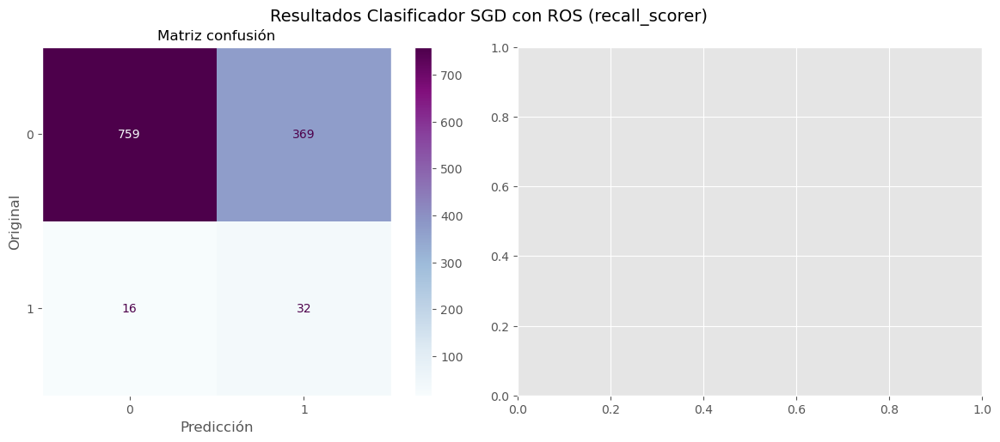

                     0          1  accuracy    macro avg  weighted avg
precision     0.979355   0.079800  0.672619     0.529578      0.942638
recall        0.672872   0.666667  0.672619     0.669770      0.672619
f1-score      0.797688   0.142539  0.672619     0.470113      0.770947
support    1128.000000  48.000000  0.672619  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.6726 || Clase 1: 0.6667 || Clase 0: 0.6729
Precisión total: 0.9426 || Clase 1: 0.0798 || Clase 0: 0.9794
F1 total: 0.7709 || Clase 1: 0.1425 || Clase 0: 0.7977
ROC AUC: 0.6698
El mejor meta-parámetro encontrado: {'ovs__sampling_strategy': 0.5, 'sgd__alpha': 0.1, 'sgd__loss': 'log_loss', 'sgd__penalty': 'l1'}
El mejor score es: 0.18017658080871427


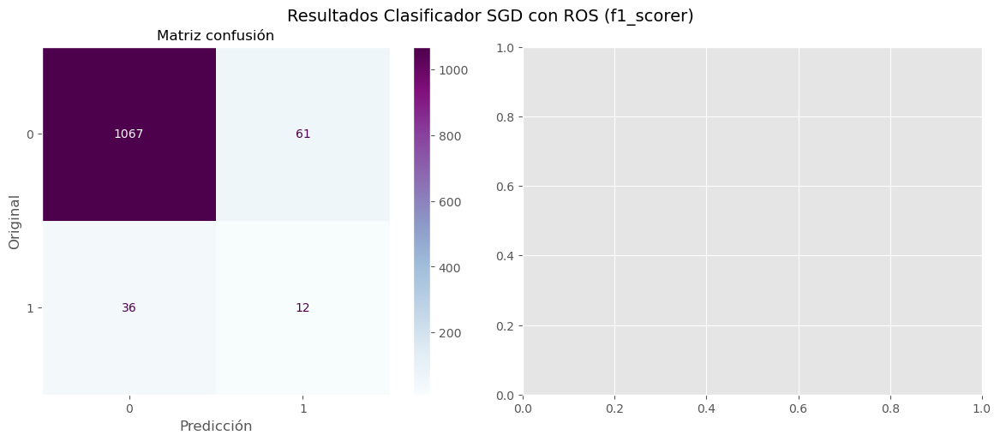

                     0          1  accuracy    macro avg  weighted avg
precision     0.967362   0.164384  0.917517     0.565873      0.934587
recall        0.945922   0.250000  0.917517     0.597961      0.917517
f1-score      0.956522   0.198347  0.917517     0.577434      0.925576
support    1128.000000  48.000000  0.917517  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.9175 || Clase 1: 0.2500 || Clase 0: 0.9459
Precisión total: 0.9346 || Clase 1: 0.1644 || Clase 0: 0.9674
F1 total: 0.9256 || Clase 1: 0.1983 || Clase 0: 0.9565
ROC AUC: 0.5980
El mejor meta-parámetro encontrado: {'ovs__sampling_strategy': 0.8, 'sgd__alpha': 0.0001, 'sgd__loss': 'squared_hinge', 'sgd__penalty': None}
El mejor score es: -0.048312131172064246


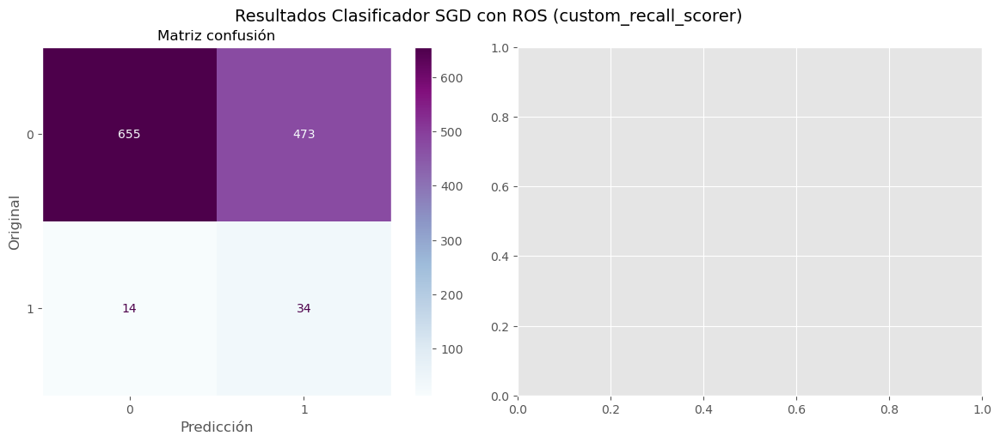

                     0          1  accuracy    macro avg  weighted avg
precision     0.979073   0.067061  0.585884     0.523067      0.941848
recall        0.580674   0.708333  0.585884     0.644504      0.585884
f1-score      0.728993   0.122523  0.585884     0.425758      0.704239
support    1128.000000  48.000000  0.585884  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.5859 || Clase 1: 0.7083 || Clase 0: 0.5807
Precisión total: 0.9418 || Clase 1: 0.0671 || Clase 0: 0.9791
F1 total: 0.7042 || Clase 1: 0.1225 || Clase 0: 0.7290
ROC AUC: 0.6445


In [70]:
metricas = [recall_scorer, f1_scorer, custom_recall_scorer]
nombres_metricas = ['recall_scorer', 'f1_scorer', 'custom_recall_scorer']
titulo = 'Clasificador SGD con ROS'

for metrica, nombre_metrica in zip(metricas, nombres_metricas):

    sgd_ovs = imbalanced_pipeline([('std', StandardScaler()),
                                    ('ovs', RandomOverSampler(random_state=SEED)),
                                    ('sgd', SGDClassifier(max_iter = 5000, random_state=SEED, early_stopping=True, class_weight='balanced'))
                                    ])

    # Se definen los meta-parámetros que se quieren optimizar con GridSearchCV.
    parameters = {
        'ovs__sampling_strategy': [0.1, 0.2, 0.5, 0.8, 1],
        'sgd__alpha': [0.0001, 0.001, 0.01, 0.1],
        'sgd__penalty': ['l2', 'l1', 'elasticnet', None],
        'sgd__loss': ['log_loss', 'modified_huber', 'squared_hinge'] #'hinge' se quita porque da mal recall
    }

    # Se aplica GridSearchCV para encontrar los mejores meta-parámetros
    grid_search_sgd_ovs = GridSearchCV(sgd_ovs, parameters, cv=5, n_jobs=-1, scoring=metrica) # recall_scorer, f1_scorer, custom_recall_scorer
    grid_search_sgd_ovs.fit(X_train, y_train)

    # Se muestran por pantalla los mejores meta-parámetros encontrados
    print(f"El mejor meta-parámetro encontrado: {grid_search_sgd_ovs.best_params_}")
    print(f"El mejor score es: {grid_search_sgd_ovs.best_score_}")

    evaluacion_clasificacion(grid_search_sgd_ovs,  titulo + ' (' + nombre_metrica + ')', X_val, y_val, proba=False, plot=True, show_print=True)

#### Con PCA

El mejor meta-parámetro encontrado: {'pca__n_components': 5, 'sgd__alpha': 0.01, 'sgd__loss': 'modified_huber', 'sgd__penalty': 'l1'}
El mejor score es: 0.7942105263157895


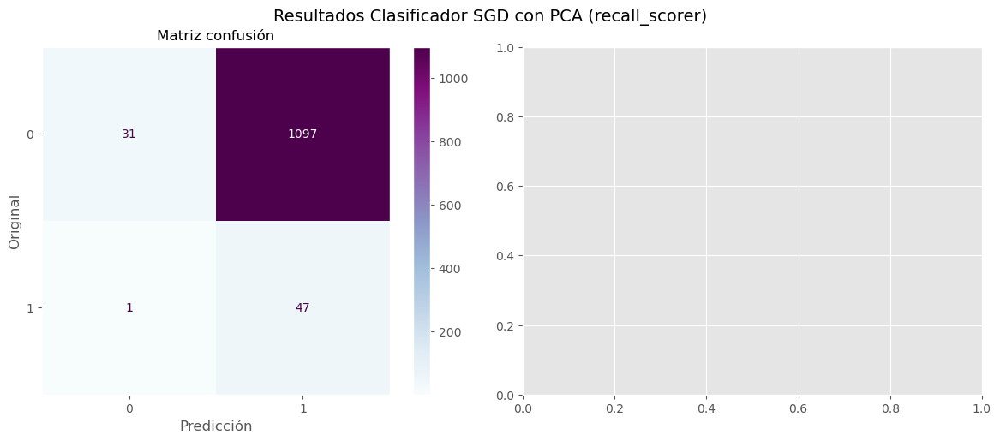

                     0          1  accuracy    macro avg  weighted avg
precision     0.968750   0.041084  0.066327     0.504917      0.930886
recall        0.027482   0.979167  0.066327     0.503324      0.066327
f1-score      0.053448   0.078859  0.066327     0.066154      0.054485
support    1128.000000  48.000000  0.066327  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.0663 || Clase 1: 0.9792 || Clase 0: 0.0275
Precisión total: 0.9309 || Clase 1: 0.0411 || Clase 0: 0.9688
F1 total: 0.0545 || Clase 1: 0.0789 || Clase 0: 0.0534
ROC AUC: 0.5033
El mejor meta-parámetro encontrado: {'pca__n_components': 15, 'sgd__alpha': 0.01, 'sgd__loss': 'log_loss', 'sgd__penalty': None}
El mejor score es: 0.1093912277296873


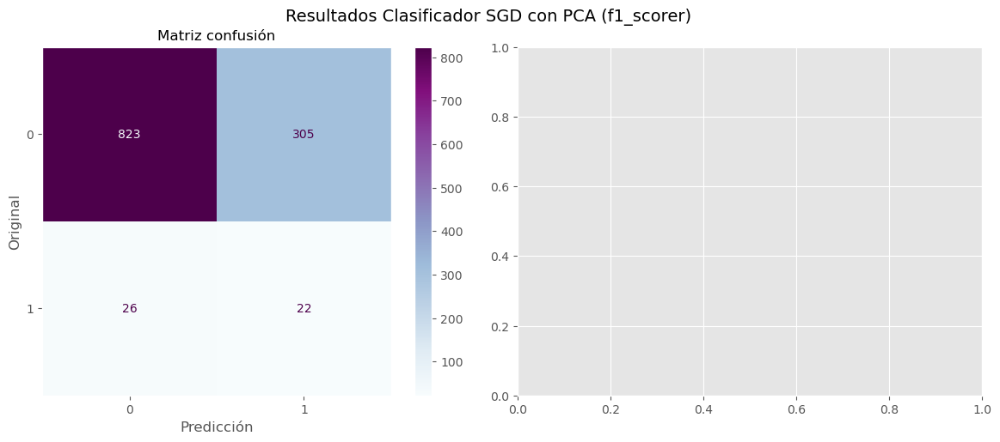

                     0          1  accuracy    macro avg  weighted avg
precision     0.969376   0.067278  0.718537     0.518327      0.932555
recall        0.729610   0.458333  0.718537     0.593972      0.718537
f1-score      0.832575   0.117333  0.718537     0.474954      0.803381
support    1128.000000  48.000000  0.718537  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.7185 || Clase 1: 0.4583 || Clase 0: 0.7296
Precisión total: 0.9326 || Clase 1: 0.0673 || Clase 0: 0.9694
F1 total: 0.8034 || Clase 1: 0.1173 || Clase 0: 0.8326
ROC AUC: 0.5940
El mejor meta-parámetro encontrado: {'pca__n_components': 15, 'sgd__alpha': 0.01, 'sgd__loss': 'log_loss', 'sgd__penalty': None}
El mejor score es: -0.049975905100271195


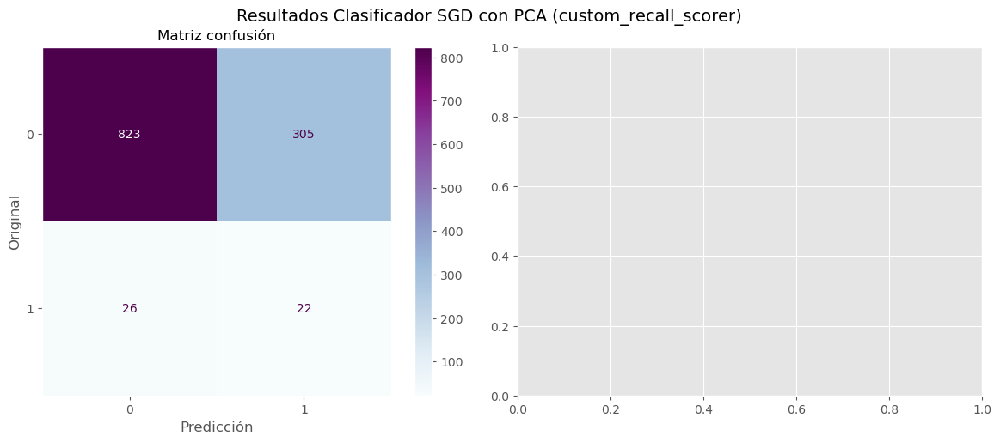

                     0          1  accuracy    macro avg  weighted avg
precision     0.969376   0.067278  0.718537     0.518327      0.932555
recall        0.729610   0.458333  0.718537     0.593972      0.718537
f1-score      0.832575   0.117333  0.718537     0.474954      0.803381
support    1128.000000  48.000000  0.718537  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.7185 || Clase 1: 0.4583 || Clase 0: 0.7296
Precisión total: 0.9326 || Clase 1: 0.0673 || Clase 0: 0.9694
F1 total: 0.8034 || Clase 1: 0.1173 || Clase 0: 0.8326
ROC AUC: 0.5940


In [71]:
metricas = [recall_scorer, f1_scorer, custom_recall_scorer]
nombres_metricas = ['recall_scorer', 'f1_scorer', 'custom_recall_scorer']
titulo = 'Clasificador SGD con PCA'

for metrica, nombre_metrica in zip(metricas, nombres_metricas):

    sgd_ovs = imbalanced_pipeline([('std', StandardScaler()),
                                    ('pca', PCA(random_state=SEED)),
                                    ('std2', StandardScaler()),
                                    ('sgd', SGDClassifier(max_iter = 5000, random_state=SEED, early_stopping=True, class_weight='balanced'))
                                    ])

    # Se definen los meta-parámetros que se quieren optimizar con GridSearchCV.
    parameters = {
        'pca__n_components': [5, 10, 15, 20, 30, 40, 56],
        'sgd__alpha': [0.0001, 0.001, 0.01, 0.1],
        'sgd__penalty': ['l2', 'l1', 'elasticnet', None],
        'sgd__loss': ['log_loss', 'modified_huber', 'squared_hinge'] #'hinge' se quita porque da mal recall
    }

    # Se aplica GridSearchCV para encontrar los mejores meta-parámetros
    grid_search_sgd_ovs = GridSearchCV(sgd_ovs, parameters, cv=5, n_jobs=-1, scoring=metrica) # recall_scorer, f1_scorer, custom_recall_scorer
    grid_search_sgd_ovs.fit(X_train, y_train)

    # Se muestran por pantalla los mejores meta-parámetros encontrados
    print(f"El mejor meta-parámetro encontrado: {grid_search_sgd_ovs.best_params_}")
    print(f"El mejor score es: {grid_search_sgd_ovs.best_score_}")

    evaluacion_clasificacion(grid_search_sgd_ovs,  titulo + ' (' + nombre_metrica + ')', X_val, y_val, proba=False, plot=True, show_print=True)

#### Básico

El mejor meta-parámetro encontrado: {'sgd__alpha': 0.001, 'sgd__loss': 'squared_hinge', 'sgd__penalty': 'l2'}
El mejor score es: 0.5436842105263158


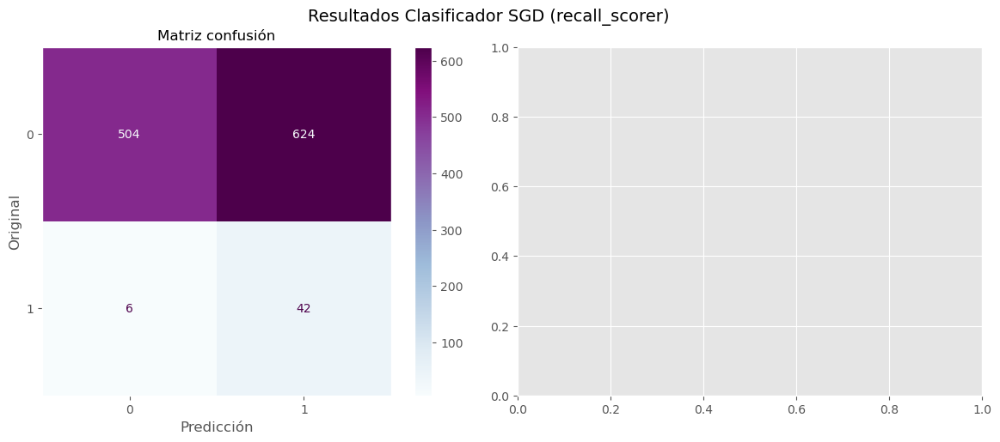

                     0          1  accuracy    macro avg  weighted avg
precision     0.988235   0.063063  0.464286     0.525649      0.950473
recall        0.446809   0.875000  0.464286     0.660904      0.464286
f1-score      0.615385   0.117647  0.464286     0.366516      0.595069
support    1128.000000  48.000000  0.464286  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.4643 || Clase 1: 0.8750 || Clase 0: 0.4468
Precisión total: 0.9505 || Clase 1: 0.0631 || Clase 0: 0.9882
F1 total: 0.5951 || Clase 1: 0.1176 || Clase 0: 0.6154
ROC AUC: 0.6609
El mejor meta-parámetro encontrado: {'sgd__alpha': 0.1, 'sgd__loss': 'log_loss', 'sgd__penalty': 'l1'}
El mejor score es: 0.13558505626941955


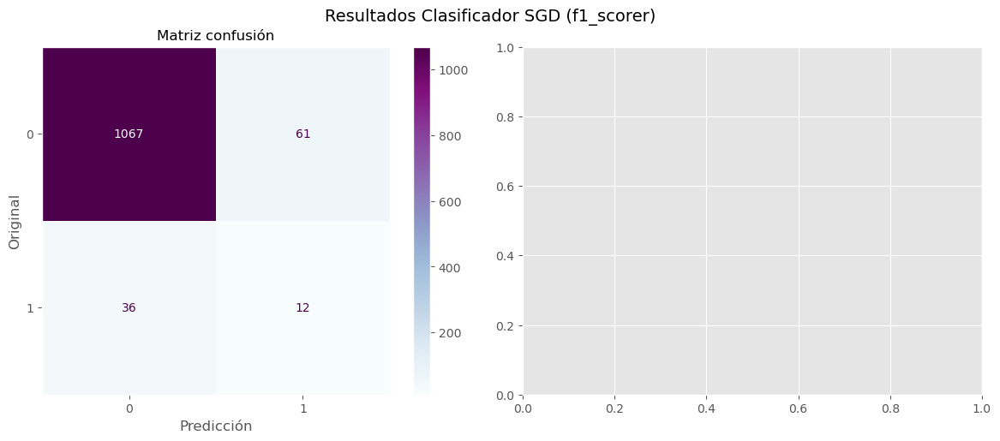

                     0          1  accuracy    macro avg  weighted avg
precision     0.967362   0.164384  0.917517     0.565873      0.934587
recall        0.945922   0.250000  0.917517     0.597961      0.917517
f1-score      0.956522   0.198347  0.917517     0.577434      0.925576
support    1128.000000  48.000000  0.917517  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.9175 || Clase 1: 0.2500 || Clase 0: 0.9459
Precisión total: 0.9346 || Clase 1: 0.1644 || Clase 0: 0.9674
F1 total: 0.9256 || Clase 1: 0.1983 || Clase 0: 0.9565
ROC AUC: 0.5980
El mejor meta-parámetro encontrado: {'sgd__alpha': 0.01, 'sgd__loss': 'log_loss', 'sgd__penalty': 'elasticnet'}
El mejor score es: -0.07127709712007664


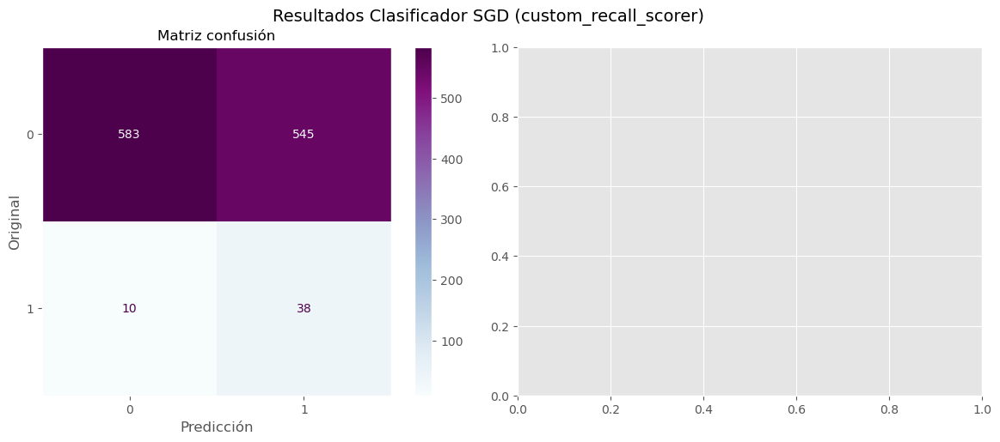

                     0          1  accuracy    macro avg  weighted avg
precision     0.983137   0.065180  0.528061     0.524158      0.945669
recall        0.516844   0.791667  0.528061     0.654255      0.528061
f1-score      0.677513   0.120444  0.528061     0.398978      0.654776
support    1128.000000  48.000000  0.528061  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.5281 || Clase 1: 0.7917 || Clase 0: 0.5168
Precisión total: 0.9457 || Clase 1: 0.0652 || Clase 0: 0.9831
F1 total: 0.6548 || Clase 1: 0.1204 || Clase 0: 0.6775
ROC AUC: 0.6543


In [72]:
metricas = [recall_scorer, f1_scorer, custom_recall_scorer]
nombres_metricas = ['recall_scorer', 'f1_scorer', 'custom_recall_scorer']
titulo = 'Clasificador SGD'

for metrica, nombre_metrica in zip(metricas, nombres_metricas):

    sgd_ovs = imbalanced_pipeline([('std', StandardScaler()),
                                    ('sgd', SGDClassifier(max_iter = 5000, random_state=SEED, early_stopping=True, class_weight='balanced'))
                                    ])

    # Se definen los meta-parámetros que se quieren optimizar con GridSearchCV.
    parameters = {
        'sgd__alpha': [0.0001, 0.001, 0.01, 0.1],
        'sgd__penalty': ['l2', 'l1', 'elasticnet', None],
        'sgd__loss': ['log_loss', 'modified_huber', 'squared_hinge'] #'hinge' se quita porque da mal recall
    }

    # Se aplica GridSearchCV para encontrar los mejores meta-parámetros
    grid_search_sgd_ovs = GridSearchCV(sgd_ovs, parameters, cv=5, n_jobs=-1, scoring=metrica) # recall_scorer, f1_scorer, custom_recall_scorer
    grid_search_sgd_ovs.fit(X_train, y_train)

    # Se muestran por pantalla los mejores meta-parámetros encontrados
    print(f"El mejor meta-parámetro encontrado: {grid_search_sgd_ovs.best_params_}")
    print(f"El mejor score es: {grid_search_sgd_ovs.best_score_}")

    evaluacion_clasificacion(grid_search_sgd_ovs,  titulo + ' (' + nombre_metrica + ')', X_val, y_val, proba=False, plot=True, show_print=True)

El SGD Classifier es un modelo también lineal que iguala el recall del Ridge Classifier, pero no supera el modelo de árbol. Los mejores meta-parámetros son un término de regularización bajo, tal y como sucería en el RidgeClassifier, y una función de coste de tipo modified_huber, que tiene una función de pérdida suave que da tolerancia a outliers. La técnica de regularización (penalty) con mejores resultados es la l1, lo que puede añade dispersión en el modelo.

### 5. SVM

Se va a pasar a un modelo de clasificación de máquina de vectores de soporte (SVM). Este modelo busca el hiperplano que maximiza la separación entre dos clases. Es una técnica útil por su robustez al ruido que se suele utilizar para el reconocimiento de dígitos escritos a mano, el reconocimiento de expresiones faciales y la clasificación de texto. Mediante la librería de SVM de sklearn se puede configurar mejor el objeto SVC (support vector classifier) que en el SGDClassifier.

In [225]:
# Se separan las variables de entrada y la target
target = df_accidentes["gravedad"]
variables = df_accidentes.drop(["gravedad","lesividad"], axis=1, inplace=False)

# Proporción de división entre conjuntos de train y test
train_ratio = 0.7  # 70% para train, 30% para test

X_train, X_val, y_train, y_val = train_test_split(variables, target, train_size=train_ratio, shuffle=False, random_state=SEED)

# Examinamos la forma de los conjuntos de datos
X_train.shape, X_val.shape, y_train.shape, y_val.shape

((2744, 59), (1176, 59), (2744,), (1176,))

#### Con oversampling y PCA

In [76]:
metricas = [recall_scorer, f1_scorer, custom_recall_scorer]
nombres_metricas = ['recall_scorer', 'f1_scorer', 'custom_recall_scorer']
titulo = 'SVC con ROS y PCA'

for metrica, nombre_metrica in zip(metricas, nombres_metricas):

    svm_ovs = imbalanced_pipeline([('std', StandardScaler()),
                                    ('ovs', RandomOverSampler(random_state=SEED)),
                                    ('pca', PCA(random_state=SEED)),
                                    ('std2', StandardScaler()),
                                    ('svm', SVC(max_iter = 10000, random_state=SEED, probability=True, class_weight='balanced'))
                                    ])

    # Se definen los meta-parámetros que se quieren optimizar con GridSearchCV.
    parameters = [
        {'ovs__sampling_strategy': [0.1, 0.2, 0.5, 0.8, 1], 'pca__n_components': [5, 10, 15, 20, 30, 40, 56], 'svm__C': [0.01, 0.1, 1, 10, 100], 'svm__kernel': ['linear']},
        {'ovs__sampling_strategy': [0.1, 0.2, 0.5, 0.8, 1], 'pca__n_components': [5, 10, 15, 20, 30, 40, 56], 'svm__C': [0.01, 0.1, 1, 10, 100], 'svm__gamma': ['scale', 0.001, 0.01, 0.1, 1], 'svm__kernel': ['rbf']},
        {'ovs__sampling_strategy': [0.1, 0.2, 0.5, 0.8, 1], 'pca__n_components': [5, 10, 15, 20, 30, 40, 56], 'svm__C': [0.01, 0.1, 1, 10, 100], 'svm__gamma': ['scale', 0.001, 0.01, 0.1, 1], 'svm__kernel': ['sigmoid']},
        {'ovs__sampling_strategy': [0.1, 0.2, 0.5, 0.8, 1], 'pca__n_components': [5, 10, 15, 20, 30, 40, 56], 'svm__C': [0.01, 0.1, 1, 10, 100], 'svm__gamma': ['scale', 0.001, 0.01, 0.1, 1], 'svm__degree': [2, 3, 4, 5], 'svm__kernel': ['poly']}
    ]

    # Se aplica GridSearchCV para encontrar los mejores meta-parámetros
    grid_search_svm_ovs = GridSearchCV(svm_ovs, parameters, cv=5, n_jobs=-1, scoring=metrica) # recall_scorer, f1_scorer, custom_recall_scorer
    grid_search_svm_ovs.fit(X_train, y_train)

    # Se muestran por pantalla los mejores meta-parámetros encontrados
    print(f"El mejor meta-parámetro encontrado: {grid_search_svm_ovs.best_params_}")
    print(f"El mejor score es: {grid_search_svm_ovs.best_score_}")

    evaluacion_clasificacion(grid_search_svm_ovs,  titulo + ' (' + nombre_metrica + ')', X_val, y_val, proba=False, plot=True, show_print=True)

KeyboardInterrupt: 

#### Con oversampling

In [ ]:
metricas = [recall_scorer, f1_scorer, custom_recall_scorer]
nombres_metricas = ['recall_scorer', 'f1_scorer', 'custom_recall_scorer']
titulo = 'SVC con RUS'

for metrica, nombre_metrica in zip(metricas, nombres_metricas):

    svm_ovs = imbalanced_pipeline([('std', StandardScaler()),
                                    ('ovs', RandomOverSampler(random_state=SEED)),
                                    ('svm', SVC(max_iter = 10000, random_state=SEED, probability=True, class_weight='balanced'))
                                    ])

    # Se definen los meta-parámetros que se quieren optimizar con GridSearchCV.
    parameters = [
        {'ovs__sampling_strategy': [0.1, 0.2, 0.5, 0.8, 1], 'svm__C': [0.01, 0.1, 1, 10, 100], 'svm__kernel': ['linear']},
        {'ovs__sampling_strategy': [0.1, 0.2, 0.5, 0.8, 1], 'svm__C': [0.01, 0.1, 1, 10, 100], 'svm__gamma': ['scale', 0.001, 0.01, 0.1, 1], 'svm__kernel': ['rbf']},
        {'ovs__sampling_strategy': [0.1, 0.2, 0.5, 0.8, 1], 'svm__C': [0.01, 0.1, 1, 10, 100], 'svm__gamma': ['scale', 0.001, 0.01, 0.1, 1], 'svm__kernel': ['sigmoid']},
        {'ovs__sampling_strategy': [0.1, 0.2, 0.5, 0.8, 1], 'svm__C': [0.01, 0.1, 1, 10, 100], 'svm__gamma': ['scale', 0.001, 0.01, 0.1, 1], 'svm__degree': [2, 3, 4, 5], 'svm__kernel': ['poly']}
    ]

    # Se aplica GridSearchCV para encontrar los mejores meta-parámetros
    grid_search_svm_ovs = GridSearchCV(svm_ovs, parameters, cv=5, n_jobs=-1, scoring=metrica) # recall_scorer, f1_scorer, custom_recall_scorer
    grid_search_svm_ovs.fit(X_train, y_train)

    # Se muestran por pantalla los mejores meta-parámetros encontrados
    print(f"El mejor meta-parámetro encontrado: {grid_search_svm_ovs.best_params_}")
    print(f"El mejor score es: {grid_search_svm_ovs.best_score_}")

    evaluacion_clasificacion(grid_search_svm_ovs,  titulo + ' (' + nombre_metrica + ')', X_val, y_val, proba=False, plot=True, show_print=True)

#### Con PCA

In [ ]:
metricas = [recall_scorer, f1_scorer, custom_recall_scorer]
nombres_metricas = ['recall_scorer', 'f1_scorer', 'custom_recall_scorer']
titulo = 'SVC con PCA'

for metrica, nombre_metrica in zip(metricas, nombres_metricas):

    svm_ovs = imbalanced_pipeline([('std', StandardScaler()),
                                    ('pca', PCA(random_state=SEED)),
                                    ('std2', StandardScaler()),
                                    ('svm', SVC(max_iter = 10000, random_state=SEED, probability=True, class_weight='balanced'))
                                    ])

    # Se definen los meta-parámetros que se quieren optimizar con GridSearchCV.
    parameters = [
        {'pca__n_components': [5, 10, 15, 20, 30, 40, 56], 'svm__C': [0.01, 0.1, 1, 10, 100], 'svm__kernel': ['linear']},
        {'pca__n_components': [5, 10, 15, 20, 30, 40, 56], 'svm__C': [0.01, 0.1, 1, 10, 100], 'svm__gamma': ['scale', 0.001, 0.01, 0.1, 1], 'svm__kernel': ['rbf']},
        {'pca__n_components': [5, 10, 15, 20, 30, 40, 56], 'svm__C': [0.01, 0.1, 1, 10, 100], 'svm__gamma': ['scale', 0.001, 0.01, 0.1, 1], 'svm__kernel': ['sigmoid']},
        {'pca__n_components': [5, 10, 15, 20, 30, 40, 56], 'svm__C': [0.01, 0.1, 1, 10, 100], 'svm__gamma': ['scale', 0.001, 0.01, 0.1, 1], 'svm__degree': [2, 3, 4, 5], 'svm__kernel': ['poly']}
    ]

    # Se aplica GridSearchCV para encontrar los mejores meta-parámetros
    grid_search_svm_ovs = GridSearchCV(svm_ovs, parameters, cv=5, n_jobs=-1, scoring=metrica) # recall_scorer, f1_scorer, custom_recall_scorer
    grid_search_svm_ovs.fit(X_train, y_train)

    # Se muestran por pantalla los mejores meta-parámetros encontrados
    print(f"El mejor meta-parámetro encontrado: {grid_search_svm_ovs.best_params_}")
    print(f"El mejor score es: {grid_search_svm_ovs.best_score_}")

    evaluacion_clasificacion(grid_search_svm_ovs,  titulo + ' (' + nombre_metrica + ')', X_val, y_val, proba=False, plot=True, show_print=True)

#### Básico

In [ ]:
metricas = [recall_scorer, f1_scorer, custom_recall_scorer]
nombres_metricas = ['recall_scorer', 'f1_scorer', 'custom_recall_scorer']
titulo = 'SVC'

for metrica, nombre_metrica in zip(metricas, nombres_metricas):

    svm_ovs = imbalanced_pipeline([('std', StandardScaler()),
                                    ('svm', SVC(max_iter = 10000, random_state=SEED, probability=True, class_weight='balanced'))
                                    ])

    # Se definen los meta-parámetros que se quieren optimizar con GridSearchCV.
    parameters = [
        {'svm__C': [0.01, 0.1, 1, 10, 100], 'svm__kernel': ['linear']},
        {'svm__C': [0.01, 0.1, 1, 10, 100], 'svm__gamma': ['scale', 0.001, 0.01, 0.1, 1], 'svm__kernel': ['rbf']},
        {'svm__C': [0.01, 0.1, 1, 10, 100], 'svm__gamma': ['scale', 0.001, 0.01, 0.1, 1], 'svm__kernel': ['sigmoid']},
        {'svm__C': [0.01, 0.1, 1, 10, 100], 'svm__gamma': ['scale', 0.001, 0.01, 0.1, 1], 'svm__degree': [2, 3, 4, 5], 'svm__kernel': ['poly']}
    ]

    # Se aplica GridSearchCV para encontrar los mejores meta-parámetros
    grid_search_svm_ovs = GridSearchCV(svm_ovs, parameters, cv=5, n_jobs=-1, scoring=metrica) # recall_scorer, f1_scorer, custom_recall_scorer
    grid_search_svm_ovs.fit(X_train, y_train)

    # Se muestran por pantalla los mejores meta-parámetros encontrados
    print(f"El mejor meta-parámetro encontrado: {grid_search_svm_ovs.best_params_}")
    print(f"El mejor score es: {grid_search_svm_ovs.best_score_}")

    evaluacion_clasificacion(grid_search_svm_ovs,  titulo + ' (' + nombre_metrica + ')', X_val, y_val, proba=False, plot=True, show_print=True)

El modelo SVC con un kernel lineal es la configuración de SVC que presenta los mejores resultados de los 4 escenarios estudiados. No obstante, no logra predecir ningún valor de la target = 1. 
Posiblemente esto se deba a que no es posible definir una buena frontera que separe las dos clases del problema de clasificación.

Se va a seguir probando, ahora con un modelo probabilístico de Naive Bayes.

### 6. Naive Bayes

In [227]:
# Se separan las variables de entrada y la target
target = df_accidentes["gravedad"]
variables = df_accidentes.drop(["gravedad","lesividad"], axis=1, inplace=False)

# Proporción de división entre conjuntos de train y test
train_ratio = 0.7  # 70% para train, 30% para test

X_train, X_val, y_train, y_val = train_test_split(variables, target, train_size=train_ratio, shuffle=False, random_state=SEED)

# Examinamos la forma de los conjuntos de datos
X_train.shape, X_val.shape, y_train.shape, y_val.shape

((2744, 59), (1176, 59), (2744,), (1176,))

#### Con oversampling y PCA

El mejor meta-parámetro encontrado: {'ovs__sampling_strategy': 1, 'pca__n_components': 56}
El mejor score es: 0.741578947368421


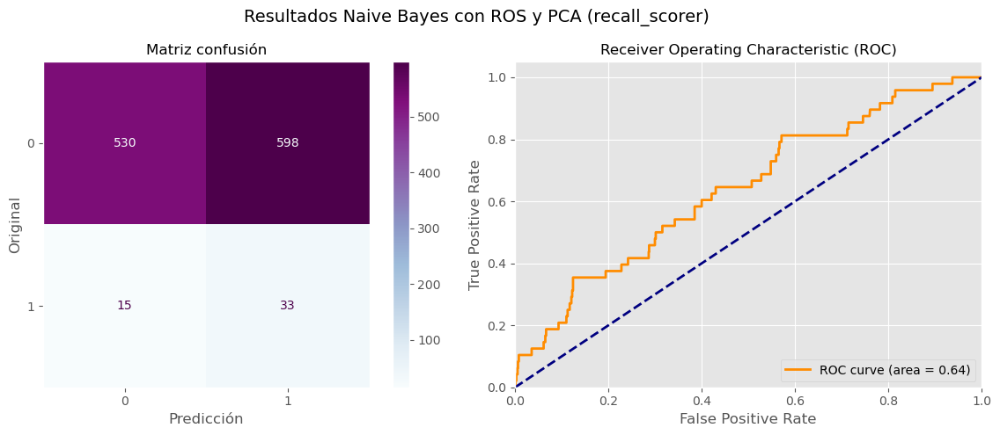

                     0          1  accuracy    macro avg  weighted avg
precision     0.972477   0.052298  0.478741     0.512388      0.934919
recall        0.469858   0.687500  0.478741     0.578679      0.478741
f1-score      0.633592   0.097202  0.478741     0.365397      0.611699
support    1128.000000  48.000000  0.478741  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.4787 || Clase 1: 0.6875 || Clase 0: 0.4699
Precisión total: 0.9349 || Clase 1: 0.0523 || Clase 0: 0.9725
F1 total: 0.6117 || Clase 1: 0.0972 || Clase 0: 0.6336
ROC AUC: 0.5787
El mejor meta-parámetro encontrado: {'ovs__sampling_strategy': 0.2, 'pca__n_components': 40}
El mejor score es: 0.10309636988882272


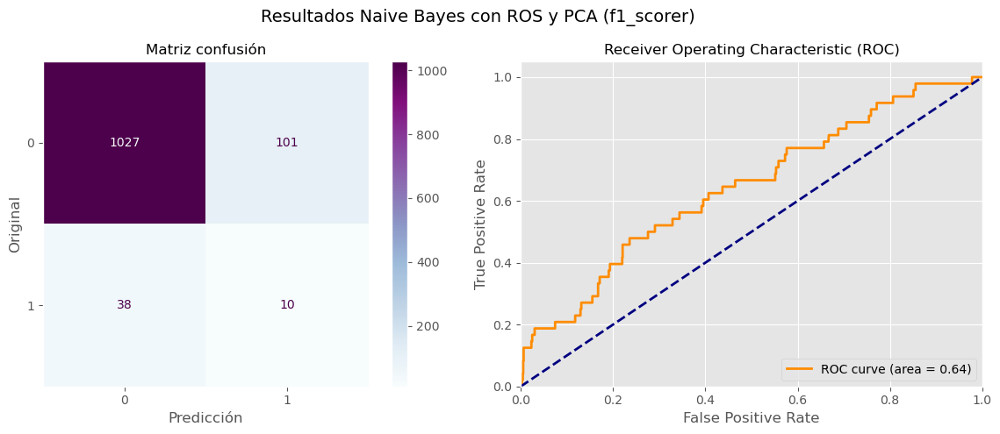

                     0          1  accuracy    macro avg  weighted avg
precision     0.964319   0.090090  0.881803     0.527205      0.928636
recall        0.910461   0.208333  0.881803     0.559397      0.881803
f1-score      0.936617   0.125786  0.881803     0.531201      0.903521
support    1128.000000  48.000000  0.881803  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.8818 || Clase 1: 0.2083 || Clase 0: 0.9105
Precisión total: 0.9286 || Clase 1: 0.0901 || Clase 0: 0.9643
F1 total: 0.9035 || Clase 1: 0.1258 || Clase 0: 0.9366
ROC AUC: 0.5594
El mejor meta-parámetro encontrado: {'ovs__sampling_strategy': 0.5, 'pca__n_components': 40}
El mejor score es: -0.08121529205000692


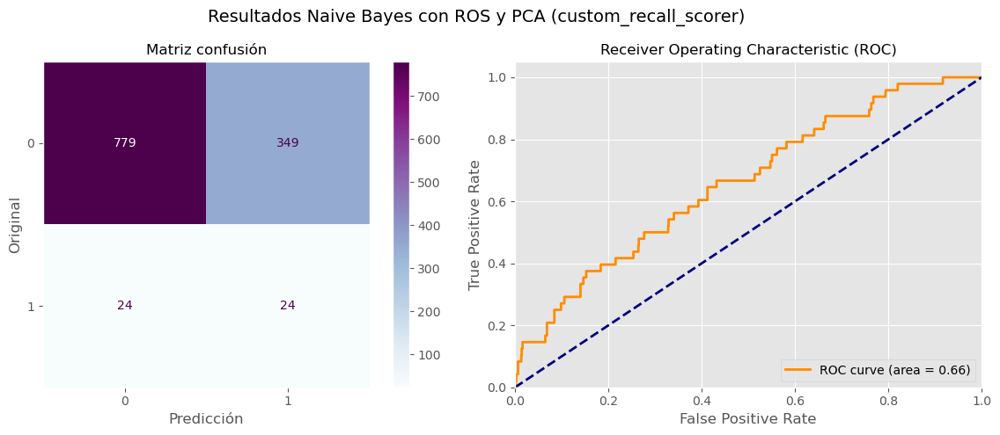

                     0          1  accuracy    macro avg  weighted avg
precision     0.970112   0.064343  0.682823     0.517228      0.933142
recall        0.690603   0.500000  0.682823     0.595301      0.682823
f1-score      0.806836   0.114014  0.682823     0.460425      0.778557
support    1128.000000  48.000000  0.682823  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.6828 || Clase 1: 0.5000 || Clase 0: 0.6906
Precisión total: 0.9331 || Clase 1: 0.0643 || Clase 0: 0.9701
F1 total: 0.7786 || Clase 1: 0.1140 || Clase 0: 0.8068
ROC AUC: 0.5953


In [237]:
metricas = [recall_scorer, f1_scorer, custom_recall_scorer]
nombres_metricas = ['recall_scorer', 'f1_scorer', 'custom_recall_scorer']
titulo = 'Naive Bayes con ROS y PCA'

for metrica, nombre_metrica in zip(metricas, nombres_metricas):

    gnb_ovs = imbalanced_pipeline([
                                    ('ovs', RandomOverSampler(random_state=SEED)),
                                    ('pca', PCA(random_state=SEED)),
                                    ('GNB', GaussianNB())
                                    ])

    # Se definen los meta-parámetros que se quieren optimizar con GridSearchCV.
    parameters = {
        'ovs__sampling_strategy': [0.1, 0.2, 0.5, 0.8, 1],
        'pca__n_components': [5, 10, 15, 20, 30, 40, 56],
    }

    # Se aplica GridSearchCV para encontrar los mejores meta-parámetros
    grid_search_gnb_ovs = GridSearchCV(gnb_ovs, parameters, cv=5, n_jobs=-1, scoring=metrica) # recall_scorer, f1_scorer, custom_recall_scorer
    grid_search_gnb_ovs.fit(X_train, y_train)

    # Se muestran por pantalla los mejores meta-parámetros encontrados
    print(f"El mejor meta-parámetro encontrado: {grid_search_gnb_ovs.best_params_}")
    print(f"El mejor score es: {grid_search_gnb_ovs.best_score_}")

    resultado = pd.DataFrame(evaluacion_clasificacion(grid_search_gnb_ovs,  titulo + ' (' + nombre_metrica + ')', X_val, y_val, plot=True, show_print=True))
    resultado['modelo'] = titulo + ' (' + nombre_metrica + ')'
    resultados_rl_list.append(resultado)

#### Con oversampling

El mejor meta-parámetro encontrado: {'ovs__sampling_strategy': 0.8}
El mejor score es: 0.6773684210526316


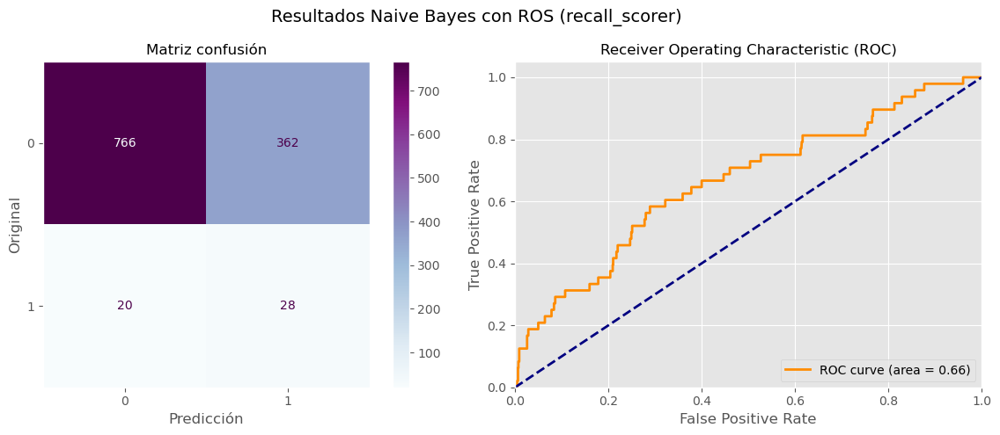

                     0          1  accuracy    macro avg  weighted avg
precision     0.974555   0.071795   0.67517     0.523175      0.937707
recall        0.679078   0.583333   0.67517     0.631206      0.675170
f1-score      0.800418   0.127854   0.67517     0.464136      0.772966
support    1128.000000  48.000000   0.67517  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.6752 || Clase 1: 0.5833 || Clase 0: 0.6791
Precisión total: 0.9377 || Clase 1: 0.0718 || Clase 0: 0.9746
F1 total: 0.7730 || Clase 1: 0.1279 || Clase 0: 0.8004
ROC AUC: 0.6312
El mejor meta-parámetro encontrado: {'ovs__sampling_strategy': 0.1}
El mejor score es: 0.09756763659400283


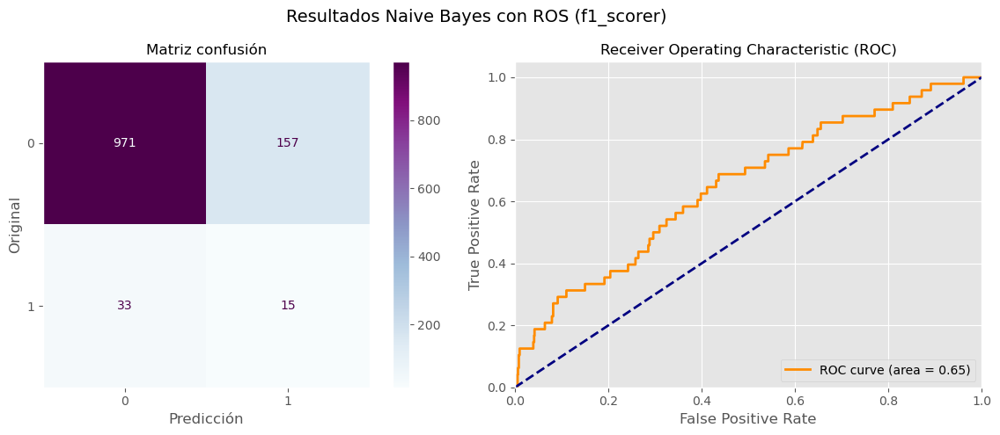

                     0          1  accuracy    macro avg  weighted avg
precision     0.967131   0.087209  0.838435     0.527170      0.931216
recall        0.860816   0.312500  0.838435     0.586658      0.838435
f1-score      0.910882   0.136364  0.838435     0.523623      0.879269
support    1128.000000  48.000000  0.838435  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.8384 || Clase 1: 0.3125 || Clase 0: 0.8608
Precisión total: 0.9312 || Clase 1: 0.0872 || Clase 0: 0.9671
F1 total: 0.8793 || Clase 1: 0.1364 || Clase 0: 0.9109
ROC AUC: 0.5867
El mejor meta-parámetro encontrado: {'ovs__sampling_strategy': 0.8}
El mejor score es: -0.09288702162945113


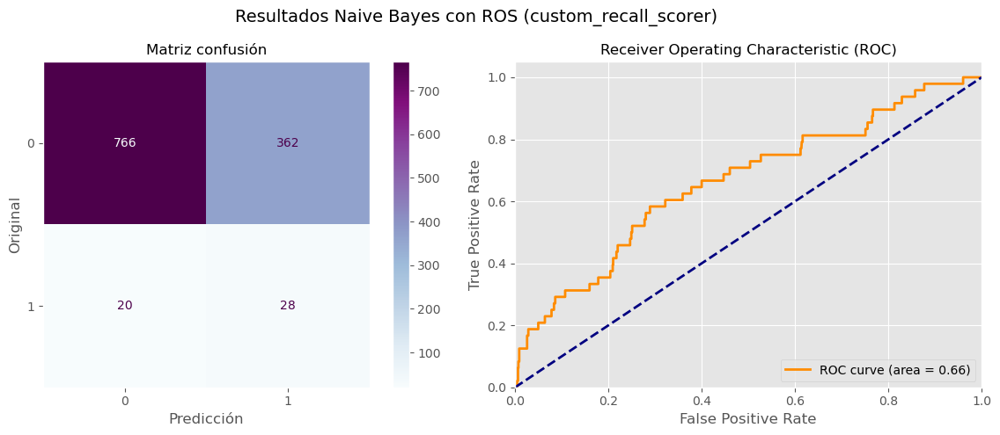

                     0          1  accuracy    macro avg  weighted avg
precision     0.974555   0.071795   0.67517     0.523175      0.937707
recall        0.679078   0.583333   0.67517     0.631206      0.675170
f1-score      0.800418   0.127854   0.67517     0.464136      0.772966
support    1128.000000  48.000000   0.67517  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.6752 || Clase 1: 0.5833 || Clase 0: 0.6791
Precisión total: 0.9377 || Clase 1: 0.0718 || Clase 0: 0.9746
F1 total: 0.7730 || Clase 1: 0.1279 || Clase 0: 0.8004
ROC AUC: 0.6312


In [238]:
metricas = [recall_scorer, f1_scorer, custom_recall_scorer]
nombres_metricas = ['recall_scorer', 'f1_scorer', 'custom_recall_scorer']
titulo = 'Naive Bayes con ROS'

for metrica, nombre_metrica in zip(metricas, nombres_metricas):

    gnb_ovs = imbalanced_pipeline([
                                    ('ovs', RandomOverSampler(random_state=SEED)),
                                    ('GNB', GaussianNB())
                                    ])

    # Se definen los meta-parámetros que se quieren optimizar con GridSearchCV.
    parameters = {
        'ovs__sampling_strategy': [0.1, 0.2, 0.5, 0.8, 1]
            }

    # Se aplica GridSearchCV para encontrar los mejores meta-parámetros
    grid_search_gnb_ovs = GridSearchCV(gnb_ovs, parameters, cv=5, n_jobs=-1, scoring=metrica) # recall_scorer, f1_scorer, custom_recall_scorer
    grid_search_gnb_ovs.fit(X_train, y_train)

    # Se muestran por pantalla los mejores meta-parámetros encontrados
    print(f"El mejor meta-parámetro encontrado: {grid_search_gnb_ovs.best_params_}")
    print(f"El mejor score es: {grid_search_gnb_ovs.best_score_}")

    resultado = pd.DataFrame(evaluacion_clasificacion(grid_search_gnb_ovs,  titulo + ' (' + nombre_metrica + ')', X_val, y_val, plot=True, show_print=True))
    resultado['modelo'] = titulo + ' (' + nombre_metrica + ')'
    resultados_rl_list.append(resultado)

#### Con PCA

El mejor meta-parámetro encontrado: {'GNB__var_smoothing': 1e-10, 'pca__n_components': 56}
El mejor score es: 0.2973684210526316


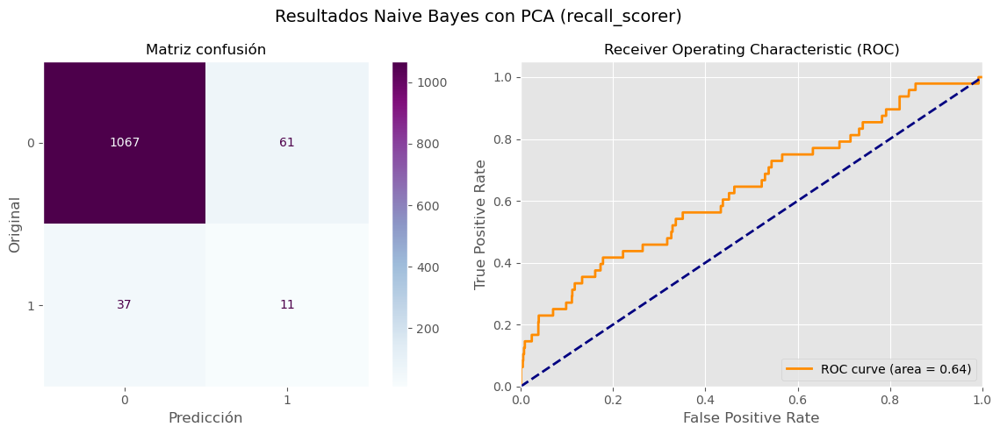

                     0          1  accuracy    macro avg  weighted avg
precision     0.966486   0.152778  0.916667     0.559632      0.933273
recall        0.945922   0.229167  0.916667     0.587544      0.916667
f1-score      0.956093   0.183333  0.916667     0.569713      0.924552
support    1128.000000  48.000000  0.916667  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.9167 || Clase 1: 0.2292 || Clase 0: 0.9459
Precisión total: 0.9333 || Clase 1: 0.1528 || Clase 0: 0.9665
F1 total: 0.9246 || Clase 1: 0.1833 || Clase 0: 0.9561
ROC AUC: 0.5875
El mejor meta-parámetro encontrado: {'GNB__var_smoothing': 1e-10, 'pca__n_components': 56}
El mejor score es: 0.14388819826538973


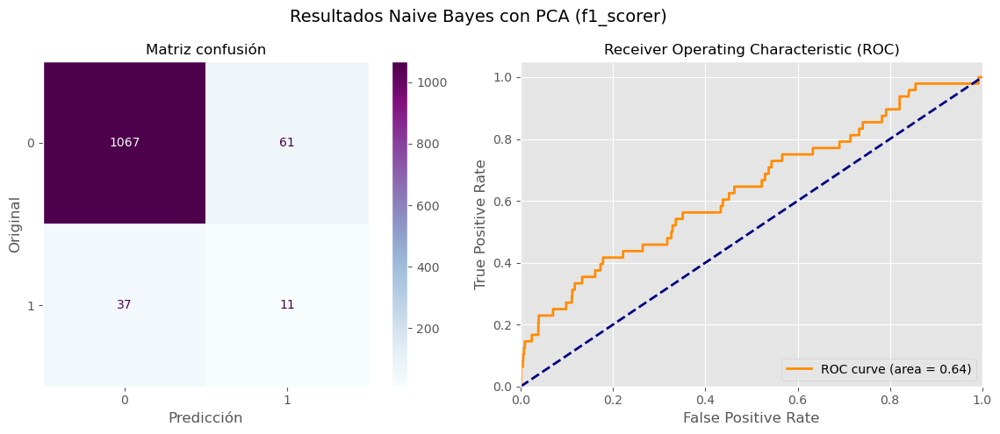

                     0          1  accuracy    macro avg  weighted avg
precision     0.966486   0.152778  0.916667     0.559632      0.933273
recall        0.945922   0.229167  0.916667     0.587544      0.916667
f1-score      0.956093   0.183333  0.916667     0.569713      0.924552
support    1128.000000  48.000000  0.916667  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.9167 || Clase 1: 0.2292 || Clase 0: 0.9459
Precisión total: 0.9333 || Clase 1: 0.1528 || Clase 0: 0.9665
F1 total: 0.9246 || Clase 1: 0.1833 || Clase 0: 0.9561
ROC AUC: 0.5875
El mejor meta-parámetro encontrado: {'GNB__var_smoothing': 1e-10, 'pca__n_components': 56}
El mejor score es: -0.24370205303072537


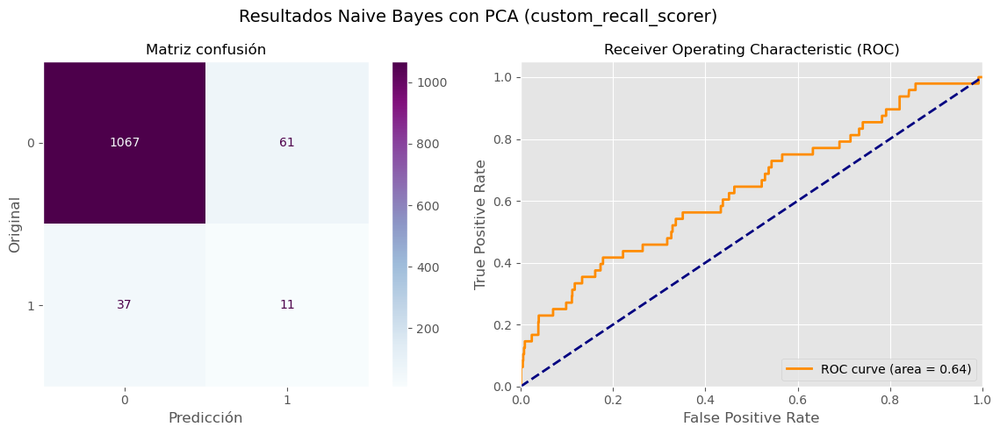

                     0          1  accuracy    macro avg  weighted avg
precision     0.966486   0.152778  0.916667     0.559632      0.933273
recall        0.945922   0.229167  0.916667     0.587544      0.916667
f1-score      0.956093   0.183333  0.916667     0.569713      0.924552
support    1128.000000  48.000000  0.916667  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.9167 || Clase 1: 0.2292 || Clase 0: 0.9459
Precisión total: 0.9333 || Clase 1: 0.1528 || Clase 0: 0.9665
F1 total: 0.9246 || Clase 1: 0.1833 || Clase 0: 0.9561
ROC AUC: 0.5875


In [239]:
metricas = [recall_scorer, f1_scorer, custom_recall_scorer]
nombres_metricas = ['recall_scorer', 'f1_scorer', 'custom_recall_scorer']
titulo = 'Naive Bayes con PCA'

for metrica, nombre_metrica in zip(metricas, nombres_metricas):

    gnb_ovs = imbalanced_pipeline([
                                    ('std', StandardScaler()),
                                    ('pca', PCA(random_state=SEED)),
                                    ('GNB', GaussianNB())
                                    ])

    # Se definen los meta-parámetros que se quieren optimizar con GridSearchCV.
    parameters = {
        'pca__n_components': [5, 10, 15, 20, 30, 40, 56],
        'GNB__var_smoothing': [10**-10,10**-9,10**-8,10**-7,1]
    }

    # Se aplica GridSearchCV para encontrar los mejores meta-parámetros
    grid_search_gnb_ovs = GridSearchCV(gnb_ovs, parameters, cv=5, n_jobs=-1, scoring=metrica) # recall_scorer, f1_scorer, custom_recall_scorer
    grid_search_gnb_ovs.fit(X_train, y_train)

    # Se muestran por pantalla los mejores meta-parámetros encontrados
    print(f"El mejor meta-parámetro encontrado: {grid_search_gnb_ovs.best_params_}")
    print(f"El mejor score es: {grid_search_gnb_ovs.best_score_}")

    resultado = pd.DataFrame(evaluacion_clasificacion(grid_search_gnb_ovs,  titulo + ' (' + nombre_metrica + ')', X_val, y_val, plot=True, show_print=True))
    resultado['modelo'] = titulo + ' (' + nombre_metrica + ')'
    resultados_rl_list.append(resultado)

#### Básico

El mejor meta-parámetro encontrado: {'GNB__var_smoothing': 1e-10}
El mejor score es: 0.6784210526315789


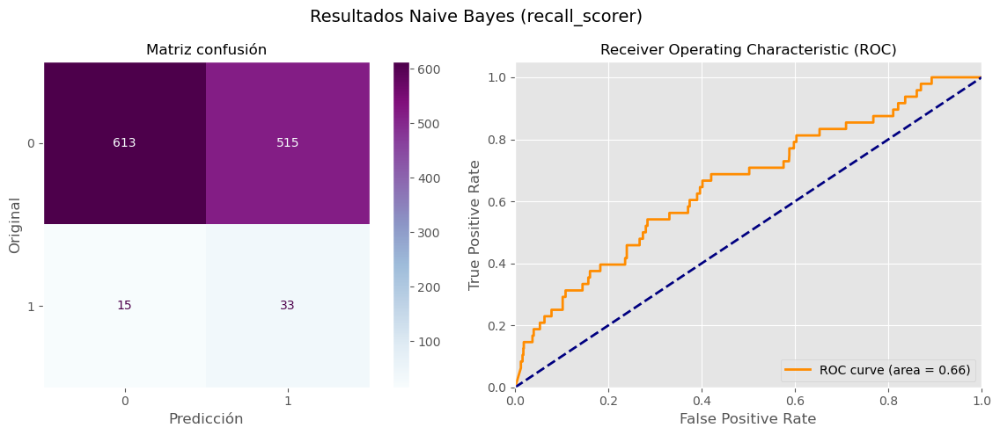

                     0          1  accuracy    macro avg  weighted avg
precision     0.976115   0.060219   0.54932     0.518167      0.938731
recall        0.543440   0.687500   0.54932     0.615470      0.549320
f1-score      0.698178   0.110738   0.54932     0.404458      0.674201
support    1128.000000  48.000000   0.54932  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.5493 || Clase 1: 0.6875 || Clase 0: 0.5434
Precisión total: 0.9387 || Clase 1: 0.0602 || Clase 0: 0.9761
F1 total: 0.6742 || Clase 1: 0.1107 || Clase 0: 0.6982
ROC AUC: 0.6155
El mejor meta-parámetro encontrado: {'GNB__var_smoothing': 1e-09}
El mejor score es: 0.09585737785574272


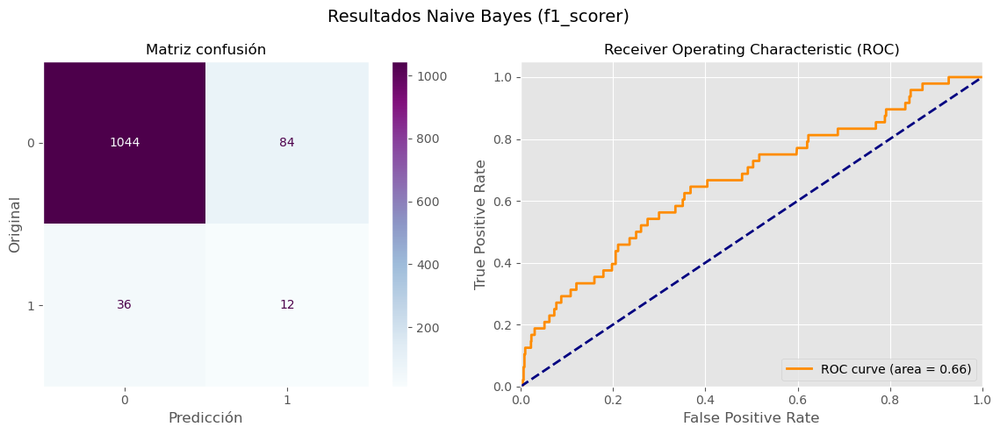

                     0          1  accuracy    macro avg  weighted avg
precision     0.966667   0.125000  0.897959     0.545833      0.932313
recall        0.925532   0.250000  0.897959     0.587766      0.897959
f1-score      0.945652   0.166667  0.897959     0.556159      0.913857
support    1128.000000  48.000000  0.897959  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.8980 || Clase 1: 0.2500 || Clase 0: 0.9255
Precisión total: 0.9323 || Clase 1: 0.1250 || Clase 0: 0.9667
F1 total: 0.9139 || Clase 1: 0.1667 || Clase 0: 0.9457
ROC AUC: 0.5878
El mejor meta-parámetro encontrado: {'GNB__var_smoothing': 1e-10}
El mejor score es: -0.11469072185240728


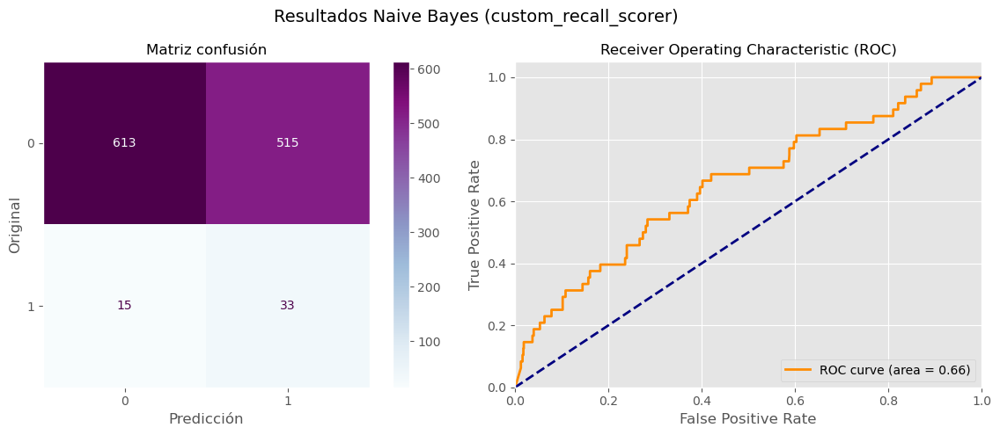

                     0          1  accuracy    macro avg  weighted avg
precision     0.976115   0.060219   0.54932     0.518167      0.938731
recall        0.543440   0.687500   0.54932     0.615470      0.549320
f1-score      0.698178   0.110738   0.54932     0.404458      0.674201
support    1128.000000  48.000000   0.54932  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.5493 || Clase 1: 0.6875 || Clase 0: 0.5434
Precisión total: 0.9387 || Clase 1: 0.0602 || Clase 0: 0.9761
F1 total: 0.6742 || Clase 1: 0.1107 || Clase 0: 0.6982
ROC AUC: 0.6155


In [240]:
metricas = [recall_scorer, f1_scorer, custom_recall_scorer]
nombres_metricas = ['recall_scorer', 'f1_scorer', 'custom_recall_scorer']
titulo = 'Naive Bayes'

for metrica, nombre_metrica in zip(metricas, nombres_metricas):

    gnb_ovs = imbalanced_pipeline([
                                    ('GNB', GaussianNB())
                                    ])

    # Se definen los meta-parámetros que se quieren optimizar con GridSearchCV.
    parameters = {'GNB__var_smoothing': [10**-10,10**-9,10**-8,10**-7,1]
    }

    # Se aplica GridSearchCV para encontrar los mejores meta-parámetros
    grid_search_gnb_ovs = GridSearchCV(gnb_ovs, parameters, cv=5, n_jobs=-1, scoring=metrica) # recall_scorer, f1_scorer, custom_recall_scorer
    grid_search_gnb_ovs.fit(X_train, y_train)

    # Se muestran por pantalla los mejores meta-parámetros encontrados
    print(f"El mejor meta-parámetro encontrado: {grid_search_gnb_ovs.best_params_}")
    print(f"El mejor score es: {grid_search_gnb_ovs.best_score_}")

    resultado = pd.DataFrame(evaluacion_clasificacion(grid_search_gnb_ovs,  titulo + ' (' + nombre_metrica + ')', X_val, y_val, plot=True, show_print=True))
    resultado['modelo'] = titulo + ' (' + nombre_metrica + ')'
    resultados_rl_list.append(resultado)

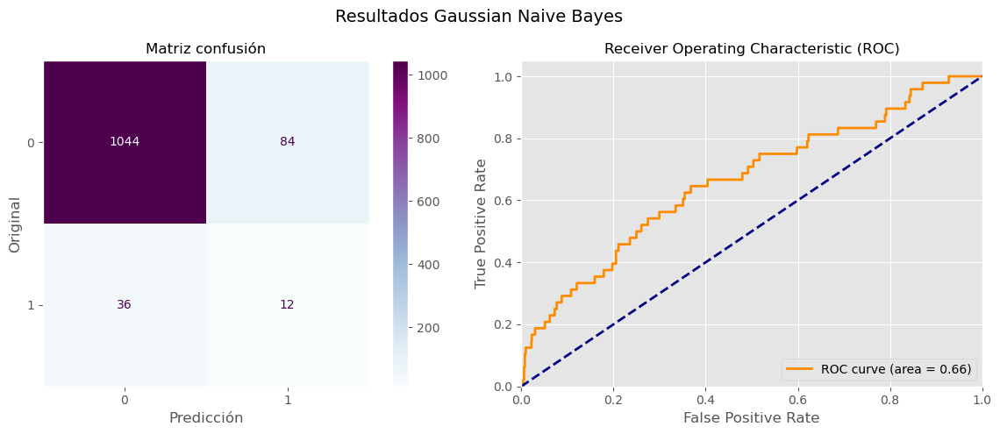

                     0          1  accuracy    macro avg  weighted avg
precision     0.966667   0.125000  0.897959     0.545833      0.932313
recall        0.925532   0.250000  0.897959     0.587766      0.897959
f1-score      0.945652   0.166667  0.897959     0.556159      0.913857
support    1128.000000  48.000000  0.897959  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.8980 || Clase 1: 0.2500 || Clase 0: 0.9255
Precisión total: 0.9323 || Clase 1: 0.1250 || Clase 0: 0.9667
F1 total: 0.9139 || Clase 1: 0.1667 || Clase 0: 0.9457
ROC AUC: 0.5878


,0,1,accuracy,macro avg,weighted avg
precision,0.966667,0.125000,0.897959,0.545833,0.932313
recall,0.925532,0.250000,0.897959,0.587766,0.897959
f1-score,0.945652,0.166667,0.897959,0.556159,0.913857
support,1128.000000,48.000000,0.897959,1176.000000,1176.000000


In [115]:
# Se crea el pipeline
gnb = Pipeline([
    ('GNB', GaussianNB())
])

# Entrenar el modelo
gnb.fit(X_train, y_train)

# Se evalúa el modelo
evaluacion_clasificacion(gnb, 'Gaussian Naive Bayes', X_val, y_val, proba=True, plot=True, show_print=True)

El modelo anterior presenta el mejor recall hasta ahora, pero la precisión baja mucho. El modelo de Naive Bayes es útil para clasificación de documentos, filtrado de spam, etc. En este caso, podría ser un modelo rápido si interesa no perder ningún target positivo (ya que el recall es similar es muy alto), pero hay modelos mejores como el de árbol de decisión con similar precisión (mayor seguridad de que los valores positivos predichos son realmente positivos).

Alguno de los motivos por los cuales se obtienen estos resultados es porque el modelo de Naive Bayes supone que las variables de entrada son independientes. Esta suposición puede ser muy ingenua si las variables no son realmente independientes. Además, si existen relaciones complejas entre las variables y la target, es posible que este modelo no sea capaz de detectarlas.

Por otra parte, este modelo es sensible al desbalanceo de clases, como es el caso. Además, este modelo funciona mejor cuanto más se parezcan las variables a una distribución normal. Se puede visualizar la normalidad de una variable a partir del skewness. 

Otro de los riesgos que se corre es que las variables de entrada no recojan suficiente información discriminativa de la target, por lo que en tal caso, por mucho que aprenda, no será capaz de generalizar para nuevos registros. Si además se tiene en cuenta que el modelo GaussianNB es bastante sencillo, y que el problema de este estudio es complejo, puede que sea necesario recurrir a modelos más complejos.

### 7. MLPClassifier

Seguidamente, se va a probar un clasificador multicapa Perceptron o red neuronal de tipo MLPClassifier

In [229]:
# Se separan las variables de entrada y la target
target = df_accidentes["gravedad"]
variables = df_accidentes.drop(["gravedad","lesividad"], axis=1, inplace=False)

# Proporción de división entre conjuntos de train y test
train_ratio = 0.7  # 70% para train, 30% para test

X_train, X_val, y_train, y_val = train_test_split(variables, target, train_size=train_ratio, shuffle=False, random_state=SEED)

# Examinamos la forma de los conjuntos de datos
X_train.shape, X_val.shape, y_train.shape, y_val.shape

((2744, 59), (1176, 59), (2744,), (1176,))

In [126]:
metricas = [recall_scorer, f1_scorer, custom_recall_scorer]
nombres_metricas = ['recall_scorer', 'f1_scorer', 'custom_recall_scorer']
titulo = 'MLPClassifier con ROS y PCA'

for metrica, nombre_metrica in zip(metricas, nombres_metricas):

    mlp_ovs = imbalanced_pipeline([('std', StandardScaler()),
                                    ('ovs', RandomOverSampler(random_state=SEED)),
                                    ('pca', PCA(random_state=SEED)),
                                    ('std2', StandardScaler()),
                                    ('mlp', MLPClassifier(max_iter=2000, random_state=SEED, solver='lbfgs', early_stopping=True))
                                    ])

    # Se definen los meta-parámetros que se quieren optimizar con GridSearchCV.
    parameters = {
        'ovs__sampling_strategy': [0.1, 0.2, 0.5, 0.8, 1],
        'pca__n_components': [5, 10, 15, 20, 30, 40, 56],
        'mlp__hidden_layer_sizes': [(50,), (200,), (50, 50), (20, 20, 20), (200, 40, 20)],
        'mlp__activation': ['relu', 'logistic', 'tanh', 'identity'],
        'mlp__alpha': [10**-4, 10**-3, 10**-2],
    }

    # Se aplica GridSearchCV para encontrar los mejores meta-parámetros
    grid_search_mlp_ovs = GridSearchCV(mlp_ovs, parameters, cv=5, n_jobs=-1, scoring=metrica, verbose=1) # recall_scorer, f1_scorer, custom_recall_scorer
    grid_search_mlp_ovs.fit(X_train, y_train)

    # Se muestran por pantalla los mejores meta-parámetros encontrados
    print(f"El mejor meta-parámetro encontrado: {grid_search_mlp_ovs.best_params_}")
    print(f"El mejor score es: {grid_search_mlp_ovs.best_score_}")

    evaluacion_clasificacion(grid_search_mlp_ovs,  titulo + ' (' + nombre_metrica + ')', X_val, y_val, plot=True, show_print=True)

KeyboardInterrupt: 

Fitting 5 folds for each of 60 candidates, totalling 300 fits
Mejores meta-parámetros:  {'mlp__activation': 'relu', 'mlp__alpha': 0.0001, 'mlp__hidden_layer_sizes': (200, 40, 20)}
Mejor score:  0.14368421052631578


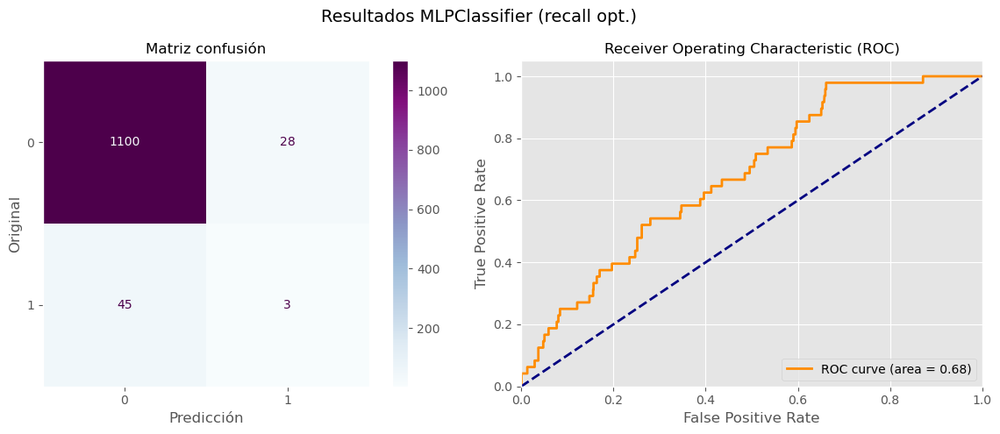

                     0          1  accuracy    macro avg  weighted avg
precision     0.960699   0.096774  0.937925     0.528736      0.925436
recall        0.975177   0.062500  0.937925     0.518839      0.937925
f1-score      0.967884   0.075949  0.937925     0.521917      0.931478
support    1128.000000  48.000000  0.937925  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.9379 || Clase 1: 0.0625 || Clase 0: 0.9752
Precisión total: 0.9254 || Clase 1: 0.0968 || Clase 0: 0.9607
F1 total: 0.9315 || Clase 1: 0.0759 || Clase 0: 0.9679
ROC AUC: 0.5188


,0,1,accuracy,macro avg,weighted avg
precision,0.960699,0.096774,0.937925,0.528736,0.925436
recall,0.975177,0.062500,0.937925,0.518839,0.937925
f1-score,0.967884,0.075949,0.937925,0.521917,0.931478
support,1128.000000,48.000000,0.937925,1176.000000,1176.000000


In [125]:
# Se define el pipeline que se va a aplicar
mlp = Pipeline([
    ('scaler', StandardScaler()),
    ('mlp', MLPClassifier(max_iter=2000, random_state=SEED, solver='lbfgs', early_stopping=True))
])

# Se define parameter grid con los meta-parámetros a probar: número de capas ocultas, función de activación para las capas ocultas,
# y el parámetro de regularización alpha (a mayor alpha, mayor regularización)
param_grid = {
    'mlp__hidden_layer_sizes': [(50,), (200,), (50, 50), (20, 20, 20), (200, 40, 20)],
    'mlp__activation': ['relu', 'logistic', 'tanh', 'identity'],
    'mlp__alpha': [10**-4, 10**-3, 10**-2],
}

# Se realiza la búsqueda de meta-parámetros utilizando GridSearchCV
grid_search_mlp = GridSearchCV(mlp, param_grid=param_grid, scoring=recall_scorer, cv=5, verbose=1, n_jobs=-1)

# Se hace el Fit del grid_search a los datos de entrenamiento
grid_search_mlp.fit(X_train, y_train)

# Se muestran los mejores meta-parámetros y el score
print("Mejores meta-parámetros: ", grid_search_mlp.best_params_)
print("Mejor score: ", grid_search_mlp.best_score_)

# Se evalúa el modelo
evaluacion_clasificacion(grid_search_mlp, 'MLPClassifier (recall opt.)', X_val, y_val, proba=True, plot=True, show_print=True)

Se observa cómo con el modelo de red neuronal MLPC se mejora la precisión de la target = True respecto al modelo de árbol, pero el recall es menor (es decir, hay muestras True que se quedan sin predecir como True por este modelo). La mejor configuración obtenida se da con una sola capa oculta de 50 nodos, un bajo coeficiente de regularización y un solver de tipo lbfgs (suele funcionar bien para pequeños conjuntos de datos).

Se va a intentar mejorar el modelo de árbol mostrado al principio. Para ello, se repite el modelo para poder comparar las métricas de clasificación.

### 8. Árbol de decisión mejorado

In [66]:
# Se separan las variables de entrada y la target
target = df_accidentes["gravedad"]
variables = df_accidentes.drop(["gravedad","lesividad"], axis=1, inplace=False)

# Proporción de división entre conjuntos de train y test
train_ratio = 0.7  # 70% para train, 30% para test

X_train, X_val, y_train, y_val = train_test_split(variables, target, train_size=train_ratio, shuffle=False, random_state=SEED)

# Examinamos la forma de los conjuntos de datos
X_train.shape, X_val.shape, y_train.shape, y_val.shape

((2744, 59), (1176, 59), (2744,), (1176,))

Fitting 15 folds for each of 37 candidates, totalling 555 fits
Mejores meta-parámetros:  {'feature_selection__k': 38}
Mejor score:  0.6571428571428571


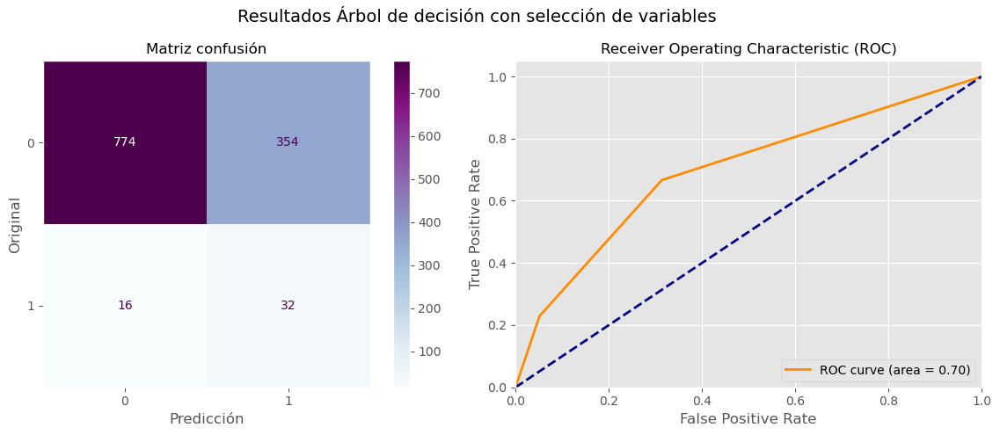

                     0          1  accuracy    macro avg  weighted avg
precision     0.979747   0.082902  0.685374     0.531324      0.943141
recall        0.686170   0.666667  0.685374     0.676418      0.685374
f1-score      0.807091   0.147465  0.685374     0.477278      0.780167
support    1128.000000  48.000000  0.685374  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.6854 || Clase 1: 0.6667 || Clase 0: 0.6862
Precisión total: 0.9431 || Clase 1: 0.0829 || Clase 0: 0.9797
F1 total: 0.7802 || Clase 1: 0.1475 || Clase 0: 0.8071
ROC AUC: 0.6764


,0,1,accuracy,macro avg,weighted avg
precision,0.979747,0.082902,0.685374,0.531324,0.943141
recall,0.686170,0.666667,0.685374,0.676418,0.685374
f1-score,0.807091,0.147465,0.685374,0.477278,0.780167
support,1128.000000,48.000000,0.685374,1176.000000,1176.000000


In [132]:
# Se crea el pipeline que incluya la selección de variables y el modelo de árbol de decisión
t2 = Pipeline([
  ('scaler', MinMaxScaler()),
  ('feature_selection', SelectKBest(chi2)),
  ('classification', DecisionTreeClassifier(random_state=SEED, class_weight='balanced', ccp_alpha=0.016))
])

# Se define parameter grid con los meta-parámetros a probar
param_grid = {
    'feature_selection__k': [x for x in range (4, 41)]
}

# Se realiza la búsqueda de meta-parámetros utilizando GridSearchCV
grid_search_t = GridSearchCV(t2, param_grid=param_grid, scoring=recall_scorer, cv=15, verbose=1, n_jobs=-1)

# Se hace el Fit del grid_search a los datos de entrenamiento
grid_search_t.fit(X_train, y_train)

# Se muestran los mejores meta-parámetros y el score
print("Mejores meta-parámetros: ", grid_search_t.best_params_)
print("Mejor score: ", grid_search_t.best_score_)

# Se evalúa el modelo
evaluacion_clasificacion(grid_search_t, 'Árbol de decisión con selección de variables', X_val, y_val, proba=True, plot=True, show_print=True)

Se observa que la precisión baja ligeramente para los valores de target = True, pero a cambio, se mejora el recall (por lo que se identificarán más registros donde target = True).

Dado que se observa que los modelos de árbol funcionan bien, se va a seguir con un modelo de ensemble, concretamente un Bagging Classifier

### 9. Bagging classifier 

In [234]:
# Se separan las variables de entrada y la target
target = df_accidentes["gravedad"]
variables = df_accidentes.drop(["gravedad","lesividad"], axis=1, inplace=False)

# Proporción de división entre conjuntos de train y test
train_ratio = 0.7  # 70% para train, 30% para test

X_train, X_val, y_train, y_val = train_test_split(variables, target, train_size=train_ratio, shuffle=False, random_state=SEED)

# Examinamos la forma de los conjuntos de datos
X_train.shape, X_val.shape, y_train.shape, y_val.shape

((2744, 59), (1176, 59), (2744,), (1176,))

El mejor meta-parámetro encontrado: {'bc__n_estimators': 5, 'ovs__sampling_strategy': 1, 'pca__n_components': 5}
El mejor score es: 0.10157894736842103


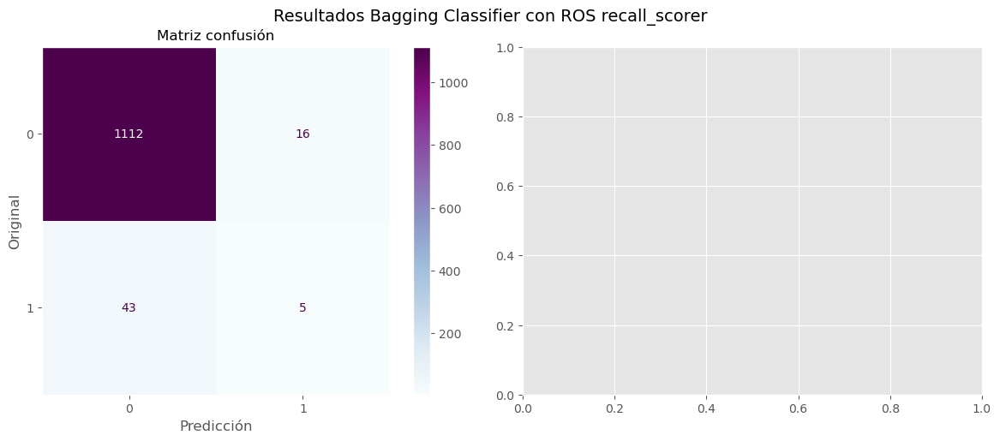

                     0          1  accuracy    macro avg  weighted avg
precision     0.962771   0.238095   0.94983     0.600433      0.933192
recall        0.985816   0.104167   0.94983     0.544991      0.949830
f1-score      0.974157   0.144928   0.94983     0.559542      0.940311
support    1128.000000  48.000000   0.94983  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.9498 || Clase 1: 0.1042 || Clase 0: 0.9858
Precisión total: 0.9332 || Clase 1: 0.2381 || Clase 0: 0.9628
F1 total: 0.9403 || Clase 1: 0.1449 || Clase 0: 0.9742
ROC AUC: 0.5450
El mejor meta-parámetro encontrado: {'bc__n_estimators': 5, 'ovs__sampling_strategy': 1, 'pca__n_components': 5}
El mejor score es: 0.11653916575119012


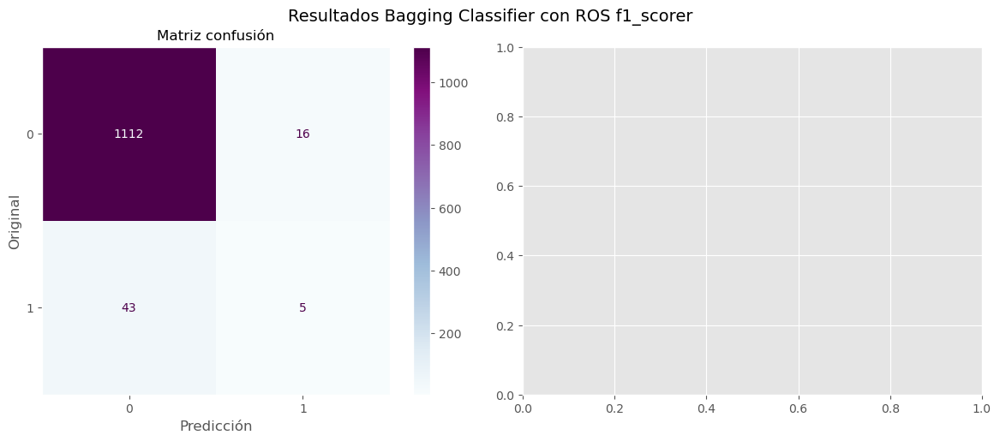

                     0          1  accuracy    macro avg  weighted avg
precision     0.962771   0.238095   0.94983     0.600433      0.933192
recall        0.985816   0.104167   0.94983     0.544991      0.949830
f1-score      0.974157   0.144928   0.94983     0.559542      0.940311
support    1128.000000  48.000000   0.94983  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.9498 || Clase 1: 0.1042 || Clase 0: 0.9858
Precisión total: 0.9332 || Clase 1: 0.2381 || Clase 0: 0.9628
F1 total: 0.9403 || Clase 1: 0.1449 || Clase 0: 0.9742
ROC AUC: 0.5450
El mejor meta-parámetro encontrado: {'bc__n_estimators': 5, 'ovs__sampling_strategy': 1, 'pca__n_components': 5}
El mejor score es: -0.4786613950284252


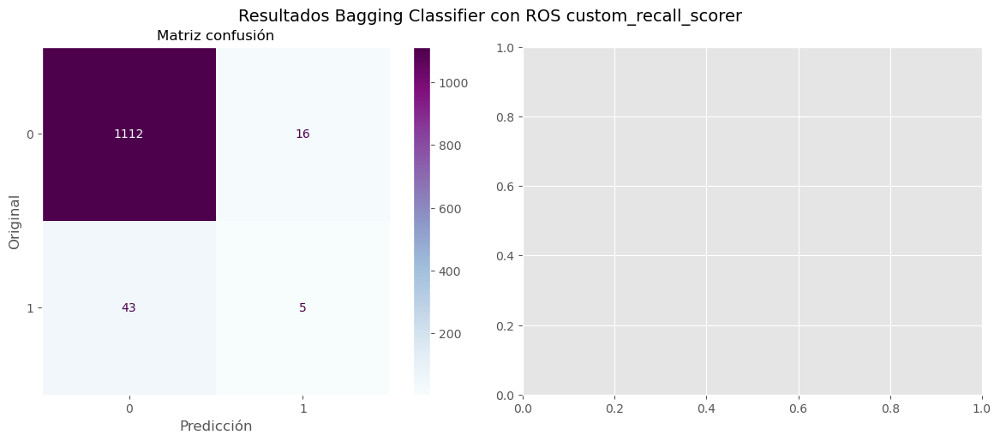

                     0          1  accuracy    macro avg  weighted avg
precision     0.962771   0.238095   0.94983     0.600433      0.933192
recall        0.985816   0.104167   0.94983     0.544991      0.949830
f1-score      0.974157   0.144928   0.94983     0.559542      0.940311
support    1128.000000  48.000000   0.94983  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.9498 || Clase 1: 0.1042 || Clase 0: 0.9858
Precisión total: 0.9332 || Clase 1: 0.2381 || Clase 0: 0.9628
F1 total: 0.9403 || Clase 1: 0.1449 || Clase 0: 0.9742
ROC AUC: 0.5450


In [133]:
bc_ovs = imbalanced_pipeline([('std', StandardScaler()),
                                ('ovs', RandomOverSampler(random_state=SEED)),
                                ('pca', PCA(random_state=SEED)),
                                ('bc', BaggingClassifier(random_state=SEED))])

# Se definen los meta-parámetros que se quieren optimizar con GridSearchCV.
parameters = {
    'ovs__sampling_strategy': [0.1, 0.2, 0.5, 0.8, 1],
    'pca__n_components': [5, 10, 15, 20, 30, 40, 55],
    'bc__n_estimators': [5, 10]
}

for criterio, nombre in zip([recall_scorer, f1_scorer, custom_recall_scorer],['recall_scorer', 'f1_scorer', 'custom_recall_scorer']):
    # Se aplica GridSearchCV para encontrar los mejores meta-parámetros
    grid_search_bc_ovs = GridSearchCV(bc_ovs, parameters, cv=5, n_jobs=-1, scoring=criterio) # recall_scorer, f1_scorer, custom_recall_scorer
    grid_search_bc_ovs.fit(X_train, y_train)

    # Se muestran por pantalla los mejores meta-parámetros encontrados
    print(f"El mejor meta-parámetro encontrado: {grid_search_bc_ovs.best_params_}")
    print(f"El mejor score es: {grid_search_bc_ovs.best_score_}")

    evaluacion_clasificacion(grid_search_bc_ovs, 'Bagging Classifier con ROS ' + nombre, X_val, y_val, plot=True, proba=False, show_print=True)


Fitting 15 folds for each of 15 candidates, totalling 225 fits
Mejores meta-parámetros:  {'classification__estimator': DecisionTreeClassifier(ccp_alpha=0.016, class_weight='balanced', random_state=9), 'classification__n_estimators': 5}
Mejor score:  0.5174603174603175


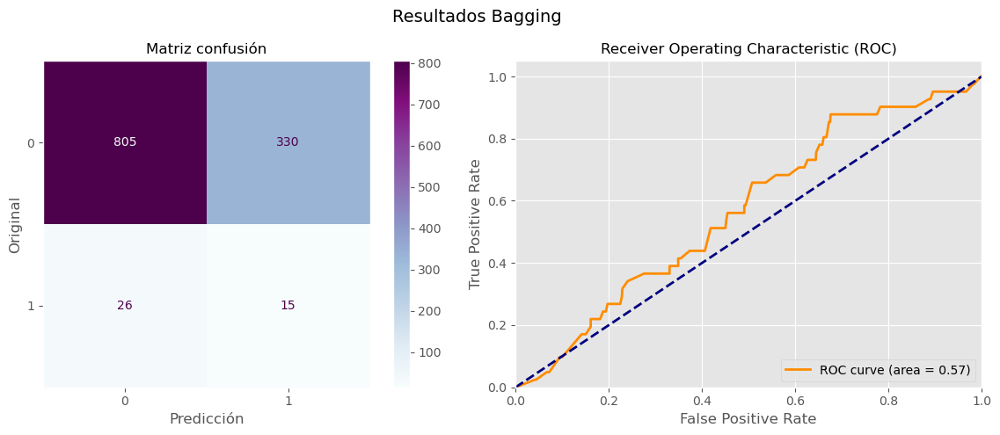

                     0          1  accuracy    macro avg  weighted avg
precision     0.968712   0.043478  0.697279     0.506095      0.936455
recall        0.709251   0.365854  0.697279     0.537552      0.697279
f1-score      0.818922   0.077720  0.697279     0.448321      0.793080
support    1135.000000  41.000000  0.697279  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.6973 || Clase 1: 0.3659 || Clase 0: 0.7093
Precisión total: 0.9365 || Clase 1: 0.0435 || Clase 0: 0.9687
F1 total: 0.7931 || Clase 1: 0.0777 || Clase 0: 0.8189
ROC AUC: 0.5376


,0,1,accuracy,macro avg,weighted avg
precision,0.968712,0.043478,0.697279,0.506095,0.936455
recall,0.709251,0.365854,0.697279,0.537552,0.697279
f1-score,0.818922,0.077720,0.697279,0.448321,0.793080
support,1135.000000,41.000000,0.697279,1176.000000,1176.000000


In [360]:
# Métrica que prioriza el recall de target = 1
recall_scorer = make_scorer(recall_score, pos_label=1)
f1_scorer = make_scorer(f1_score, pos_label=1)

# Se inicializa el MinMaxScaler
mms = MinMaxScaler()

# Se define el estimador
tree1 = DecisionTreeClassifier(random_state=SEED, class_weight='balanced', ccp_alpha=0.006)
tree2 = DecisionTreeClassifier(random_state=SEED, class_weight='balanced', ccp_alpha=0.010)
tree3 = DecisionTreeClassifier(random_state=SEED, class_weight='balanced', ccp_alpha=0.016)

# Se crea el modelo de clasificación bagging. Por defecto, el estimador es DecisionTreeClassifier
bc = BaggingClassifier(random_state=SEED)

# Se crea el pipeline que incluya la selección de variables y el modelo de clasificación
bagging = Pipeline([
  ('scaler', mms),
  ('classification', bc)
])

# Se entrena el pipeline utilizando los datos de entrenamiento
bagging.fit(X_train, y_train)


# Se define parameter grid con los meta-parámetros a probar
param_grid = {
    'classification__n_estimators': [5, 10, 50, 200, 400],
    'classification__estimator': [tree1, tree2, tree3]
}

# Se realiza la búsqueda de meta-parámetros utilizando GridSearchCV
grid_search_bc = GridSearchCV(bagging, param_grid=param_grid, cv=5, verbose=1, n_jobs=-1, scoring = recall_scorer)

# Se hace el Fit del grid_search a los datos de entrenamiento
grid_search_bc.fit(X_train, y_train)


# Se muestran los mejores meta-parámetros y el score
print("Mejores meta-parámetros: ", grid_search_bc.best_params_)
print("Mejor score: ", grid_search_bc.best_score_)

# Se evalúa el modelo
evaluacion_clasificacion(grid_search_bc, 'Bagging', X_val, y_val, proba=True, plot=True, show_print=True)

Fitting 15 folds for each of 15 candidates, totalling 225 fits


One or more of the test scores are non-finite: [nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan]


Mejores meta-parámetros:  {'classification__estimator': DecisionTreeClassifier(ccp_alpha=0.006, class_weight='balanced', random_state=9), 'classification__n_estimators': 5}
Mejor score:  nan


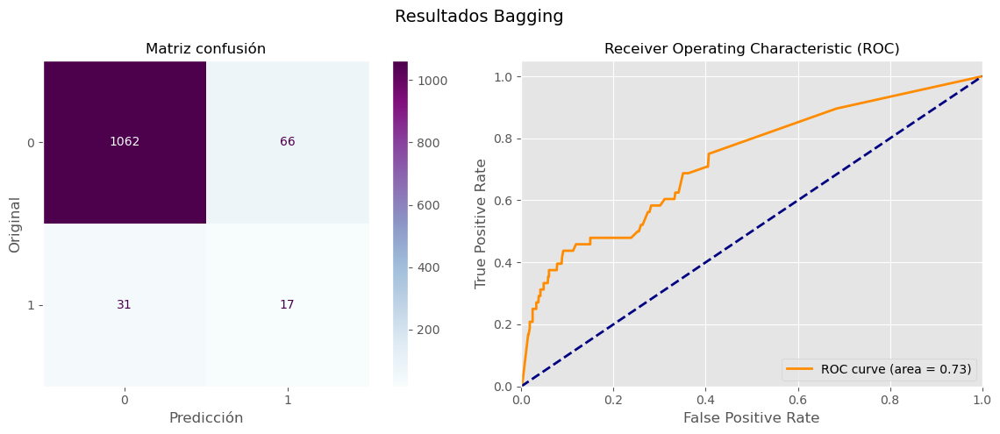

                     0          1  accuracy    macro avg  weighted avg
precision     0.971638   0.204819  0.917517     0.588228      0.940339
recall        0.941489   0.354167  0.917517     0.647828      0.917517
f1-score      0.956326   0.259542  0.917517     0.607934      0.927886
support    1128.000000  48.000000  0.917517  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.9175 || Clase 1: 0.3542 || Clase 0: 0.9415
Precisión total: 0.9403 || Clase 1: 0.2048 || Clase 0: 0.9716
F1 total: 0.9279 || Clase 1: 0.2595 || Clase 0: 0.9563
ROC AUC: 0.6478


,0,1,accuracy,macro avg,weighted avg
precision,0.971638,0.204819,0.917517,0.588228,0.940339
recall,0.941489,0.354167,0.917517,0.647828,0.917517
f1-score,0.956326,0.259542,0.917517,0.607934,0.927886
support,1128.000000,48.000000,0.917517,1176.000000,1176.000000


In [268]:
# Métrica que prioriza el recall de target = 1
recall_scorer = make_scorer(recall_score, pos_label=1)
f1_scorer = make_scorer(f1_score, pos_label=1)

# Se inicializa el MinMaxScaler
mms = MinMaxScaler()

# Se define el estimador
tree1 = DecisionTreeClassifier(random_state=SEED, class_weight='balanced', ccp_alpha=0.006)
tree2 = DecisionTreeClassifier(random_state=SEED, class_weight='balanced', ccp_alpha=0.010)
tree3 = DecisionTreeClassifier(random_state=SEED, class_weight='balanced', ccp_alpha=0.016)

# Se crea el modelo de clasificación bagging. Por defecto, el estimador es DecisionTreeClassifier
bc = BaggingClassifier(random_state=SEED)

# Se crea el pipeline que incluya la selección de variables y el modelo de clasificación
bagging = Pipeline([
  ('scaler', mms),
  ('classification', bc)
])

# Se entrena el pipeline utilizando los datos de entrenamiento
bagging.fit(X_train, y_train)


# Se define parameter grid con los meta-parámetros a probar
param_grid = {
    'classification__n_estimators': [5, 10, 50, 200, 400],
    'classification__estimator': [tree1, tree2, tree3]
}

# Se realiza la búsqueda de meta-parámetros utilizando GridSearchCV
grid_search_bc = GridSearchCV(bagging, param_grid=param_grid, cv=15, verbose=1, n_jobs=-1, scoring = custom_recall_loss)

# Se hace el Fit del grid_search a los datos de entrenamiento
grid_search_bc.fit(X_train, y_train)


# Se muestran los mejores meta-parámetros y el score
print("Mejores meta-parámetros: ", grid_search_bc.best_params_)
print("Mejor score: ", grid_search_bc.best_score_)

# Se evalúa el modelo
evaluacion_clasificacion(grid_search_bc, 'Bagging (custom)', X_val, y_val, proba=True, plot=True, show_print=True) 

Fitting 15 folds for each of 5 candidates, totalling 75 fits
Mejores meta-parámetros:  {'classification__estimator': DecisionTreeClassifier(ccp_alpha=0.006, class_weight='balanced', random_state=9), 'classification__n_estimators': 5}
Mejor score:  0.30476190476190473


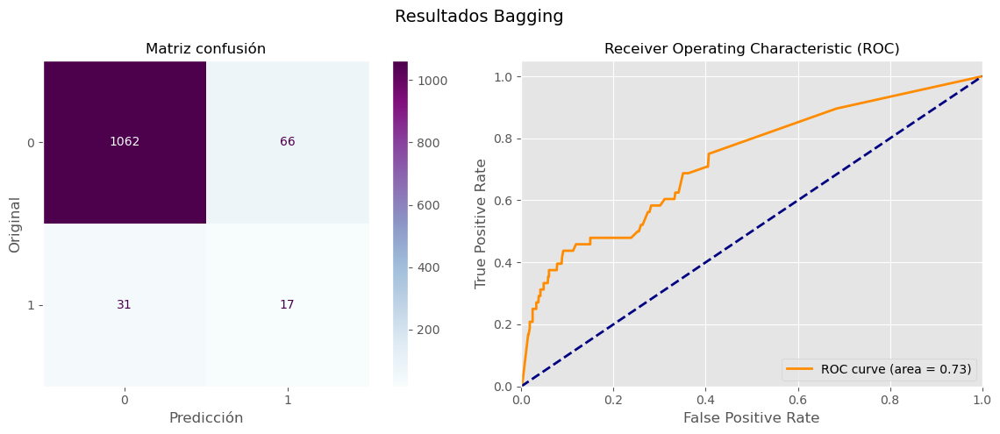

                     0          1  accuracy    macro avg  weighted avg
precision     0.971638   0.204819  0.917517     0.588228      0.940339
recall        0.941489   0.354167  0.917517     0.647828      0.917517
f1-score      0.956326   0.259542  0.917517     0.607934      0.927886
support    1128.000000  48.000000  0.917517  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.9175 || Clase 1: 0.3542 || Clase 0: 0.9415
Precisión total: 0.9403 || Clase 1: 0.2048 || Clase 0: 0.9716
F1 total: 0.9279 || Clase 1: 0.2595 || Clase 0: 0.9563
ROC AUC: 0.6478


,0,1,accuracy,macro avg,weighted avg
precision,0.971638,0.204819,0.917517,0.588228,0.940339
recall,0.941489,0.354167,0.917517,0.647828,0.917517
f1-score,0.956326,0.259542,0.917517,0.607934,0.927886
support,1128.000000,48.000000,0.917517,1176.000000,1176.000000


In [246]:
# Métrica que prioriza el recall de target = 1
recall_scorer = make_scorer(recall_score, pos_label=1)
f1_scorer = make_scorer(f1_score, pos_label=1)

# Se inicializa el MinMaxScaler
mms = MinMaxScaler()

# Se define el estimador
tree1 = DecisionTreeClassifier(random_state=SEED, class_weight='balanced', ccp_alpha=0.006)
tree2 = DecisionTreeClassifier(random_state=SEED, class_weight='balanced', ccp_alpha=0.010)
tree3 = DecisionTreeClassifier(random_state=SEED, class_weight='balanced', ccp_alpha=0.016)

# Se crea el modelo de clasificación bagging. Por defecto, el estimador es DecisionTreeClassifier
bc = BaggingClassifier(random_state=SEED)

# Se crea el pipeline que incluya la selección de variables y el modelo de clasificación
bagging = Pipeline([
  ('scaler', mms),
  ('classification', bc)
])

# Se entrena el pipeline utilizando los datos de entrenamiento
bagging.fit(X_train, y_train)


# Se define parameter grid con los meta-parámetros a probar
param_grid = {
    'classification__n_estimators': [5, 10, 50, 200, 400],
    'classification__estimator': [tree1]
}

# Se realiza la búsqueda de meta-parámetros utilizando GridSearchCV
grid_search_bc = GridSearchCV(bagging, param_grid=param_grid, cv=15, verbose=1, n_jobs=-1, scoring = recall_scorer)

# Se hace el Fit del grid_search a los datos de entrenamiento
grid_search_bc.fit(X_train, y_train)


# Se muestran los mejores meta-parámetros y el score
print("Mejores meta-parámetros: ", grid_search_bc.best_params_)
print("Mejor score: ", grid_search_bc.best_score_)

# Se evalúa el modelo
evaluacion_clasificacion(grid_search_bc, 'Bagging (recall opt. tree1)', X_val, y_val, proba=True, plot=True, show_print=True)

Fitting 15 folds for each of 5 candidates, totalling 75 fits
Mejores meta-parámetros:  {'classification__estimator': DecisionTreeClassifier(ccp_alpha=0.01, class_weight='balanced', random_state=9), 'classification__n_estimators': 10}
Mejor score:  0.3047619047619048


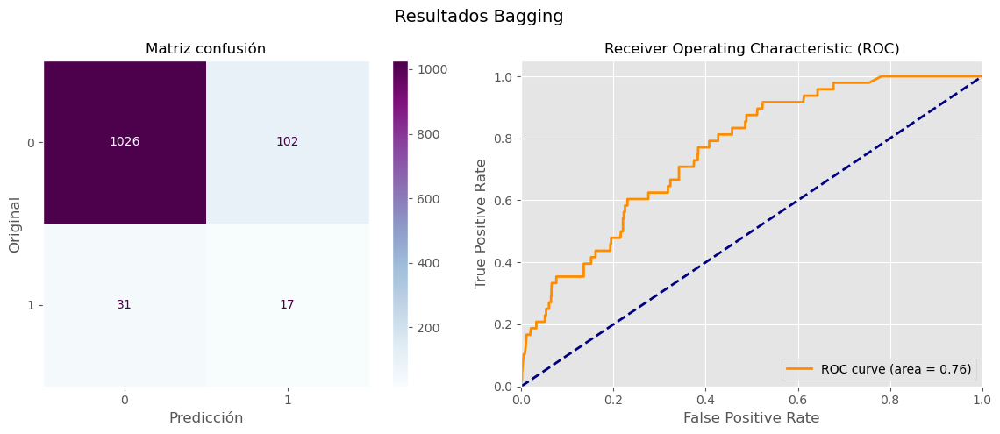

                     0          1  accuracy    macro avg  weighted avg
precision     0.970672   0.142857  0.886905     0.556764      0.936883
recall        0.909574   0.354167  0.886905     0.631871      0.886905
f1-score      0.939130   0.203593  0.886905     0.571362      0.909108
support    1128.000000  48.000000  0.886905  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.8869 || Clase 1: 0.3542 || Clase 0: 0.9096
Precisión total: 0.9369 || Clase 1: 0.1429 || Clase 0: 0.9707
F1 total: 0.9091 || Clase 1: 0.2036 || Clase 0: 0.9391
ROC AUC: 0.6319


,0,1,accuracy,macro avg,weighted avg
precision,0.970672,0.142857,0.886905,0.556764,0.936883
recall,0.909574,0.354167,0.886905,0.631871,0.886905
f1-score,0.939130,0.203593,0.886905,0.571362,0.909108
support,1128.000000,48.000000,0.886905,1176.000000,1176.000000


In [247]:
# Métrica que prioriza el recall de target = 1
recall_scorer = make_scorer(recall_score, pos_label=1)
f1_scorer = make_scorer(f1_score, pos_label=1)

# Se inicializa el MinMaxScaler
mms = MinMaxScaler()

# Se define el estimador
tree1 = DecisionTreeClassifier(random_state=SEED, class_weight='balanced', ccp_alpha=0.006)
tree2 = DecisionTreeClassifier(random_state=SEED, class_weight='balanced', ccp_alpha=0.010)
tree3 = DecisionTreeClassifier(random_state=SEED, class_weight='balanced', ccp_alpha=0.016)

# Se crea el modelo de clasificación bagging. Por defecto, el estimador es DecisionTreeClassifier
bc = BaggingClassifier(random_state=SEED)

# Se crea el pipeline que incluya la selección de variables y el modelo de clasificación
bagging = Pipeline([
  ('scaler', mms),
  ('classification', bc)
])

# Se entrena el pipeline utilizando los datos de entrenamiento
bagging.fit(X_train, y_train)


# Se define parameter grid con los meta-parámetros a probar
param_grid = {
    'classification__n_estimators': [5, 10, 50, 200, 400],
    'classification__estimator': [tree2]
}

# Se realiza la búsqueda de meta-parámetros utilizando GridSearchCV
grid_search_bc = GridSearchCV(bagging, param_grid=param_grid, cv=15, verbose=1, n_jobs=-1, scoring = recall_scorer)

# Se hace el Fit del grid_search a los datos de entrenamiento
grid_search_bc.fit(X_train, y_train)


# Se muestran los mejores meta-parámetros y el score
print("Mejores meta-parámetros: ", grid_search_bc.best_params_)
print("Mejor score: ", grid_search_bc.best_score_)

# Se evalúa el modelo
evaluacion_clasificacion(grid_search_bc, 'Bagging (recall opt. tree2)', X_val, y_val, proba=True, plot=True, show_print=True)

Fitting 15 folds for each of 5 candidates, totalling 75 fits
Mejores meta-parámetros:  {'classification__estimator': DecisionTreeClassifier(ccp_alpha=0.016, class_weight='balanced', random_state=9), 'classification__n_estimators': 5}
Mejor score:  0.4253968253968254


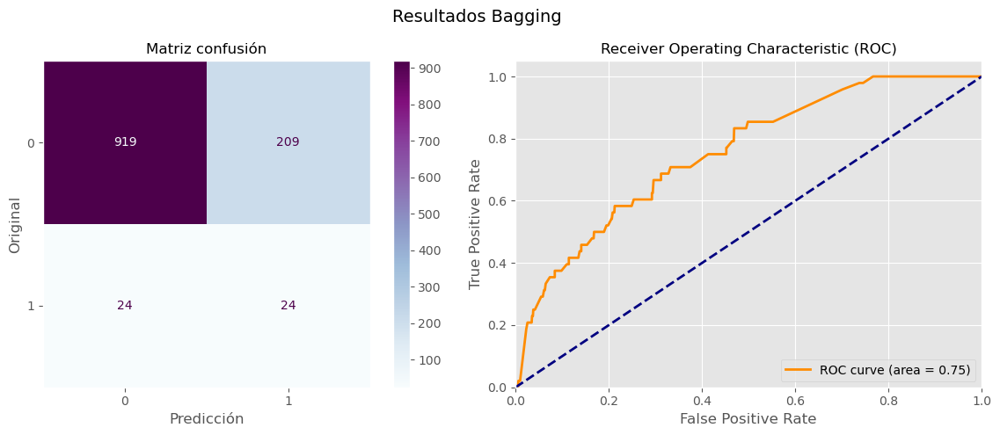

                     0          1  accuracy    macro avg  weighted avg
precision     0.974549   0.103004  0.801871     0.538777      0.938976
recall        0.814716   0.500000  0.801871     0.657358      0.801871
f1-score      0.887494   0.170819  0.801871     0.529156      0.858242
support    1128.000000  48.000000  0.801871  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.8019 || Clase 1: 0.5000 || Clase 0: 0.8147
Precisión total: 0.9390 || Clase 1: 0.1030 || Clase 0: 0.9745
F1 total: 0.8582 || Clase 1: 0.1708 || Clase 0: 0.8875
ROC AUC: 0.6574


,0,1,accuracy,macro avg,weighted avg
precision,0.974549,0.103004,0.801871,0.538777,0.938976
recall,0.814716,0.500000,0.801871,0.657358,0.801871
f1-score,0.887494,0.170819,0.801871,0.529156,0.858242
support,1128.000000,48.000000,0.801871,1176.000000,1176.000000


In [248]:
# Métrica que prioriza el recall de target = 1
recall_scorer = make_scorer(recall_score, pos_label=1)
f1_scorer = make_scorer(f1_score, pos_label=1)

# Se inicializa el MinMaxScaler
mms = MinMaxScaler()

# Se define el estimador
tree1 = DecisionTreeClassifier(random_state=SEED, class_weight='balanced', ccp_alpha=0.006)
tree2 = DecisionTreeClassifier(random_state=SEED, class_weight='balanced', ccp_alpha=0.010)
tree3 = DecisionTreeClassifier(random_state=SEED, class_weight='balanced', ccp_alpha=0.016)

# Se crea el modelo de clasificación bagging. Por defecto, el estimador es DecisionTreeClassifier
bc = BaggingClassifier(random_state=SEED)

# Se crea el pipeline que incluya la selección de variables y el modelo de clasificación
bagging = Pipeline([
  ('scaler', mms),
  ('classification', bc)
])

# Se entrena el pipeline utilizando los datos de entrenamiento
bagging.fit(X_train, y_train)


# Se define parameter grid con los meta-parámetros a probar
param_grid = {
    'classification__n_estimators': [5, 10, 50, 200, 400],
    'classification__estimator': [tree3]
}

# Se realiza la búsqueda de meta-parámetros utilizando GridSearchCV
grid_search_bc = GridSearchCV(bagging, param_grid=param_grid, cv=15, verbose=1, n_jobs=-1, scoring = recall_scorer)

# Se hace el Fit del grid_search a los datos de entrenamiento
grid_search_bc.fit(X_train, y_train)


# Se muestran los mejores meta-parámetros y el score
print("Mejores meta-parámetros: ", grid_search_bc.best_params_)
print("Mejor score: ", grid_search_bc.best_score_)

# Se evalúa el modelo
evaluacion_clasificacion(grid_search_bc, 'Bagging (tree3 recall opt.)', X_val, y_val, proba=True, plot=True, show_print=True)

Fitting 15 folds for each of 15 candidates, totalling 225 fits
Mejores meta-parámetros:  {'classification__estimator': DecisionTreeClassifier(ccp_alpha=0.006, class_weight='balanced', random_state=9), 'classification__n_estimators': 50}
Mejor score:  0.21707055471761352


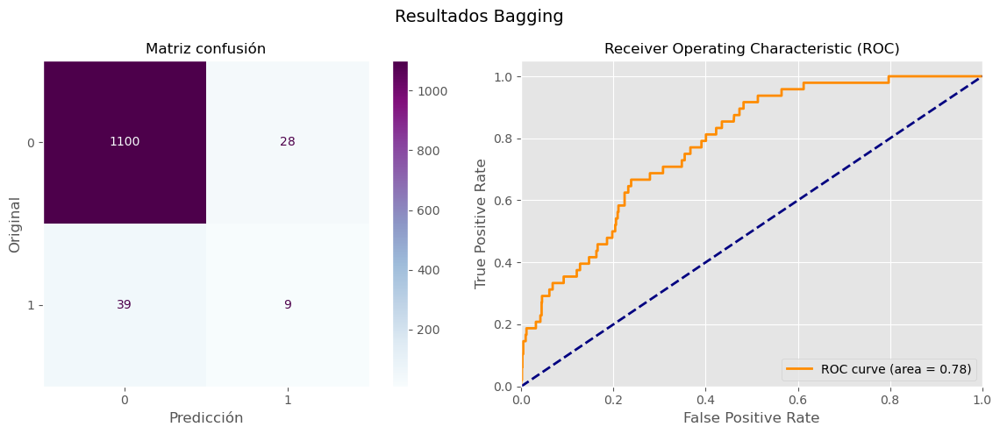

                     0          1  accuracy    macro avg  weighted avg
precision     0.965759   0.243243  0.943027     0.604501      0.936269
recall        0.975177   0.187500  0.943027     0.581339      0.943027
f1-score      0.970446   0.211765  0.943027     0.591105      0.939479
support    1128.000000  48.000000  0.943027  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.9430 || Clase 1: 0.1875 || Clase 0: 0.9752
Precisión total: 0.9363 || Clase 1: 0.2432 || Clase 0: 0.9658
F1 total: 0.9395 || Clase 1: 0.2118 || Clase 0: 0.9704
ROC AUC: 0.5813


,0,1,accuracy,macro avg,weighted avg
precision,0.965759,0.243243,0.943027,0.604501,0.936269
recall,0.975177,0.187500,0.943027,0.581339,0.943027
f1-score,0.970446,0.211765,0.943027,0.591105,0.939479
support,1128.000000,48.000000,0.943027,1176.000000,1176.000000


In [245]:
# Métrica que prioriza el recall de target = 1
recall_scorer = make_scorer(recall_score, pos_label=1)
f1_scorer = make_scorer(f1_score, pos_label=1)

# Se inicializa el MinMaxScaler
mms = MinMaxScaler()

# Se define el estimador
tree1 = DecisionTreeClassifier(random_state=SEED, class_weight='balanced', ccp_alpha=0.006)
tree2 = DecisionTreeClassifier(random_state=SEED, class_weight='balanced', ccp_alpha=0.010)
tree3 = DecisionTreeClassifier(random_state=SEED, class_weight='balanced', ccp_alpha=0.016)

# Se crea el modelo de clasificación bagging. Por defecto, el estimador es DecisionTreeClassifier
bc = BaggingClassifier(random_state=SEED)

# Se crea el pipeline que incluya la selección de variables y el modelo de clasificación
bagging = Pipeline([
  ('scaler', mms),
  ('classification', bc)
])

# Se entrena el pipeline utilizando los datos de entrenamiento
bagging.fit(X_train, y_train)


# Se define parameter grid con los meta-parámetros a probar
param_grid = {
    'classification__n_estimators': [5, 10, 50, 200, 400],
    'classification__estimator': [tree1, tree2, tree3]
}

# Se realiza la búsqueda de meta-parámetros utilizando GridSearchCV
grid_search_bc = GridSearchCV(bagging, param_grid=param_grid, cv=15, verbose=1, n_jobs=-1, scoring = f1_scorer)

# Se hace el Fit del grid_search a los datos de entrenamiento
grid_search_bc.fit(X_train, y_train)


# Se muestran los mejores meta-parámetros y el score
print("Mejores meta-parámetros: ", grid_search_bc.best_params_)
print("Mejor score: ", grid_search_bc.best_score_)

# Se evalúa el modelo
evaluacion_clasificacion(grid_search_bc, 'Bagging (f1 opt.)', X_val, y_val, proba=True, plot=True, show_print=True)

No es ninguna sorpresa que el ensemble de árboles de clasificación presente unas mejores métricas de clasificación que el modelo de árboles.

Se va a probar con otro ejemplo de bagging, el RandomForestClassifier

### 10. RandomForest classifier

In [249]:
# Se separan las variables de entrada y la target
target = df_accidentes["gravedad"]
variables = df_accidentes.drop(["gravedad","lesividad"], axis=1, inplace=False)

# Proporción de división entre conjuntos de train y test
train_ratio = 0.7  # 70% para train, 30% para test

X_train, X_val, y_train, y_val = train_test_split(variables, target, train_size=train_ratio, shuffle=False, random_state=SEED)

# Examinamos la forma de los conjuntos de datos
X_train.shape, X_val.shape, y_train.shape, y_val.shape

((2744, 59), (1176, 59), (2744,), (1176,))

In [257]:
# Métrica que prioriza el recall de target = 1
recall_scorer = make_scorer(recall_score, pos_label=1)
f1_scorer = make_scorer(f1_score, pos_label=1)

# Define los porcentajes de recall deseados
target_recall_1 = 0.75
target_recall_0 = 0.75

# Define una función de pérdida para usar como base para la métrica personalizada
def custom_recall_loss(y_true, y_pred):
    recall_1 = recall_score(y_true, y_pred, pos_label=1)
    recall_0 = recall_score(y_true, y_pred, pos_label=0)
    loss = ((recall_1 - target_recall_1) ** 2) + ((recall_0 - target_recall_0) ** 2)
    return loss

# Crea una métrica personalizada utilizando make_scorer
custom_recall_scorer = make_scorer(custom_recall_loss, greater_is_better=False)


Fitting 15 folds for each of 432 candidates, totalling 6480 fits
Mejores meta-parámetros:  {'classification__ccp_alpha': 0.03, 'classification__criterion': 'gini', 'classification__max_depth': 3, 'classification__n_estimators': 200}
Mejor score:  0.16998259050890627


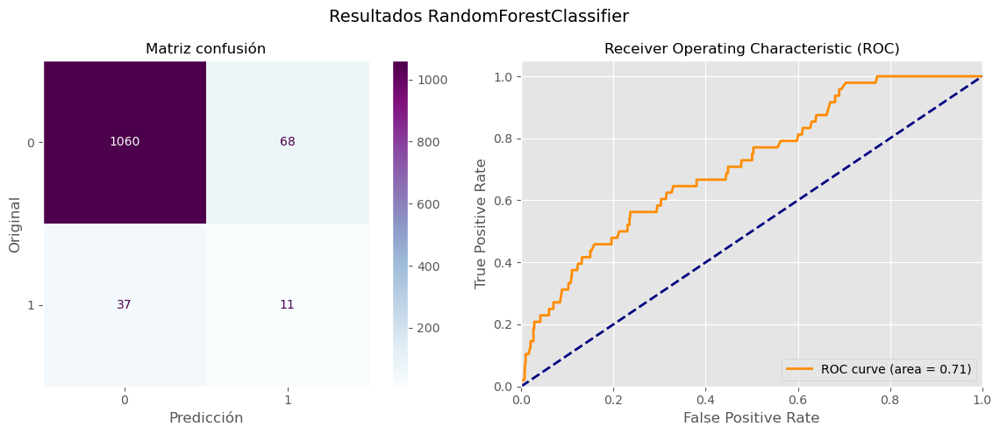

                     0          1  accuracy    macro avg  weighted avg
precision     0.966272   0.139241  0.910714     0.552756      0.932515
recall        0.939716   0.229167  0.910714     0.584441      0.910714
f1-score      0.952809   0.173228  0.910714     0.563019      0.920989
support    1128.000000  48.000000  0.910714  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.9107 || Clase 1: 0.2292 || Clase 0: 0.9397
Precisión total: 0.9325 || Clase 1: 0.1392 || Clase 0: 0.9663
F1 total: 0.9210 || Clase 1: 0.1732 || Clase 0: 0.9528
ROC AUC: 0.5844


,0,1,accuracy,macro avg,weighted avg
precision,0.966272,0.139241,0.910714,0.552756,0.932515
recall,0.939716,0.229167,0.910714,0.584441,0.910714
f1-score,0.952809,0.173228,0.910714,0.563019,0.920989
support,1128.000000,48.000000,0.910714,1176.000000,1176.000000


In [253]:
# Se crea el modelo de clasificación random forest
rfc = RandomForestClassifier(random_state=SEED, class_weight = 'balanced')

# Se crea el pipeline que incluya la selección de variables y el modelo de clasificación
randomforest = Pipeline([
  ('scaler', MinMaxScaler()),
  ('classification', rfc)
])

# Se define parameter grid con los meta-parámetros a probar
param_grid = {
    'classification__n_estimators': [2, 5, 10, 50, 200, 400],
    'classification__max_depth': [3, 5, 7, 11],
    'classification__criterion': ['gini', 'entropy', 'log_loss'],
    'classification__ccp_alpha': [0.0, 0.001, 0.01, 0.015, 0.02, 0.03]
}

# Se realiza la búsqueda de meta-parámetros utilizando GridSearchCV
grid_search_rfc = GridSearchCV(randomforest, param_grid=param_grid, cv=15, verbose=1, n_jobs=-1, scoring = f1_scorer)

# Se hace el Fit del grid_search a los datos de entrenamiento
grid_search_rfc.fit(X_train, y_train)

# Se muestran los mejores meta-parámetros y el score
print("Mejores meta-parámetros: ", grid_search_rfc.best_params_)
print("Mejor score: ", grid_search_rfc.best_score_)

# Se evalúa el modelo
evaluacion_clasificacion(grid_search_rfc, 'RandomForestClassifier (f1 opt.)', X_val, y_val, proba=True, plot=True, show_print=True)

Fitting 15 folds for each of 432 candidates, totalling 6480 fits


One or more of the test scores are non-finite: [nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan

Mejores meta-parámetros:  {'classification__ccp_alpha': 0.0, 'classification__criterion': 'gini', 'classification__max_depth': 3, 'classification__n_estimators': 2}
Mejor score:  nan


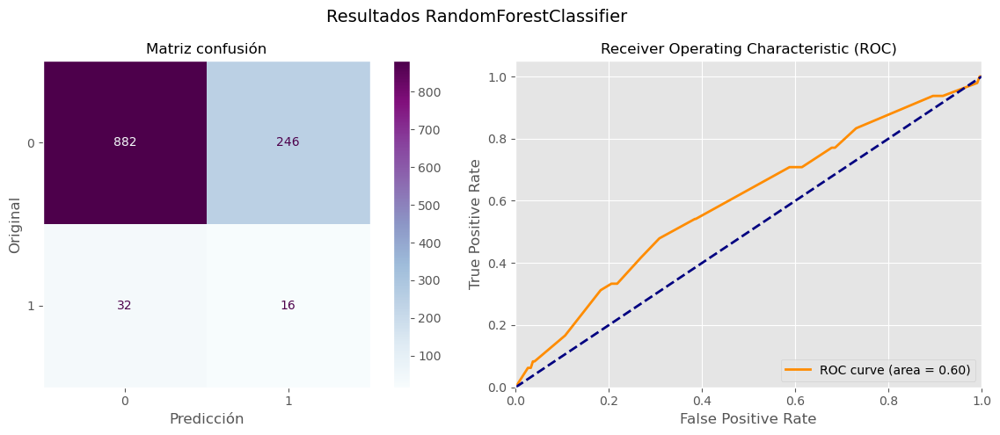

                     0          1  accuracy    macro avg  weighted avg
precision     0.964989   0.061069  0.763605     0.513029      0.928094
recall        0.781915   0.333333  0.763605     0.557624      0.763605
f1-score      0.863859   0.103226  0.763605     0.483542      0.832813
support    1128.000000  48.000000  0.763605  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.7636 || Clase 1: 0.3333 || Clase 0: 0.7819
Precisión total: 0.9281 || Clase 1: 0.0611 || Clase 0: 0.9650
F1 total: 0.8328 || Clase 1: 0.1032 || Clase 0: 0.8639
ROC AUC: 0.5576


,0,1,accuracy,macro avg,weighted avg
precision,0.964989,0.061069,0.763605,0.513029,0.928094
recall,0.781915,0.333333,0.763605,0.557624,0.763605
f1-score,0.863859,0.103226,0.763605,0.483542,0.832813
support,1128.000000,48.000000,0.763605,1176.000000,1176.000000


In [259]:
# Se crea el modelo de clasificación random forest
rfc = RandomForestClassifier(random_state=SEED, class_weight = 'balanced')

# Se crea el pipeline que incluya la selección de variables y el modelo de clasificación
randomforest = Pipeline([
  ('scaler', MinMaxScaler()),
  ('classification', rfc)
])

# Se define parameter grid con los meta-parámetros a probar
param_grid = {
    'classification__n_estimators': [2, 5, 10, 50, 200, 400],
    'classification__max_depth': [3, 5, 7, 11],
    'classification__criterion': ['gini', 'entropy', 'log_loss'],
    'classification__ccp_alpha': [0.0, 0.001, 0.01, 0.015, 0.02, 0.03]
}

# Se realiza la búsqueda de meta-parámetros utilizando GridSearchCV
grid_search_rfc = GridSearchCV(randomforest, param_grid=param_grid, cv=15, verbose=1, n_jobs=-1, scoring = custom_recall_loss)

# Se hace el Fit del grid_search a los datos de entrenamiento
grid_search_rfc.fit(X_train, y_train)

# Se muestran los mejores meta-parámetros y el score
print("Mejores meta-parámetros: ", grid_search_rfc.best_params_)
print("Mejor score: ", grid_search_rfc.best_score_)

# Se evalúa el modelo
evaluacion_clasificacion(grid_search_rfc, 'RandomForestClassifier (custom)', X_val, y_val, proba=True, plot=True, show_print=True)

### 11. XGBClassifier
Idea de scale_pos_weight sacada de: https://www.kaggle.com/code/vipin07/heart-disease-eda-fe-resam-xgboost
https://machinelearningmastery.com/xgboost-for-imbalanced-classification/

#### Con oversampling y PCA

Fitting 5 folds for each of 4032 candidates, totalling 20160 fits
El mejor meta-parámetro encontrado: {'ovs__sampling_strategy': 1, 'pca__n_components': 10, 'xbg__max_depth': 3, 'xbg__n_estimators': 2, 'xbg__reg_alpha': 0.01, 'xbg__scale_pos_weight': 70}
El mejor score es: 0.99


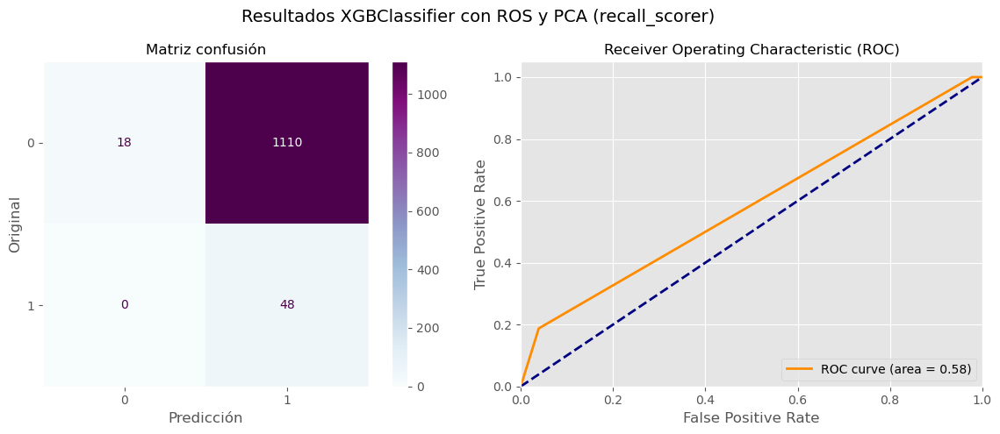

                     0          1  accuracy    macro avg  weighted avg
precision     1.000000   0.041451  0.056122     0.520725      0.960876
recall        0.015957   1.000000  0.056122     0.507979      0.056122
f1-score      0.031414   0.079602  0.056122     0.055508      0.033380
support    1128.000000  48.000000  0.056122  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.0561 || Clase 1: 1.0000 || Clase 0: 0.0160
Precisión total: 0.9609 || Clase 1: 0.0415 || Clase 0: 1.0000
F1 total: 0.0334 || Clase 1: 0.0796 || Clase 0: 0.0314
ROC AUC: 0.5080
Fitting 5 folds for each of 4032 candidates, totalling 20160 fits
El mejor meta-parámetro encontrado: {'ovs__sampling_strategy': 0.5, 'pca__n_components': 20, 'xbg__max_depth': 5, 'xbg__n_estimators': 50, 'xbg__reg_alpha': 0.015, 'xbg__scale_pos_weight': 30}
El mejor score es: 0.15316017316017316


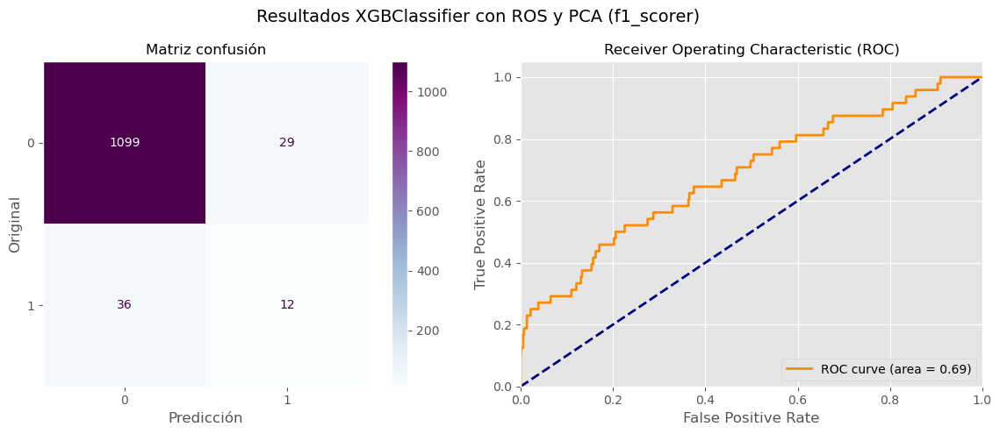

                     0          1  accuracy    macro avg  weighted avg
precision     0.968282   0.292683  0.944728     0.630482      0.940706
recall        0.974291   0.250000  0.944728     0.612145      0.944728
f1-score      0.971277   0.269663  0.944728     0.620470      0.942640
support    1128.000000  48.000000  0.944728  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.9447 || Clase 1: 0.2500 || Clase 0: 0.9743
Precisión total: 0.9407 || Clase 1: 0.2927 || Clase 0: 0.9683
F1 total: 0.9426 || Clase 1: 0.2697 || Clase 0: 0.9713
ROC AUC: 0.6121
Fitting 5 folds for each of 4032 candidates, totalling 20160 fits
El mejor meta-parámetro encontrado: {'ovs__sampling_strategy': 0.1, 'pca__n_components': 10, 'xbg__max_depth': 5, 'xbg__n_estimators': 10, 'xbg__reg_alpha': 0.01, 'xbg__scale_pos_weight': 70}
El mejor score es: -0.07346817350622095


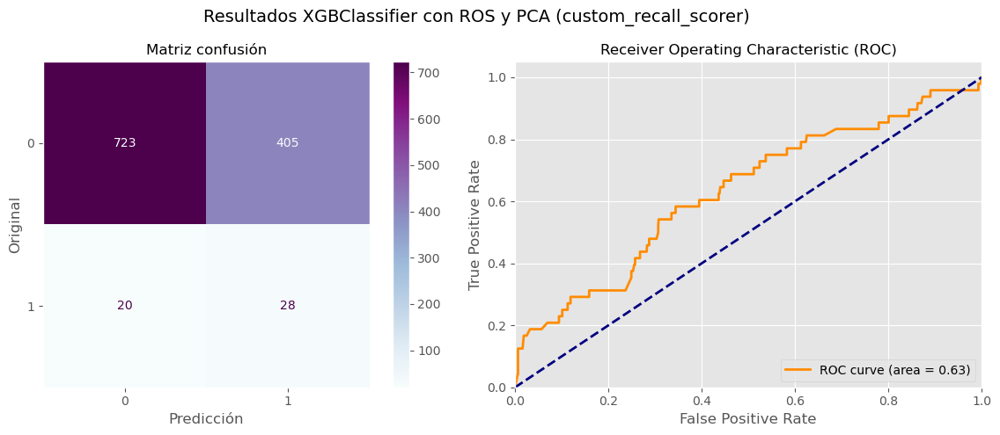

                     0          1  accuracy    macro avg  weighted avg
precision     0.973082   0.064665  0.638605     0.518874      0.936004
recall        0.640957   0.583333  0.638605     0.612145      0.638605
f1-score      0.772849   0.116424  0.638605     0.444636      0.746056
support    1128.000000  48.000000  0.638605  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.6386 || Clase 1: 0.5833 || Clase 0: 0.6410
Precisión total: 0.9360 || Clase 1: 0.0647 || Clase 0: 0.9731
F1 total: 0.7461 || Clase 1: 0.1164 || Clase 0: 0.7728
ROC AUC: 0.6121


In [242]:
metricas = [recall_scorer, f1_scorer, custom_recall_scorer]
nombres_metricas = ['recall_scorer', 'f1_scorer', 'custom_recall_scorer']
titulo = 'XGBClassifier con ROS y PCA'

for metrica, nombre_metrica in zip(metricas, nombres_metricas):

    xbg_ovs = imbalanced_pipeline([('std', StandardScaler()),
                                    ('ovs', RandomOverSampler(random_state=SEED)),
                                    ('pca', PCA(random_state=SEED)),
                                    ('xbg', XGBClassifier(random_state=SEED))
                                    ])

    # Se definen los meta-parámetros que se quieren optimizar con GridSearchCV.
    parameters = {
        'ovs__sampling_strategy': [0.1, 0.5,  1],
        'pca__n_components': [10, 20, 35, 56],
        'xbg__n_estimators': [2, 5, 10, 50],
        'xbg__max_depth': [3, 5, 7, None],
        'xbg__reg_alpha': [0.01, 0.015, 0.02],
        'xbg__scale_pos_weight': [1, 10, 30, 50, 70, 99, 100]
    }

    # Se aplica GridSearchCV para encontrar los mejores meta-parámetros
    grid_search_xgb_ovs = GridSearchCV(xbg_ovs, parameters, cv=5, n_jobs=-1, scoring=metrica, verbose=3) # recall_scorer, f1_scorer, custom_recall_scorer
    grid_search_xgb_ovs.fit(X_train, y_train)

    # Se muestran por pantalla los mejores meta-parámetros encontrados
    print(f"El mejor meta-parámetro encontrado: {grid_search_xgb_ovs.best_params_}")
    print(f"El mejor score es: {grid_search_xgb_ovs.best_score_}")

    resultado = pd.DataFrame(evaluacion_clasificacion(grid_search_xgb_ovs,  titulo + ' (' + nombre_metrica + ')', X_val, y_val, plot=True, show_print=True))
    resultado['modelo'] = titulo + ' (' + nombre_metrica + ')'
    resultados_rl_list.append(resultado)

#### Con oversampling

Fitting 5 folds for each of 1008 candidates, totalling 5040 fits
El mejor meta-parámetro encontrado: {'ovs__sampling_strategy': 0.1, 'xbg__max_depth': 3, 'xbg__n_estimators': 5, 'xbg__reg_alpha': 0.01, 'xbg__scale_pos_weight': 100}
El mejor score es: 0.9073684210526316


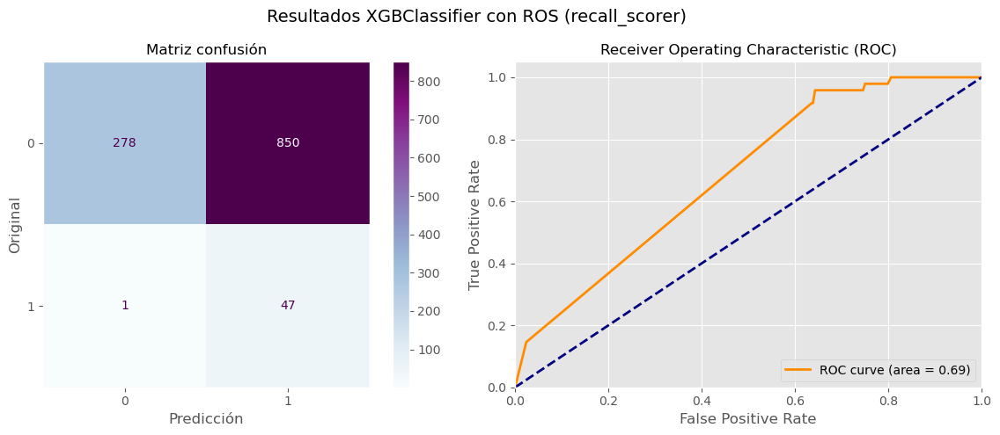

                     0          1  accuracy    macro avg  weighted avg
precision     0.996416   0.052397  0.276361     0.524406      0.957884
recall        0.246454   0.979167  0.276361     0.612810      0.276361
f1-score      0.395167   0.099471  0.276361     0.247319      0.383098
support    1128.000000  48.000000  0.276361  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.2764 || Clase 1: 0.9792 || Clase 0: 0.2465
Precisión total: 0.9579 || Clase 1: 0.0524 || Clase 0: 0.9964
F1 total: 0.3831 || Clase 1: 0.0995 || Clase 0: 0.3952
ROC AUC: 0.6128
Fitting 5 folds for each of 1008 candidates, totalling 5040 fits
El mejor meta-parámetro encontrado: {'ovs__sampling_strategy': 0.5, 'xbg__max_depth': 3, 'xbg__n_estimators': 2, 'xbg__reg_alpha': 0.01, 'xbg__scale_pos_weight': 1}
El mejor score es: 0.17905749561082884


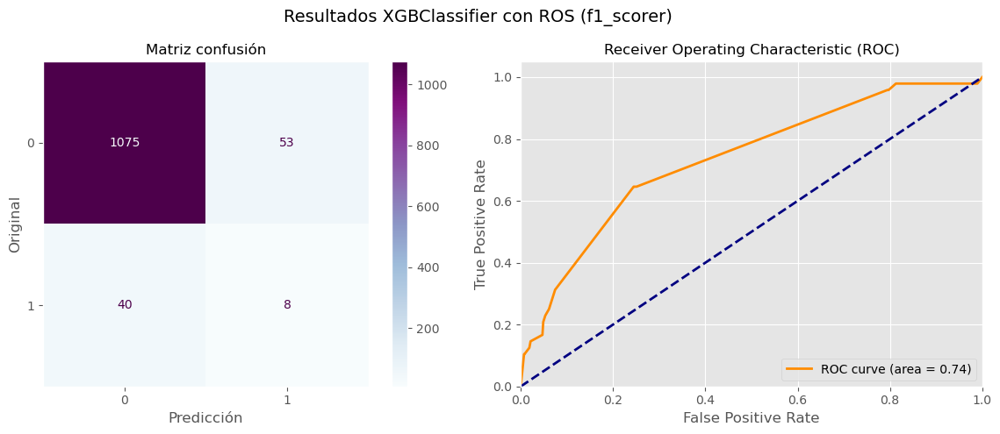

                     0          1  accuracy    macro avg  weighted avg
precision     0.964126   0.131148  0.920918     0.547637      0.930126
recall        0.953014   0.166667  0.920918     0.559840      0.920918
f1-score      0.958538   0.146789  0.920918     0.552663      0.925405
support    1128.000000  48.000000  0.920918  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.9209 || Clase 1: 0.1667 || Clase 0: 0.9530
Precisión total: 0.9301 || Clase 1: 0.1311 || Clase 0: 0.9641
F1 total: 0.9254 || Clase 1: 0.1468 || Clase 0: 0.9585
ROC AUC: 0.5598
Fitting 5 folds for each of 1008 candidates, totalling 5040 fits
El mejor meta-parámetro encontrado: {'ovs__sampling_strategy': 0.5, 'xbg__max_depth': 7, 'xbg__n_estimators': 2, 'xbg__reg_alpha': 0.01, 'xbg__scale_pos_weight': 10}
El mejor score es: -0.03224885185647628


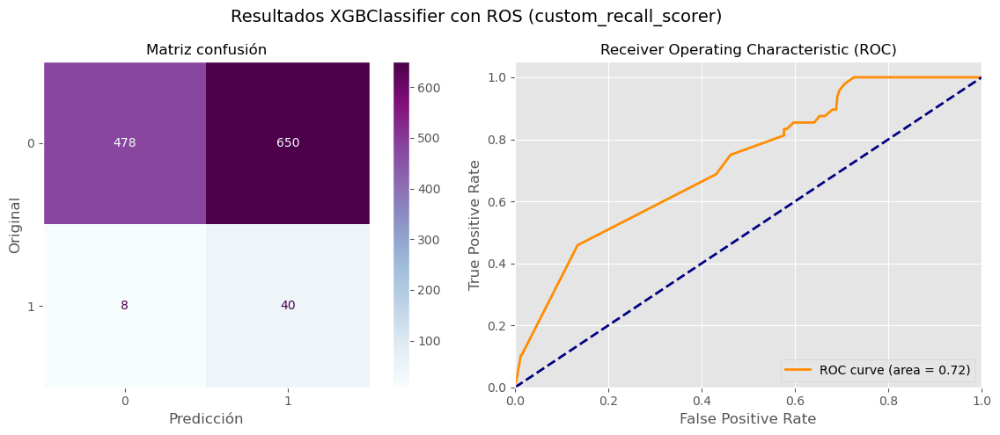

                     0          1  accuracy    macro avg  weighted avg
precision     0.983539   0.057971  0.440476     0.520755      0.945761
recall        0.423759   0.833333  0.440476     0.628546      0.440476
f1-score      0.592317   0.108401  0.440476     0.350359      0.572566
support    1128.000000  48.000000  0.440476  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.4405 || Clase 1: 0.8333 || Clase 0: 0.4238
Precisión total: 0.9458 || Clase 1: 0.0580 || Clase 0: 0.9835
F1 total: 0.5726 || Clase 1: 0.1084 || Clase 0: 0.5923
ROC AUC: 0.6285


In [243]:
metricas = [recall_scorer, f1_scorer, custom_recall_scorer]
nombres_metricas = ['recall_scorer', 'f1_scorer', 'custom_recall_scorer']
titulo = 'XGBClassifier con ROS'

for metrica, nombre_metrica in zip(metricas, nombres_metricas):

    xbg_ovs = imbalanced_pipeline([('std', StandardScaler()),
                                    ('ovs', RandomOverSampler(random_state=SEED)),
                                    ('xbg', XGBClassifier(random_state=SEED))
                                    ])

    # Se definen los meta-parámetros que se quieren optimizar con GridSearchCV.
    parameters = {
        'ovs__sampling_strategy': [0.1, 0.5,  1],
        'xbg__n_estimators': [2, 5, 10, 50],
        'xbg__max_depth': [3, 5, 7, None],
        'xbg__reg_alpha': [0.01, 0.015, 0.02],
        'xbg__scale_pos_weight': [1, 10, 30, 50, 70, 99, 100]
    }

    # Se aplica GridSearchCV para encontrar los mejores meta-parámetros
    grid_search_xgb_ovs = GridSearchCV(xbg_ovs, parameters, cv=5, n_jobs=-1, scoring=metrica, verbose=3) # recall_scorer, f1_scorer, custom_recall_scorer
    grid_search_xgb_ovs.fit(X_train, y_train)

    # Se muestran por pantalla los mejores meta-parámetros encontrados
    print(f"El mejor meta-parámetro encontrado: {grid_search_xgb_ovs.best_params_}")
    print(f"El mejor score es: {grid_search_xgb_ovs.best_score_}")

    resultado = pd.DataFrame(evaluacion_clasificacion(grid_search_xgb_ovs,  titulo + ' (' + nombre_metrica + ')', X_val, y_val, plot=True, show_print=True))
    resultado['modelo'] = titulo + ' (' + nombre_metrica + ')'
    resultados_rl_list.append(resultado)

#### Con PCA

Fitting 5 folds for each of 1008 candidates, totalling 5040 fits
El mejor meta-parámetro encontrado: {'pca__n_components': 10, 'xbg__max_depth': 3, 'xbg__n_estimators': 5, 'xbg__reg_alpha': 0.01, 'xbg__scale_pos_weight': 99}
El mejor score es: 0.8152631578947368


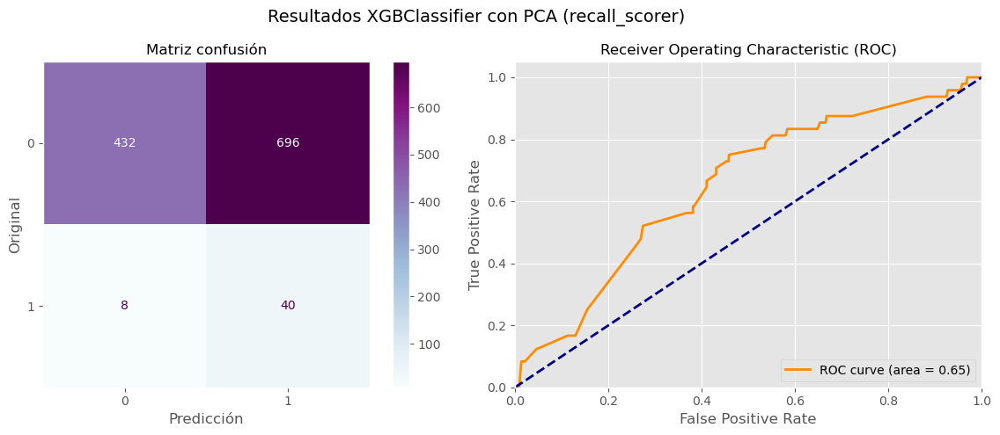

                     0          1  accuracy    macro avg  weighted avg
precision     0.981818   0.054348  0.401361     0.518083      0.943962
recall        0.382979   0.833333  0.401361     0.608156      0.401361
f1-score      0.551020   0.102041  0.401361     0.326531      0.532695
support    1128.000000  48.000000  0.401361  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.4014 || Clase 1: 0.8333 || Clase 0: 0.3830
Precisión total: 0.9440 || Clase 1: 0.0543 || Clase 0: 0.9818
F1 total: 0.5327 || Clase 1: 0.1020 || Clase 0: 0.5510
ROC AUC: 0.6082
Fitting 5 folds for each of 1008 candidates, totalling 5040 fits
El mejor meta-parámetro encontrado: {'pca__n_components': 35, 'xbg__max_depth': 5, 'xbg__n_estimators': 2, 'xbg__reg_alpha': 0.01, 'xbg__scale_pos_weight': 10}
El mejor score es: 0.13945754841087454


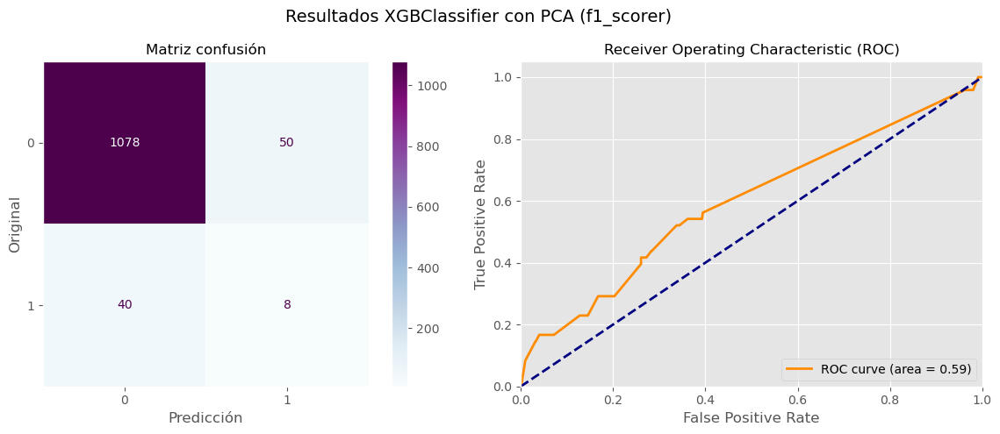

                     0          1  accuracy    macro avg  weighted avg
precision     0.964222   0.137931  0.923469     0.551076      0.930496
recall        0.955674   0.166667  0.923469     0.561170      0.923469
f1-score      0.959929   0.150943  0.923469     0.555436      0.926909
support    1128.000000  48.000000  0.923469  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.9235 || Clase 1: 0.1667 || Clase 0: 0.9557
Precisión total: 0.9305 || Clase 1: 0.1379 || Clase 0: 0.9642
F1 total: 0.9269 || Clase 1: 0.1509 || Clase 0: 0.9599
ROC AUC: 0.5612
Fitting 5 folds for each of 1008 candidates, totalling 5040 fits
El mejor meta-parámetro encontrado: {'pca__n_components': 20, 'xbg__max_depth': 3, 'xbg__n_estimators': 10, 'xbg__reg_alpha': 0.02, 'xbg__scale_pos_weight': 100}
El mejor score es: -0.08728047706246926


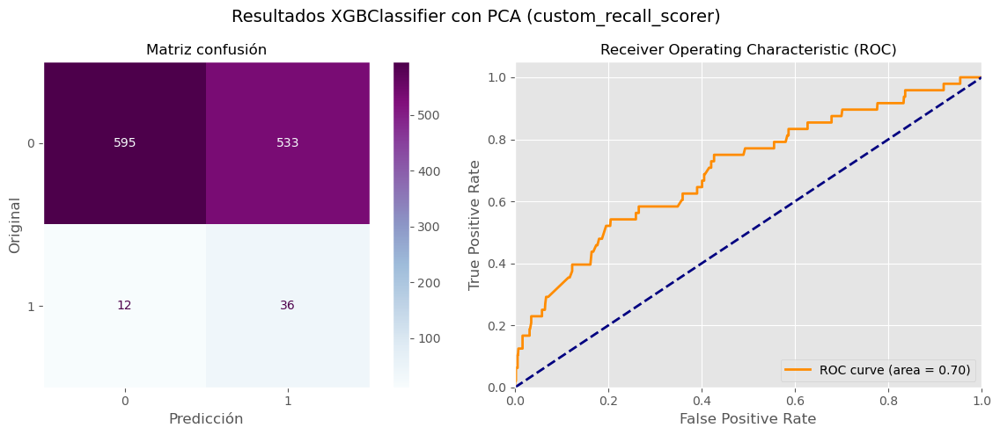

                     0          1  accuracy    macro avg  weighted avg
precision     0.980231   0.063269  0.536565     0.521750      0.942804
recall        0.527482   0.750000  0.536565     0.638741      0.536565
f1-score      0.685879   0.116694  0.536565     0.401286      0.662647
support    1128.000000  48.000000  0.536565  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.5366 || Clase 1: 0.7500 || Clase 0: 0.5275
Precisión total: 0.9428 || Clase 1: 0.0633 || Clase 0: 0.9802
F1 total: 0.6626 || Clase 1: 0.1167 || Clase 0: 0.6859
ROC AUC: 0.6387


In [252]:
metricas = [recall_scorer, f1_scorer, custom_recall_scorer]
nombres_metricas = ['recall_scorer', 'f1_scorer', 'custom_recall_scorer']
titulo = 'XGBClassifier con PCA'

for metrica, nombre_metrica in zip(metricas, nombres_metricas):

    xbg_ovs = imbalanced_pipeline([('std', StandardScaler()),
                                    ('pca', PCA(random_state=SEED)),
                                    ('xbg', XGBClassifier(random_state=SEED))
                                    ])

    # Se definen los meta-parámetros que se quieren optimizar con GridSearchCV.
    parameters = {
        'pca__n_components': [10, 20, 35, 56],
        'xbg__n_estimators': [2, 5, 10],
        'xbg__max_depth': [3, 5, 7, None],
        'xbg__reg_alpha': [0.01, 0.015, 0.02],
        'xbg__scale_pos_weight': [1, 10, 30, 50, 70, 99, 100]
    }

    # Se aplica GridSearchCV para encontrar los mejores meta-parámetros
    grid_search_xgb_ovs = GridSearchCV(xbg_ovs, parameters, cv=5, n_jobs=-1, scoring=metrica, verbose=3) # recall_scorer, f1_scorer, custom_recall_scorer
    grid_search_xgb_ovs.fit(X_train, y_train)

    # Se muestran por pantalla los mejores meta-parámetros encontrados
    print(f"El mejor meta-parámetro encontrado: {grid_search_xgb_ovs.best_params_}")
    print(f"El mejor score es: {grid_search_xgb_ovs.best_score_}")

    resultado = pd.DataFrame(evaluacion_clasificacion(grid_search_xgb_ovs,  titulo + ' (' + nombre_metrica + ')', X_val, y_val, plot=True, show_print=True))
    resultado['modelo'] = titulo + ' (' + nombre_metrica + ')'
    resultados_rl_list.append(resultado)

#### Básico

Fitting 5 folds for each of 336 candidates, totalling 1680 fits
El mejor meta-parámetro encontrado: {'xbg__max_depth': 3, 'xbg__n_estimators': 2, 'xbg__reg_alpha': 0.01, 'xbg__scale_pos_weight': 99}
El mejor score es: 0.8852631578947368


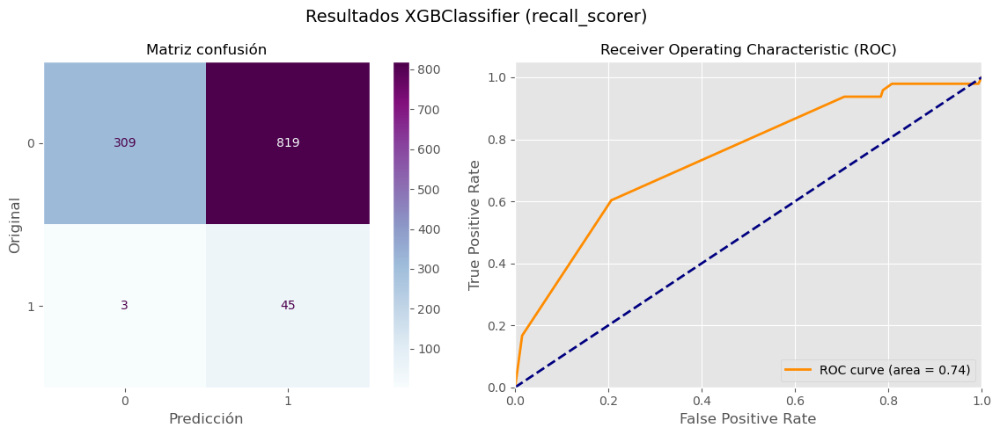

                     0          1  accuracy    macro avg  weighted avg
precision     0.990385   0.052083   0.30102     0.521234      0.952087
recall        0.273936   0.937500   0.30102     0.605718      0.301020
f1-score      0.429167   0.098684   0.30102     0.263925      0.415678
support    1128.000000  48.000000   0.30102  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.3010 || Clase 1: 0.9375 || Clase 0: 0.2739
Precisión total: 0.9521 || Clase 1: 0.0521 || Clase 0: 0.9904
F1 total: 0.4157 || Clase 1: 0.0987 || Clase 0: 0.4292
ROC AUC: 0.6057
Fitting 5 folds for each of 336 candidates, totalling 1680 fits
El mejor meta-parámetro encontrado: {'xbg__max_depth': None, 'xbg__n_estimators': 5, 'xbg__reg_alpha': 0.01, 'xbg__scale_pos_weight': 10}
El mejor score es: 0.17522334077440876


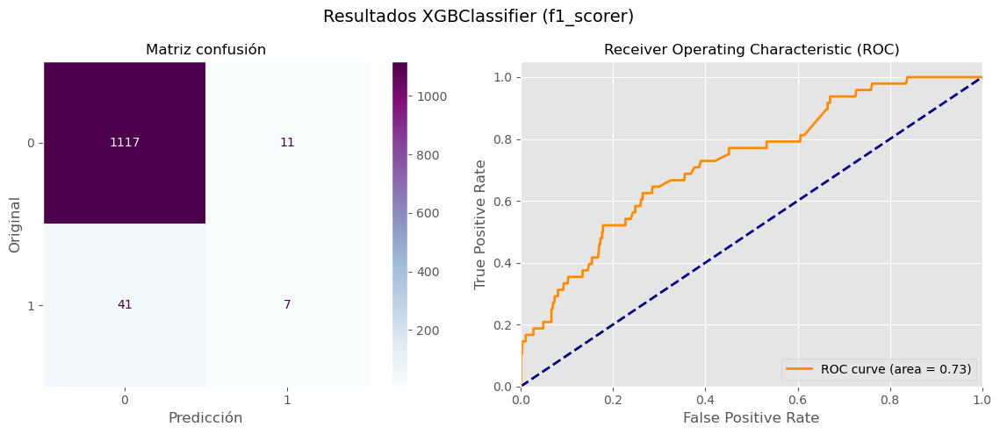

                     0          1  accuracy    macro avg  weighted avg
precision     0.964594   0.388889  0.955782     0.676742      0.941096
recall        0.990248   0.145833  0.955782     0.568041      0.955782
f1-score      0.977253   0.212121  0.955782     0.594687      0.946023
support    1128.000000  48.000000  0.955782  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.9558 || Clase 1: 0.1458 || Clase 0: 0.9902
Precisión total: 0.9411 || Clase 1: 0.3889 || Clase 0: 0.9646
F1 total: 0.9460 || Clase 1: 0.2121 || Clase 0: 0.9773
ROC AUC: 0.5680
Fitting 5 folds for each of 336 candidates, totalling 1680 fits
El mejor meta-parámetro encontrado: {'xbg__max_depth': 7, 'xbg__n_estimators': 2, 'xbg__reg_alpha': 0.01, 'xbg__scale_pos_weight': 100}
El mejor score es: -0.03355981639844569


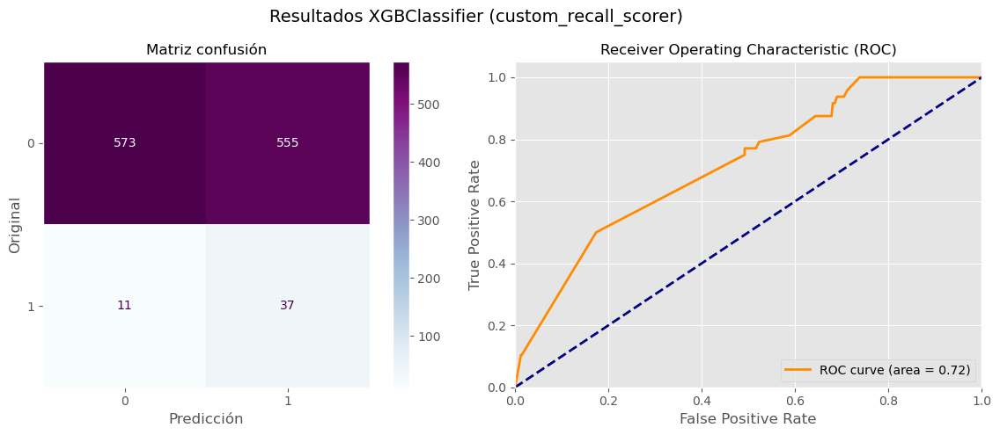

                     0          1  accuracy    macro avg  weighted avg
precision     0.981164   0.062500  0.518707     0.521832      0.943668
recall        0.507979   0.770833  0.518707     0.639406      0.518707
f1-score      0.669393   0.115625  0.518707     0.392509      0.646790
support    1128.000000  48.000000  0.518707  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.5187 || Clase 1: 0.7708 || Clase 0: 0.5080
Precisión total: 0.9437 || Clase 1: 0.0625 || Clase 0: 0.9812
F1 total: 0.6468 || Clase 1: 0.1156 || Clase 0: 0.6694
ROC AUC: 0.6394
Fitting 5 folds for each of 336 candidates, totalling 1680 fits
El mejor meta-parámetro encontrado: {'xbg__max_depth': None, 'xbg__n_estimators': 2, 'xbg__reg_alpha': 0.01, 'xbg__scale_pos_weight': 30}
El mejor score es: 5.142268506090636


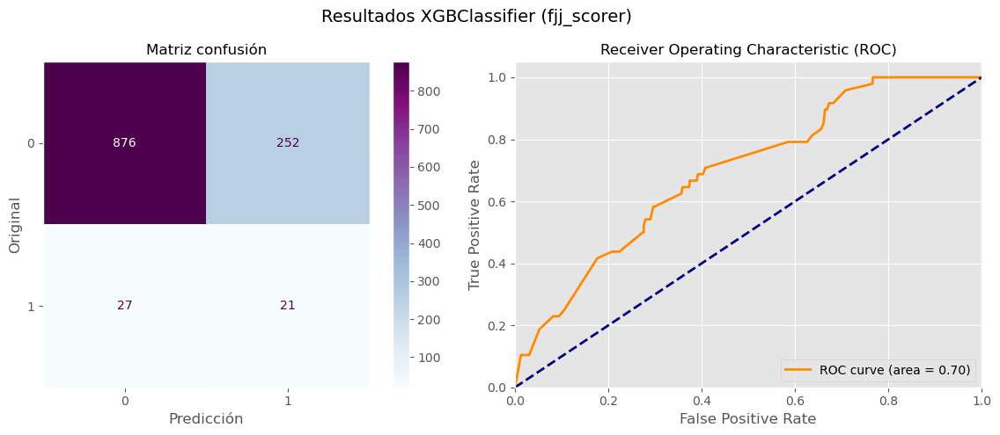

                     0          1  accuracy    macro avg  weighted avg
precision     0.970100   0.076923  0.762755     0.523511      0.933643
recall        0.776596   0.437500  0.762755     0.607048      0.762755
f1-score      0.862629   0.130841  0.762755     0.496735      0.832760
support    1128.000000  48.000000  0.762755  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.7628 || Clase 1: 0.4375 || Clase 0: 0.7766
Precisión total: 0.9336 || Clase 1: 0.0769 || Clase 0: 0.9701
F1 total: 0.8328 || Clase 1: 0.1308 || Clase 0: 0.8626
ROC AUC: 0.6070


In [253]:
metricas = [recall_scorer, f1_scorer, custom_recall_scorer, fjj_scorer]
nombres_metricas = ['recall_scorer', 'f1_scorer', 'custom_recall_scorer', 'fjj_scorer']
titulo = 'XGBClassifier'

for metrica, nombre_metrica in zip(metricas, nombres_metricas):

    xbg_ovs = imbalanced_pipeline([
                                    ('xbg', XGBClassifier(random_state=SEED))
                                    ])

    # Se definen los meta-parámetros que se quieren optimizar con GridSearchCV.
    parameters = {
        'xbg__n_estimators': [2, 5, 10, 50],
        'xbg__max_depth': [3, 5, 7, None],
        'xbg__reg_alpha': [0.01, 0.015, 0.02],
        'xbg__scale_pos_weight': [1, 10, 30, 50, 70, 99, 100]
    }

    # Se aplica GridSearchCV para encontrar los mejores meta-parámetros
    grid_search_xgb_ovs = GridSearchCV(xbg_ovs, parameters, cv=5, n_jobs=-1, scoring=metrica, verbose=3) # recall_scorer, f1_scorer, custom_recall_scorer
    grid_search_xgb_ovs.fit(X_train, y_train)

    # Se muestran por pantalla los mejores meta-parámetros encontrados
    print(f"El mejor meta-parámetro encontrado: {grid_search_xgb_ovs.best_params_}")
    print(f"El mejor score es: {grid_search_xgb_ovs.best_score_}")

    resultado = pd.DataFrame(evaluacion_clasificacion(grid_search_xgb_ovs,  titulo + ' (' + nombre_metrica + ')', X_val, y_val, plot=True, show_print=True))
    resultado['modelo'] = titulo + ' (' + nombre_metrica + ')'
    resultados_rl_list.append(resultado)

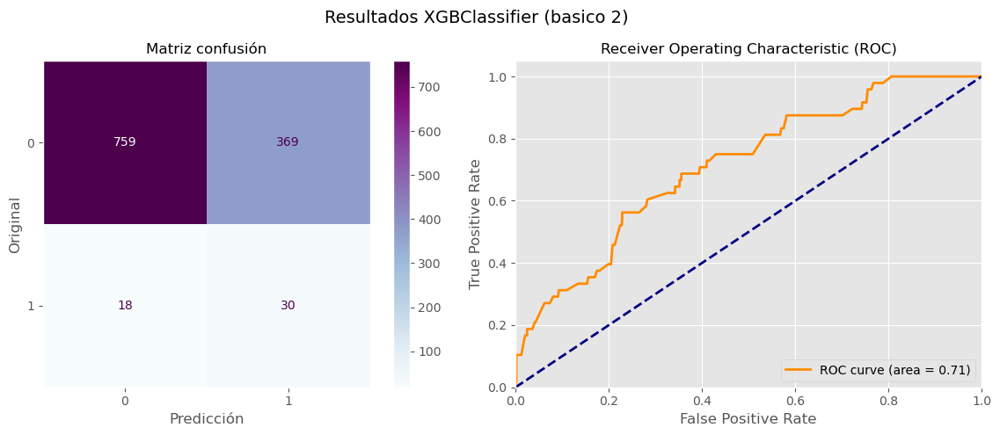

                     0          1  accuracy    macro avg  weighted avg
precision     0.976834   0.075188  0.670918     0.526011      0.940032
recall        0.672872   0.625000  0.670918     0.648936      0.670918
f1-score      0.796850   0.134228  0.670918     0.465539      0.769805
support    1128.000000  48.000000  0.670918  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.6709 || Clase 1: 0.6250 || Clase 0: 0.6729
Precisión total: 0.9400 || Clase 1: 0.0752 || Clase 0: 0.9768
F1 total: 0.7698 || Clase 1: 0.1342 || Clase 0: 0.7969
ROC AUC: 0.6489


In [255]:
xgb = XGBClassifier(n_estimators = 5, random_state=SEED, eval_metric=recall_scorer, scale_pos_weight=60)
xgb.fit(X_train, y_train)
resultado = pd.DataFrame(evaluacion_clasificacion(xgb, 'XGBClassifier (basico 2)', X_val, y_val, proba=True, plot=True, show_print=True))
resultado['modelo'] = 'XGBClassifier (basico 2)'
resultados_rl_list.append(resultado)

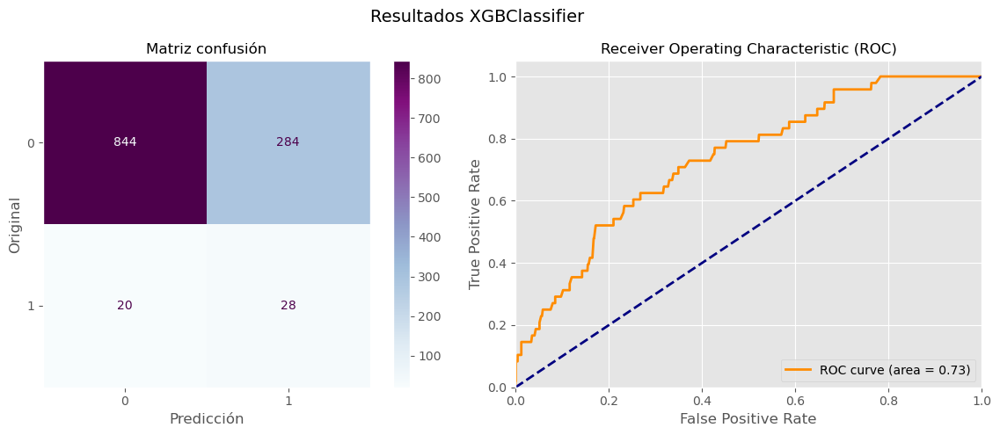

                     0          1  accuracy    macro avg  weighted avg
precision     0.976852   0.089744  0.741497     0.533298      0.940643
recall        0.748227   0.583333  0.741497     0.665780      0.741497
f1-score      0.847390   0.155556  0.741497     0.501473      0.819151
support    1128.000000  48.000000  0.741497  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.7415 || Clase 1: 0.5833 || Clase 0: 0.7482
Precisión total: 0.9406 || Clase 1: 0.0897 || Clase 0: 0.9769
F1 total: 0.8192 || Clase 1: 0.1556 || Clase 0: 0.8474
ROC AUC: 0.6658


In [246]:
xgb = XGBClassifier(n_estimators = 7, random_state=SEED, eval_metric=recall_scorer, scale_pos_weight=60)
xgb.fit(X_train, y_train)
resultado = pd.DataFrame(evaluacion_clasificacion(xgb, 'XGBClassifier', X_val, y_val, plot=True, show_print=True))
resultado['modelo'] = 'XGBClassifier'
resultados_rl_list.append(resultado)

Fitting 15 folds for each of 144 candidates, totalling 2160 fits
Mejores meta-parámetros:  {'classification__max_depth': 5, 'classification__n_estimators': 50, 'classification__reg_alpha': 0.015}
Mejor score:  0.17284900284900287


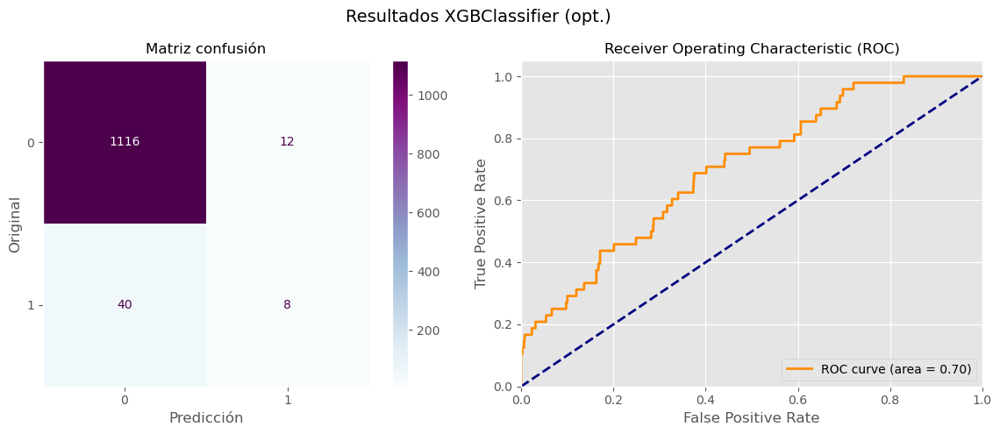

                     0          1  accuracy    macro avg  weighted avg
precision     0.965398   0.400000  0.955782     0.682699      0.942320
recall        0.989362   0.166667  0.955782     0.578014      0.955782
f1-score      0.977233   0.235294  0.955782     0.606264      0.946950
support    1128.000000  48.000000  0.955782  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.9558 || Clase 1: 0.1667 || Clase 0: 0.9894
Precisión total: 0.9423 || Clase 1: 0.4000 || Clase 0: 0.9654
F1 total: 0.9469 || Clase 1: 0.2353 || Clase 0: 0.9772
ROC AUC: 0.5780


In [247]:
# Se crea el modelo de clasificación XGBClassifier
xgb = XGBClassifier(n_estimators = 5, random_state=SEED, eval_metric=recall_scorer, scale_pos_weight=sum(y_train==0)/sum(y_train==1))

# Se crea el pipeline que incluya la selección de variables y el modelo de clasificación
xgbc = Pipeline([
  #('scaler', StandardScaler()),
  ('classification', xgb)
])

# Se define parameter grid con los meta-parámetros a probar
param_grid = {
    'classification__n_estimators': [2, 5, 10, 50, 200, 400],
    'classification__max_depth': [3, 5, 7, 11],
    'classification__reg_alpha': [0.0, 0.001, 0.01, 0.015, 0.02, 0.03]
}

# Se realiza la búsqueda de meta-parámetros utilizando GridSearchCV
grid_search_xgb = GridSearchCV(xgbc, param_grid=param_grid, cv=15, verbose=1, n_jobs=-1, scoring = f1_scorer)

# Se hace el Fit del grid_search a los datos de entrenamiento
grid_search_xgb.fit(X_train, y_train)

# Se muestran los mejores meta-parámetros y el score
print("Mejores meta-parámetros: ", grid_search_xgb.best_params_)
print("Mejor score: ", grid_search_xgb.best_score_)

# Se evalúa el modelo
resultado = pd.DataFrame(evaluacion_clasificacion(grid_search_xgb, 'XGBClassifier (opt.)', X_val, y_val, proba=True, plot=True, show_print=True))
resultado['modelo'] = 'XGBClassifier opt'
resultados_rl_list.append(resultado)

Fitting 15 folds for each of 144 candidates, totalling 2160 fits


One or more of the test scores are non-finite: [nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan]


Mejores meta-parámetros:  {'classification__max_depth': 3, 'classification__n_estimators': 2, 'classification__reg_alpha': 0.0}
Mejor score:  nan


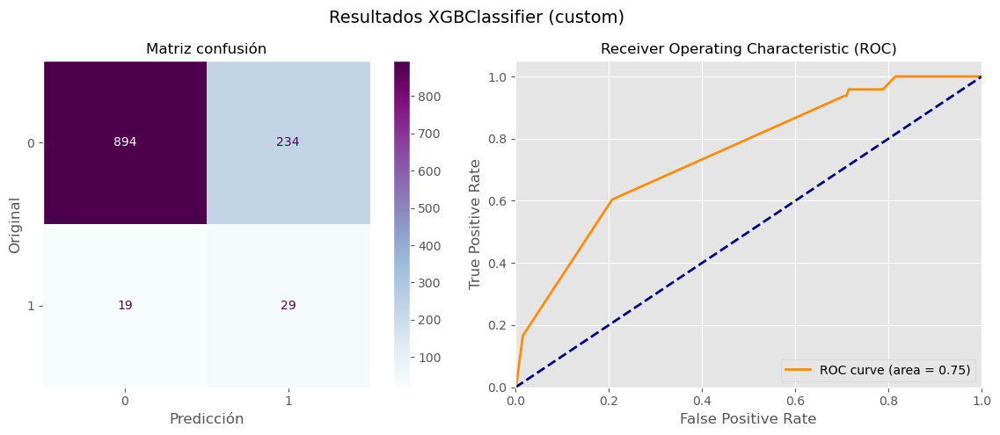

                     0          1  accuracy    macro avg  weighted avg
precision     0.979189   0.110266  0.784864     0.544728      0.943723
recall        0.792553   0.604167  0.784864     0.698360      0.784864
f1-score      0.876041   0.186495  0.784864     0.531268      0.847896
support    1128.000000  48.000000  0.784864  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.7849 || Clase 1: 0.6042 || Clase 0: 0.7926
Precisión total: 0.9437 || Clase 1: 0.1103 || Clase 0: 0.9792
F1 total: 0.8479 || Clase 1: 0.1865 || Clase 0: 0.8760
ROC AUC: 0.6984


In [248]:
# Se crea el modelo de clasificación XGBClassifier
xgb = XGBClassifier(n_estimators = 5, random_state=SEED, eval_metric=recall_scorer, scale_pos_weight=sum(y_train==0)/sum(y_train==1))

# Se crea el pipeline que incluya la selección de variables y el modelo de clasificación
xgbc = Pipeline([
  ('scaler', StandardScaler()),
  ('classification', xgb)
])

# Se define parameter grid con los meta-parámetros a probar
param_grid = {
    'classification__n_estimators': [2, 5, 10, 50, 200, 400],
    'classification__max_depth': [3, 5, 7, 11],
    'classification__reg_alpha': [0.0, 0.001, 0.01, 0.015, 0.02, 0.03]
}

# Se realiza la búsqueda de meta-parámetros utilizando GridSearchCV
grid_search_xgb = GridSearchCV(xgbc, param_grid=param_grid, cv=15, verbose=1, n_jobs=-1, scoring = custom_recall_loss)

# Se hace el Fit del grid_search a los datos de entrenamiento
grid_search_xgb.fit(X_train, y_train)

# Se muestran los mejores meta-parámetros y el score
print("Mejores meta-parámetros: ", grid_search_xgb.best_params_)
print("Mejor score: ", grid_search_xgb.best_score_)

# Se evalúa el modelo
resultado = pd.DataFrame(evaluacion_clasificacion(grid_search_xgb, 'XGBClassifier (custom)', X_val, y_val, proba=True, plot=True, show_print=True))
resultado['modelo'] = 'XGBClassifier (custom)'
resultados_rl_list.append(resultado)

Fitting 15 folds for each of 90 candidates, totalling 1350 fits
Mejores meta-parámetros:  {'classification__max_depth': 5, 'classification__n_estimators': 2, 'classification__reg_alpha': 0.01}
Mejor score:  5.0869209650989315


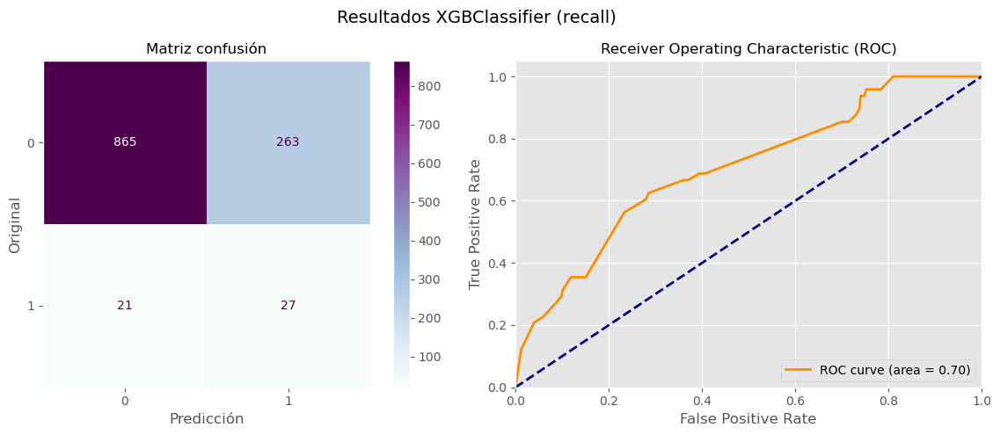

                     0          1  accuracy    macro avg  weighted avg
precision     0.976298   0.093103  0.758503     0.534701      0.940249
recall        0.766844   0.562500  0.758503     0.664672      0.758503
f1-score      0.858987   0.159763  0.758503     0.509375      0.830447
support    1128.000000  48.000000  0.758503  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.7585 || Clase 1: 0.5625 || Clase 0: 0.7668
Precisión total: 0.9402 || Clase 1: 0.0931 || Clase 0: 0.9763
F1 total: 0.8304 || Clase 1: 0.1598 || Clase 0: 0.8590
ROC AUC: 0.6647


In [249]:
# Se crea el modelo de clasificación XGBClassifier
xgb = XGBClassifier(n_estimators = 5, random_state=SEED, eval_metric=recall_scorer, scale_pos_weight=sum(y_train==0)/sum(y_train==1))

# Se crea el pipeline que incluya la selección de variables y el modelo de clasificación
xgbc = Pipeline([
  ('scaler', StandardScaler()),
  ('classification', xgb)
])

# Se define parameter grid con los meta-parámetros a probar
param_grid = {
    'classification__n_estimators': [2, 5, 10, 50, 200, 400],
    'classification__max_depth': [3, 5, 7, 11, None],
    'classification__reg_alpha': [0.01, 0.015, 0.02]
}

# Se realiza la búsqueda de meta-parámetros utilizando GridSearchCV
grid_search_xgb = GridSearchCV(xgbc, param_grid=param_grid, cv=15, verbose=1, n_jobs=-1, scoring = fjj_scorer)

# Se hace el Fit del grid_search a los datos de entrenamiento
grid_search_xgb.fit(X_train, y_train)

# Se muestran los mejores meta-parámetros y el score
print("Mejores meta-parámetros: ", grid_search_xgb.best_params_)
print("Mejor score: ", grid_search_xgb.best_score_)

# Se evalúa el modelo
resultado = pd.DataFrame(evaluacion_clasificacion(grid_search_xgb, 'XGBClassifier (recall)', X_val, y_val, proba=True, plot=True, show_print=True))
resultado['modelo'] = 'XGBClassifier (recall)'
resultados_rl_list.append(resultado)

Fitting 15 folds for each of 72 candidates, totalling 1080 fits
Mejores meta-parámetros:  {'classification__max_depth': 5, 'classification__n_estimators': 2, 'classification__reg_alpha': 0.01}
Mejor score:  0.5968253968253968


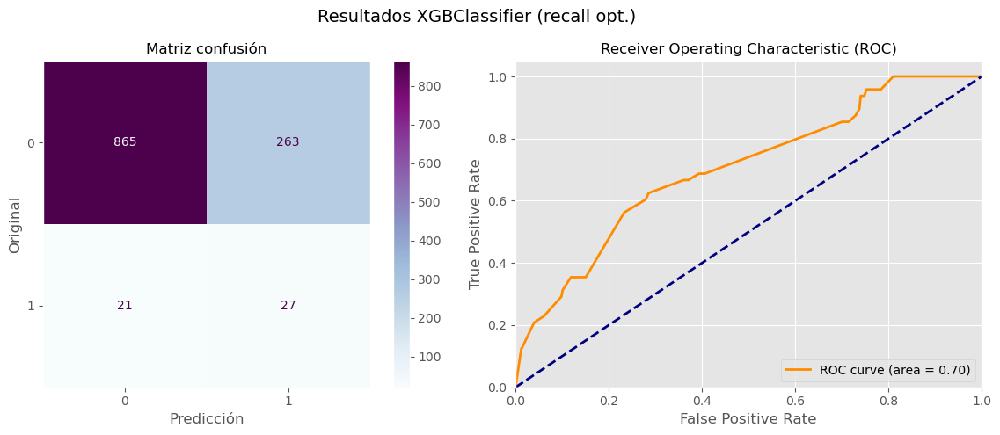

                     0          1  accuracy    macro avg  weighted avg
precision     0.976298   0.093103  0.758503     0.534701      0.940249
recall        0.766844   0.562500  0.758503     0.664672      0.758503
f1-score      0.858987   0.159763  0.758503     0.509375      0.830447
support    1128.000000  48.000000  0.758503  1176.000000   1176.000000
----------------------------------------------------------------------------------------------------
Recall total: 0.7585 || Clase 1: 0.5625 || Clase 0: 0.7668
Precisión total: 0.9402 || Clase 1: 0.0931 || Clase 0: 0.9763
F1 total: 0.8304 || Clase 1: 0.1598 || Clase 0: 0.8590
ROC AUC: 0.6647


In [250]:
# Se crea el modelo de clasificación XGBClassifier
xgb = XGBClassifier(n_estimators = 5, random_state=SEED, eval_metric=recall_scorer, scale_pos_weight=sum(y_train==0)/sum(y_train==1))

# Se crea el pipeline que incluya la selección de variables y el modelo de clasificación
xgbc = Pipeline([
  ('classification', xgb)
])

# Se define parameter grid con los meta-parámetros a probar
param_grid = {
    'classification__n_estimators': [2, 5, 10, 50, 200, 400],
    'classification__max_depth': [3, 5, 7, None],
    'classification__reg_alpha': [0.01, 0.015, 0.02]
}

# Se realiza la búsqueda de meta-parámetros utilizando GridSearchCV
grid_search_xgb = GridSearchCV(xgbc, param_grid=param_grid, cv=15, verbose=1, n_jobs=-1, scoring = recall_scorer)

# Se hace el Fit del grid_search a los datos de entrenamiento
grid_search_xgb.fit(X_train, y_train)

# Se muestran los mejores meta-parámetros y el score
print("Mejores meta-parámetros: ", grid_search_xgb.best_params_)
print("Mejor score: ", grid_search_xgb.best_score_)

# Se evalúa el modelo
resultado = pd.DataFrame(evaluacion_clasificacion(grid_search_xgb, 'XGBClassifier (recall opt.)', X_val, y_val, proba=True, plot=True, show_print=True))
resultado['modelo'] = 'XGBClassifier (recall opt.)'
resultados_rl_list.append(resultado)

## Oversampling

### 1. Random Over Sampling

Random Over Sampling balances the data by replicating the minority class samples. This does not cause any loss of information, but the dataset is prone to overfitting as the same information is copied.

https://www.kaggle.com/code/residentmario/undersampling-and-oversampling-imbalanced-data

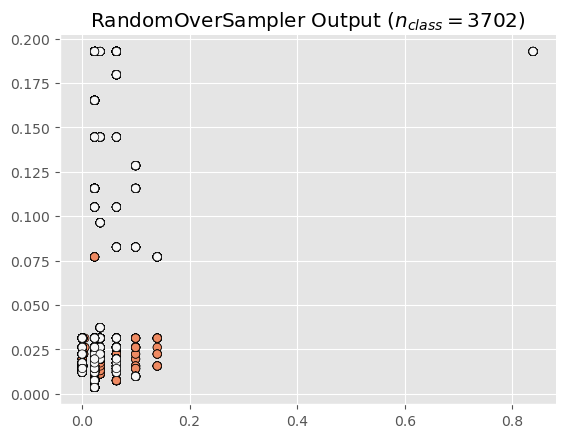

In [187]:
ros = RandomOverSampler(random_state=SEED)
ros.fit(variables, target)
X_resampled, y_resampled = ros.fit_resample(variables, target)
colors = ['#ef8a62' if v == 0 else '#f7f7f7' if v == 1 else '#67a9cf' for v in y_resampled]
plt.scatter(X_resampled.iloc[:, 0], X_resampled.iloc[:, 1], c=colors, linewidth=0.5, edgecolor='black')
sns.despine()
plt.title("RandomOverSampler Output ($n_{class}=3702)$")
pass

In [188]:
def plot_decision_function(X, y, clf, ax):
    plot_step = 0.02
    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, plot_step),
                         np.arange(y_min, y_max, plot_step))

    Z = clf.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)
    ax.contourf(xx, yy, Z, alpha=0.4)
    ax.scatter(X[:, 0], X[:, 1], alpha=0.8, c=y, edgecolor='k')

### 2. SMOTE
SMOTE stands for Synthetic Minority Oversampling Technique. It works by utilizing a k-nearest neighbor algorithm to create synthetic data.

Definición de: https://www.kaggle.com/discussions/general/276868

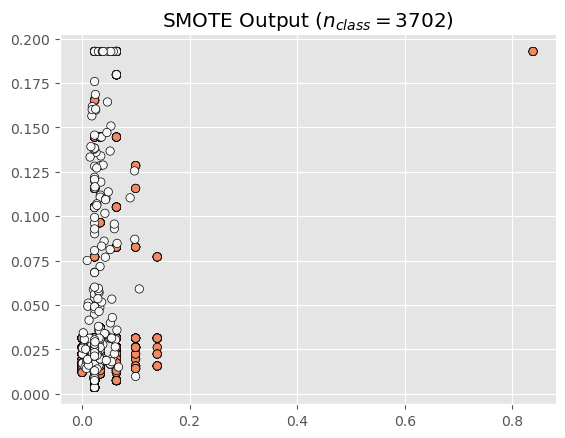

In [209]:
porcentaje_a_igualar = 0.1

x_oversampled, y_oversampled = SMOTE(
    random_state=SEED, 
    sampling_strategy=porcentaje_a_igualar
).fit_resample(variables, target)

colors = ['#ef8a62' if v == 0 else '#f7f7f7' if v == 1 else '#67a9cf' for v in y_oversampled]
plt.scatter(x_oversampled.iloc[:, 0], x_oversampled.iloc[:, 1], c=colors, linewidth=0.5, edgecolor='black')
sns.despine()
plt.title("SMOTE Output ($n_{class}=3702)$")
pass


In [206]:
new_train = pd.DataFrame(x_oversampled)
new_train["gravedad"] = y_oversampled


In [208]:
new_train['gravedad'].value_counts(), df_accidentes['gravedad'].value_counts()

(0    3702
 1     370
 Name: gravedad, dtype: int64,
 0    3702
 1     143
 Name: gravedad, dtype: int64)

### 3. BorderLine SMOTE

Due to the presence of some minority points or outliers within the region of majority class points, bridges of minority class points are created. This is a problem in the case of Smote and is solved using Borderline Smote.


### 4. KMeans SMOTE

K-Means SMOTE aids classification by generating minority class samples in safe and crucial areas of the input space. The method avoids the generation of noise and effectively overcomes imbalances between and within classes

# Ideas

RECURSOS
https://www.kaggle.com/code/janiobachmann/credit-fraud-dealing-with-imbalanced-datasets/notebook
https://www.kaggle.com/competitions/playground-series-s3e2/discussion/377373
https://www.kaggle.com/discussions/general/276868
https://www.kaggle.com/code/residentmario/undersampling-and-oversampling-imbalanced-data
https://www.kaggle.com/search?q=oversampling
https://aprendemachinelearning.com/clasificacion-con-datos-desbalanceados/

En bibliotecas como scikit-learn en Python, puedes acceder a los coeficientes de carga después de ajustar el modelo PCA utilizando el atributo components_ de la instancia del modelo. Aquí hay un ejemplo de cómo podrías hacerlo: